In [ ]:
!pip -q install cfgrib eccodes
import os, sys
os.kill(os.getpid(), 9)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.1/56.1 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.5/91.5 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.0/9.0 MB 97.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 123.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.5/11.5 MB 98.6 MB/s eta 0:00:00


In [ ]:
!pip install regionmask

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.3/72.3 kB 4.3 MB/s eta 0:00:00


In [ ]:
import os
import math
import random
import numpy as np
import pandas as pd
import xarray as xr
import geopandas as gpd
import regionmask
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

def seed_everything(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(42)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device


device(type='cuda')

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
base_path = "/content/drive/MyDrive/Colab Notebooks/multivariate_rainfall_prediction/Dataset Climate Rainfall"

tp_path  = f"{base_path}/ERA5_Tp_1960-2024.nc"
t2m_path = f"{base_path}/ERA5_2mtemp_1960-2024.nc"
u10_path = f"{base_path}/ERA5_u-wind_1960-2024.nc"
r_path   = f"{base_path}/ERA5_Rh_1960-2024.nc"
tcc_path = f"{base_path}/ERA5_TCC_hourly_1960-2024.grib"

geojson_path = f"{base_path}/GeoJSON"

tp_path, t2m_path, u10_path, r_path, tcc_path, geojson_path


('/content/drive/MyDrive/Colab Notebooks/multivariate_rainfall_prediction/Dataset Climate Rainfall/ERA5_Tp_1960-2024.nc',
 '/content/drive/MyDrive/Colab Notebooks/multivariate_rainfall_prediction/Dataset Climate Rainfall/ERA5_2mtemp_1960-2024.nc',
 '/content/drive/MyDrive/Colab Notebooks/multivariate_rainfall_prediction/Dataset Climate Rainfall/ERA5_u-wind_1960-2024.nc',
 '/content/drive/MyDrive/Colab Notebooks/multivariate_rainfall_prediction/Dataset Climate Rainfall/ERA5_Rh_1960-2024.nc',
 '/content/drive/MyDrive/Colab Notebooks/multivariate_rainfall_prediction/Dataset Climate Rainfall/ERA5_TCC_hourly_1960-2024.grib',
 '/content/drive/MyDrive/Colab Notebooks/multivariate_rainfall_prediction/Dataset Climate Rainfall/GeoJSON')

In [ ]:
import xarray as xr
ds_tcc = xr.open_dataset(tcc_path, engine="cfgrib")
ds_tcc

<xarray.Dataset> Size: 2GB
Dimensions:     (time: 31047, latitude: 113, longitude: 117)
Coordinates:
  * time        (time) datetime64[ns] 248kB 1940-01-01T06:00:00 ... 2024-12-3...
  * latitude    (latitude) float64 904B 37.0 36.75 36.5 36.25 ... 9.5 9.25 9.0
  * longitude   (longitude) float64 936B 68.0 68.25 68.5 ... 96.5 96.75 97.0
    number      int64 8B ...
    step        timedelta64[ns] 8B ...
    surface     float64 8B ...
    valid_time  (time) datetime64[ns] 248kB ...
Data variables:
    tcc         (time, latitude, longitude) float32 2GB ...
Attributes:
    GRIB_edition:            1
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2026-03-05T08:48 GRIB to CDM+CF via cfgrib-0.9.1...

In [ ]:
ds_tp  = xr.open_dataset(tp_path, chunks={"valid_time": 2000})
ds_t2m = xr.open_dataset(t2m_path, chunks={"valid_time": 2000})
ds_u10 = xr.open_dataset(u10_path, chunks={"valid_time": 2000})
ds_r   = xr.open_dataset(r_path, chunks={"valid_time": 2000})
ds_tcc = xr.open_dataset(tcc_path, engine="cfgrib")

ds_tp, ds_t2m, ds_u10, ds_r, ds_tcc


/tmp/ipykernel_3101/3621199332.py:1: UserWarning: The specified chunks separate the stored chunks along dimension "valid_time" starting at index 2000. This could degrade performance. Instead, consider rechunking after loading.
  ds_tp  = xr.open_dataset(tp_path, chunks={"valid_time": 2000})
/tmp/ipykernel_3101/3621199332.py:2: UserWarning: The specified chunks separate the stored chunks along dimension "valid_time" starting at index 2000. This could degrade performance. Instead, consider rechunking after loading.
  ds_t2m = xr.open_dataset(t2m_path, chunks={"valid_time": 2000})
/tmp/ipykernel_3101/3621199332.py:3: UserWarning: The specified chunks separate the stored chunks along dimension "valid_time" starting at index 2000. This could degrade performance. Instead, consider rechunking after loading.
  ds_u10 = xr.open_dataset(u10_path, chunks={"valid_time": 2000})
/tmp/ipykernel_3101/3621199332.py:4: UserWarning: The specified chunks separate the stored chunks along dimension "valid_t

(<xarray.Dataset> Size: 2GB
 Dimensions:     (valid_time: 23742, latitude: 140, longitude: 120)
 Coordinates:
   * valid_time  (valid_time) datetime64[ns] 190kB 1960-01-01 ... 2024-12-31
   * latitude    (latitude) float64 1kB 37.95 37.7 37.45 37.2 ... 3.7 3.45 3.2
   * longitude   (longitude) float64 960B 67.6 67.85 68.1 ... 96.85 97.1 97.35
     number      int64 8B ...
     expver      (valid_time) <U4 380kB dask.array<chunksize=(2000,), meta=np.ndarray>
 Data variables:
     tp          (valid_time, latitude, longitude) float32 2GB dask.array<chunksize=(2000, 28, 24), meta=np.ndarray>
 Attributes:
     GRIB_centre:             ecmf
     GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
     GRIB_subCentre:          0
     Conventions:             CF-1.7
     institution:             European Centre for Medium-Range Weather Forecasts
     history:                 2025-02-27T12:11 GRIB to CDM+CF via cfgrib-0.9.1...,
 <xarray.Dataset> Size: 2GB
 Dimensions:  

In [ ]:
import glob

geo_files = sorted(glob.glob(os.path.join(geojson_path, "*.geojson")) + glob.glob(os.path.join(geojson_path, "*.json")))
gdfs = []
for fp in geo_files:
    gdf = gpd.read_file(fp)
    if gdf.crs is None:
        gdf = gdf.set_crs("EPSG:4326")
    else:
        gdf = gdf.to_crs("EPSG:4326")
    gdf["geometry"] = gdf["geometry"].buffer(0)
    gdfs.append(gdf)

gdf_all = pd.concat(gdfs, ignore_index=True)
geom_union = gdf_all.unary_union

regions = regionmask.Regions([geom_union], names=["HimalayanRegion"], abbrevs=["HR"])
len(geo_files), geo_files[0]


/tmp/ipykernel_3101/222651382.py:15: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  geom_union = gdf_all.unary_union


(10,
 '/content/drive/MyDrive/Colab Notebooks/multivariate_rainfall_prediction/Dataset Climate Rainfall/GeoJSON/Arunachal.geojson')

In [ ]:
print("tp vars:", list(ds_tp.data_vars))
print("t2m vars:", list(ds_t2m.data_vars))
print("r vars:", list(ds_r.data_vars))
print("u-wind vars:", list(ds_u10.data_vars))
print("tcc vars:", list(ds_tcc.data_vars))

tp vars: ['tp']
t2m vars: ['t2m']
r vars: ['r']
u-wind vars: ['u']
tcc vars: ['tcc']


In [ ]:
processed_path = "/content/drive/MyDrive/Colab Notebooks/multivariate_rainfall_prediction/processed_regional_timeseries.parquet"
df = pd.read_parquet(processed_path)

df.shape

(23742, 7)

In [ ]:
df.to_parquet(processed_path, index=False)

In [ ]:
df.shape, df.head()

((23742, 7),
   valid_time  tp_region_max_mm  tp_region_mean_mm  t2m_region   r_region  \
 0 1960-01-01          0.774622           0.006109  262.660311  19.671186   
 1 1960-01-02          0.805855           0.005734  262.629726  20.926420   
 2 1960-01-03          0.750303           0.005351  262.912531  21.786082   
 3 1960-01-04          0.544190           0.003756  263.405828  15.542789   
 4 1960-01-05          0.549436           0.006841  265.184858  12.428462   
 
     u_region  tcc_region  
 0  27.632738    0.158903  
 1  26.502035    0.168239  
 2  24.900148    0.105190  
 3  27.271817    0.161768  
 4  26.933151    0.215078  )

In [ ]:
import numpy as np
import pandas as pd

df = df.sort_values("valid_time").reset_index(drop=True)
df["month"] = df["valid_time"].dt.month

p99_by_month = df.groupby("month")["tp_region_max_mm"].quantile(0.99)
df["p99_thr"] = df["month"].map(p99_by_month)

df["y"] = (df["tp_region_max_mm"] > df["p99_thr"]).astype(np.int8)

pos_ratio = df["y"].mean()
counts = df["y"].value_counts().to_dict()

pos_ratio, counts, p99_by_month

(np.float64(0.010361384887541066),
 {0: 23496, 1: 246},
 month
 1      4.742103
 2      5.854645
 3      9.669113
 4     13.419356
 5     17.683382
 6     21.942744
 7     24.225092
 8     22.515821
 9     17.875972
 10    13.020411
 11     6.788883
 12     4.788294
 Name: tp_region_max_mm, dtype: float64)

In [ ]:
import pandas as pd
import numpy as np

parquet_path = "/content/drive/MyDrive/Colab Notebooks/multivariate_rainfall_prediction/processed_regional_timeseries.parquet"

df = pd.read_parquet(parquet_path)
df["valid_time"] = pd.to_datetime(df["valid_time"])
df = df.sort_values("valid_time").reset_index(drop=True)

print(df.shape)
print(df.head())
print(df.isna().sum())

(23742, 7)
  valid_time  tp_region_max_mm  tp_region_mean_mm  t2m_region   r_region  \
0 1960-01-01          0.774622           0.006109  262.660311  19.671186   
1 1960-01-02          0.805855           0.005734  262.629726  20.926420   
2 1960-01-03          0.750303           0.005351  262.912531  21.786082   
3 1960-01-04          0.544190           0.003756  263.405828  15.542789   
4 1960-01-05          0.549436           0.006841  265.184858  12.428462   

    u_region  tcc_region  
0  27.632738    0.158903  
1  26.502035    0.168239  
2  24.900148    0.105190  
3  27.271817    0.161768  
4  26.933151    0.215078  
valid_time           0
tp_region_max_mm     0
tp_region_mean_mm    0
t2m_region           0
r_region             0
u_region             0
tcc_region           0
dtype: int64


In [ ]:
df["month"] = df["valid_time"].dt.month

p99_by_month = df.groupby("month")["tp_region_max_mm"].quantile(0.99)
df["spike"] = df.apply(lambda row: 1 if row["tp_region_max_mm"] >= p99_by_month.loc[row["month"]] else 0, axis=1)

counts = df["spike"].value_counts().to_dict()
pos_ratio = df["spike"].mean()

print("Spike counts:", counts)
print("Pos ratio:", pos_ratio)
print("\nMonthly p99 thresholds (mm):")
print(p99_by_month)

Spike counts: {0: 23496, 1: 246}
Pos ratio: 0.010361384887541066

Monthly p99 thresholds (mm):
month
1      4.742103
2      5.854645
3      9.669113
4     13.419356
5     17.683382
6     21.942744
7     24.225092
8     22.515821
9     17.875972
10    13.020411
11     6.788883
12     4.788294
Name: tp_region_max_mm, dtype: float64


In [ ]:
features = ["tp_region_max_mm", "tp_region_mean_mm", "t2m_region", "r_region", "u_region", "tcc_region"]

pearson = df[features].corr(method="pearson")
spearman = df[features].corr(method="spearman")

print("Pearson correlation:\n", pearson)
print("\nSpearman correlation:\n", spearman)

Pearson correlation:
                    tp_region_max_mm  tp_region_mean_mm  t2m_region  r_region  \
tp_region_max_mm           1.000000           0.801051    0.602316  0.512448   
tp_region_mean_mm          0.801051           1.000000    0.526045  0.416842   
t2m_region                 0.602316           0.526045    1.000000  0.823234   
r_region                   0.512448           0.416842    0.823234  1.000000   
u_region                  -0.563088          -0.452584   -0.910913 -0.790169   
tcc_region                 0.422601           0.542535    0.486571  0.322870   

                   u_region  tcc_region  
tp_region_max_mm  -0.563088    0.422601  
tp_region_mean_mm -0.452584    0.542535  
t2m_region        -0.910913    0.486571  
r_region          -0.790169    0.322870  
u_region           1.000000   -0.401303  
tcc_region        -0.401303    1.000000  

Spearman correlation:
                    tp_region_max_mm  tp_region_mean_mm  t2m_region  r_region  \
tp_region_max_mm   

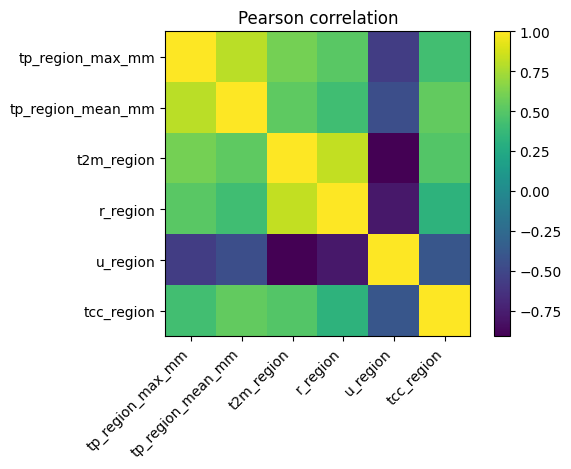

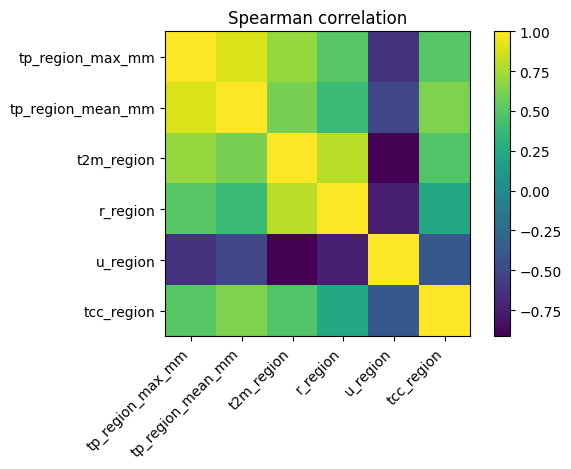

In [ ]:
import matplotlib.pyplot as plt

plt.figure()
plt.imshow(pearson.values)
plt.xticks(range(len(features)), features, rotation=45, ha="right")
plt.yticks(range(len(features)), features)
plt.colorbar()
plt.title("Pearson correlation")
plt.tight_layout()
plt.show()

plt.figure()
plt.imshow(spearman.values)
plt.xticks(range(len(features)), features, rotation=45, ha="right")
plt.yticks(range(len(features)), features)
plt.colorbar()
plt.title("Spearman correlation")
plt.tight_layout()
plt.show()

In [ ]:
lags = [1, 3, 7, 14, 30]
predictors = ["t2m_region", "r_region", "u_region", "tcc_region", "tp_region_mean_mm"]

rows = []
for col in predictors:
    for L in lags:
        x = df[col].shift(L)              # predictor L days BEFORE
        y = df["tp_region_max_mm"]        # current day rainfall max
        corr = x.corr(y)                  # Pearson
        rows.append((col, L, corr))

lag_corr = pd.DataFrame(rows, columns=["feature", "lag_days", "corr_with_tpmax"])
lag_corr = lag_corr.sort_values("corr_with_tpmax", key=lambda s: s.abs(), ascending=False)

print(lag_corr.head(20))

              feature  lag_days  corr_with_tpmax
0          t2m_region         1         0.608447
1          t2m_region         3         0.600220
20  tp_region_mean_mm         1         0.589476
2          t2m_region         7         0.569276
11           u_region         3        -0.569145
10           u_region         1        -0.564923
12           u_region         7        -0.552212
3          t2m_region        14         0.531549
5            r_region         1         0.520746
13           u_region        14        -0.519755
6            r_region         3         0.514828
7            r_region         7         0.462508
4          t2m_region        30         0.427548
15         tcc_region         1         0.411840
14           u_region        30        -0.410349
21  tp_region_mean_mm         3         0.408022
8            r_region        14         0.405976
16         tcc_region         3         0.359337
22  tp_region_mean_mm         7         0.337864
23  tp_region_mean_m

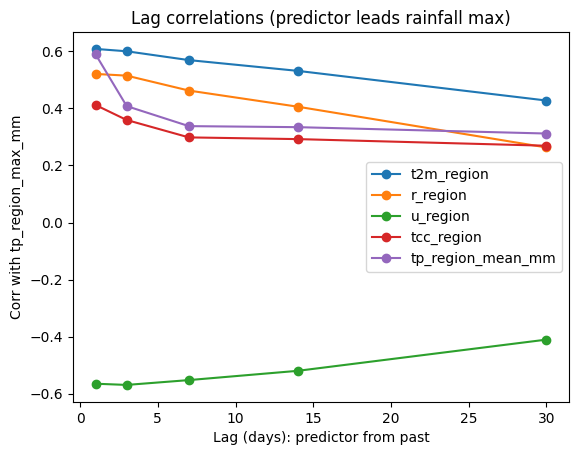

In [ ]:
plt.figure()
for col in predictors:
    vals = []
    for L in lags:
        vals.append(df[col].shift(L).corr(df["tp_region_max_mm"]))
    plt.plot(lags, vals, marker="o", label=col)
plt.xlabel("Lag (days): predictor from past")
plt.ylabel("Corr with tp_region_max_mm")
plt.title("Lag correlations (predictor leads rainfall max)")
plt.legend()
plt.show()

In [ ]:
def cohens_d(a, b):
    a = np.asarray(a); b = np.asarray(b)
    a = a[~np.isnan(a)]; b = b[~np.isnan(b)]
    na, nb = len(a), len(b)
    va, vb = a.var(ddof=1), b.var(ddof=1)
    pooled = np.sqrt(((na-1)*va + (nb-1)*vb) / (na+nb-2))
    return (a.mean() - b.mean()) / pooled if pooled > 0 else np.nan

spike_df = df[df["spike"] == 1]
non_df   = df[df["spike"] == 0]

stats = []
for col in ["t2m_region", "r_region", "u_region", "tcc_region", "tp_region_mean_mm"]:
    d = cohens_d(spike_df[col].values, non_df[col].values)
    stats.append({
        "feature": col,
        "mean_spike": spike_df[col].mean(),
        "mean_non_spike": non_df[col].mean(),
        "cohens_d": d
    })

effect_table = pd.DataFrame(stats).sort_values("cohens_d", key=lambda s: s.abs(), ascending=False)
print(effect_table)

             feature  mean_spike  mean_non_spike  cohens_d
4  tp_region_mean_mm    0.639855        0.195126  2.191734
3         tcc_region    0.629731        0.530223  0.538102
0         t2m_region  276.100151      275.005837  0.149571
2           u_region   15.229724       16.749919 -0.115353
1           r_region   33.226773       32.001969  0.062131


In [ ]:
from sklearn.feature_selection import mutual_info_classif

X = df[["t2m_region", "r_region", "u_region", "tcc_region", "tp_region_mean_mm"]].copy()
y = df["spike"].astype(int).values

# fill missing if any
X = X.fillna(method="ffill").fillna(method="bfill")

mi = mutual_info_classif(X.values, y, discrete_features=False, random_state=42)
mi_table = pd.DataFrame({"feature": X.columns, "mutual_info": mi}).sort_values("mutual_info", ascending=False)

print(mi_table)

/tmp/ipykernel_3101/2915411330.py:7: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  X = X.fillna(method="ffill").fillna(method="bfill")


             feature  mutual_info
4  tp_region_mean_mm     0.013704
3         tcc_region     0.001500
0         t2m_region     0.000458
2           u_region     0.000000
1           r_region     0.000000


In [ ]:
# --- Inputs produced earlier ---
# lag_corr: columns [feature, lag_days, corr_with_tpmax]
# effect_table: columns [feature, cohens_d, mean_spike, mean_non_spike]
# mi_table: columns [feature, mutual_info]

import numpy as np
import pandas as pd

# Thresholds (paper-defendable defaults; you can tweak later)
LAGCORR_THR = 0.10      # abs corr >= 0.10 at any lag is meaningful in climate time series
COHEND_THR  = 0.20      # small effect size cutoff
MI_TOPK     = 3         # top 3 by MI

# 1) Lag-corr criterion: max abs corr over lags
lag_score = (
    lag_corr.groupby("feature")["corr_with_tpmax"]
    .apply(lambda s: float(np.nanmax(np.abs(s.values))))
    .reset_index(name="max_abs_lagcorr")
)
lag_score["pass_lagcorr"] = lag_score["max_abs_lagcorr"] >= LAGCORR_THR

# 2) Effect size criterion
eff = effect_table[["feature", "cohens_d"]].copy()
eff["abs_d"] = eff["cohens_d"].abs()
eff["pass_effect"] = eff["abs_d"] >= COHEND_THR

# 3) MI criterion (top K)
mi = mi_table.copy()
mi["rank_mi"] = mi["mutual_info"].rank(ascending=False, method="min")
mi["pass_mi"] = mi["rank_mi"] <= MI_TOPK

# Merge
score = lag_score.merge(eff, on="feature", how="outer").merge(mi[["feature","mutual_info","rank_mi","pass_mi"]], on="feature", how="outer")

# Count passed criteria
score["pass_count"] = score[["pass_lagcorr","pass_effect","pass_mi"]].fillna(False).sum(axis=1)

score = score.sort_values(["pass_count","max_abs_lagcorr","abs_d","mutual_info"], ascending=False)
print(score)

selected_features = score.loc[score["pass_count"] >= 2, "feature"].tolist()
print("\nSelected features (>=2 criteria):", selected_features)

             feature  max_abs_lagcorr  pass_lagcorr  cohens_d     abs_d  \
3  tp_region_mean_mm         0.589476          True  2.191734  2.191734   
2         tcc_region         0.411840          True  0.538102  0.538102   
1         t2m_region         0.608447          True  0.149571  0.149571   
4           u_region         0.569145          True -0.115353  0.115353   
0           r_region         0.520746          True  0.062131  0.062131   

   pass_effect  mutual_info  rank_mi  pass_mi  pass_count  
3         True     0.013704      1.0     True           3  
2         True     0.001500      2.0     True           3  
1        False     0.000458      3.0     True           2  
4        False     0.000000      4.0    False           1  
0        False     0.000000      4.0    False           1  

Selected features (>=2 criteria): ['tp_region_mean_mm', 'tcc_region', 't2m_region']


In [ ]:
out_dir = "/content/drive/MyDrive/Colab Notebooks/multivariate_rainfall_prediction/paper_outputs"
import os
os.makedirs(out_dir, exist_ok=True)

lag_corr.to_csv(f"{out_dir}/lag_correlation_table.csv", index=False)
effect_table.to_csv(f"{out_dir}/spike_vs_nonspike_effect_table.csv", index=False)
mi_table.to_csv(f"{out_dir}/mutual_info_table.csv", index=False)
score.to_csv(f"{out_dir}/feature_selection_score.csv", index=False)

print("Saved tables to:", out_dir)

# Optional: quick LaTeX table export (small tables only)
print("\nLaTeX (MI table):")
print(mi_table.to_latex(index=False, float_format="%.4f"))

Saved tables to: /content/drive/MyDrive/Colab Notebooks/multivariate_rainfall_prediction/paper_outputs

LaTeX (MI table):
\begin{tabular}{lr}
\toprule
feature & mutual_info \\
\midrule
tp_region_mean_mm & 0.0137 \\
tcc_region & 0.0015 \\
t2m_region & 0.0005 \\
u_region & 0.0000 \\
r_region & 0.0000 \\
\bottomrule
\end{tabular}



In [ ]:
import numpy as np
import pandas as pd

base_feats = ["t2m_region", "r_region", "u_region", "tcc_region", "tp_region_mean_mm"]

def cohens_d(a, b):
    a = np.asarray(a); b = np.asarray(b)
    a = a[~np.isnan(a)]; b = b[~np.isnan(b)]
    na, nb = len(a), len(b)
    va, vb = a.var(ddof=1), b.var(ddof=1)
    pooled = np.sqrt(((na-1)*va + (nb-1)*vb) / (na+nb-2))
    return (a.mean() - b.mean()) / pooled if pooled > 0 else np.nan

spike_df = df[df["spike"] == 1]
non_df   = df[df["spike"] == 0]

rows = []
for col in base_feats:
    rows.append({
        "feature": col,
        "mean_spike": spike_df[col].mean(),
        "mean_nonspike": non_df[col].mean(),
        "cohens_d": cohens_d(spike_df[col], non_df[col]),
    })

effect_table = pd.DataFrame(rows).sort_values("cohens_d", key=lambda s: s.abs(), ascending=False)
effect_table

,feature,mean_spike,mean_nonspike,cohens_d
4,tp_region_mean_mm,0.639855,0.195126,2.191734
3,tcc_region,0.629731,0.530223,0.538102
0,t2m_region,276.100151,275.005837,0.149571
2,u_region,15.229724,16.749919,-0.115353
1,r_region,33.226773,32.001969,0.062131


In [ ]:
lags = [1, 3, 7, 14, 30]
rows = []

for col in base_feats:
    for L in lags:
        x = df[col].shift(L)              # predictor from past
        y = df["tp_region_max_mm"]        # event intensity (current)
        rows.append({
            "feature": col,
            "lag_days": L,
            "pearson": x.corr(y),
            "spearman": x.corr(y, method="spearman")
        })

lag_table = pd.DataFrame(rows)
lag_table["max_abs_pearson_per_feature"] = lag_table.groupby("feature")["pearson"].transform(lambda s: np.nanmax(np.abs(s)))
lag_table.sort_values(["max_abs_pearson_per_feature", "feature", "lag_days"], ascending=[False, True, True]).head(50)

,feature,lag_days,pearson,spearman,max_abs_pearson_per_feature
0,t2m_region,1,0.608447,0.702014,0.608447
1,t2m_region,3,0.600220,0.690498,0.608447
2,t2m_region,7,0.569276,0.649052,0.608447
3,t2m_region,14,0.531549,0.602996,0.608447
4,t2m_region,30,0.427548,0.471020,0.608447
20,tp_region_mean_mm,1,0.589476,0.729484,0.589476
21,tp_region_mean_mm,3,0.408022,0.546905,0.589476
22,tp_region_mean_mm,7,0.337864,0.453150,0.589476
23,tp_region_mean_mm,14,0.334248,0.448150,0.589476
24,tp_region_mean_mm,30,0.311919,0.415787,0.589476


In [ ]:
from sklearn.feature_selection import mutual_info_classif

X = df[base_feats].copy().ffill().bfill()
y = df["spike"].astype(int).values

mi = mutual_info_classif(X.values, y, discrete_features=False, random_state=42)
mi_table = pd.DataFrame({"feature": base_feats, "mutual_info": mi}).sort_values("mutual_info", ascending=False)
mi_table

,feature,mutual_info
4,tp_region_mean_mm,0.013704
3,tcc_region,0.001500
0,t2m_region,0.000458
2,u_region,0.000000
1,r_region,0.000000


In [ ]:
LAGCORR_THR = 0.10   # you can lower to 0.07 if signals are weak
COHEND_THR  = 0.20
MI_TOPK     = 3

# max abs lag corr per feature
max_lag = lag_table.groupby("feature")["pearson"].apply(lambda s: float(np.nanmax(np.abs(s)))).reset_index(name="max_abs_lagcorr")
max_lag["pass_lagcorr"] = max_lag["max_abs_lagcorr"] >= LAGCORR_THR

eff = effect_table[["feature", "cohens_d"]].copy()
eff["pass_effect"] = eff["cohens_d"].abs() >= COHEND_THR

mi2 = mi_table.copy()
mi2["rank_mi"] = mi2["mutual_info"].rank(ascending=False, method="min")
mi2["pass_mi"] = mi2["rank_mi"] <= MI_TOPK

score = max_lag.merge(eff, on="feature").merge(mi2[["feature","mutual_info","rank_mi","pass_mi"]], on="feature")
score["pass_count"] = score[["pass_lagcorr","pass_effect","pass_mi"]].sum(axis=1)
score.sort_values(["pass_count","max_abs_lagcorr","cohens_d","mutual_info"], ascending=False)

,feature,max_abs_lagcorr,pass_lagcorr,cohens_d,pass_effect,mutual_info,rank_mi,pass_mi,pass_count
3,tp_region_mean_mm,0.589476,True,2.191734,True,0.013704,1.0,True,3
2,tcc_region,0.411840,True,0.538102,True,0.001500,2.0,True,3
1,t2m_region,0.608447,True,0.149571,False,0.000458,3.0,True,2
4,u_region,0.569145,True,-0.115353,False,0.000000,4.0,False,1
0,r_region,0.520746,True,0.062131,False,0.000000,4.0,False,1


To find which ERA5 variables are actually influencing cloudburst-type precipitation, you need to stop using “overall correlation on all days” and instead do event-focused + lead-lag + conditional dependence. Here’s the clean workflow (and exactly what to run) using your existing dataframe.

What to do (paper-valid approach)
1) Define “cloudburst event days” (you already did this correctly)

Use your month-wise p99 on tp_region_max_mm → spike=1.
This makes the analysis about extremes, not normal rainfall.

2) Measure how each variable changes on event days

This answers: “Is this variable systematically different during cloudburst events?”

Use:

Effect size (Cohen’s d / Cliff’s delta): spike vs non-spike

Mann–Whitney U / KS test (optional): distribution difference

3) Check lead-lag (causal direction proxy)

For cloudbursts, predictors should show signal before the event, not just on the same day.

Compute correlation (Pearson + Spearman) between:

tp_region_max_mm[t] (event intensity)
and

tcc[t−L], rh[t−L], t2m[t−L], u[t−L], tp_mean[t−L] for lags L = 1,3,7,14

4) Use nonlinear dependence with the event label

Correlation misses nonlinear effects. Add:

Mutual Information (MI) between predictors and spike label

5) Pick “directly affecting” variables (selection rule)

A variable is “event-relevant” if it satisfies 2 out of 3:

strong lead-lag signal (max |lag-corr| ≥ threshold)

strong spike separation (|effect size| ≥ threshold)

high MI rank (top-K)

That gives you a defensible “directly affecting” set.

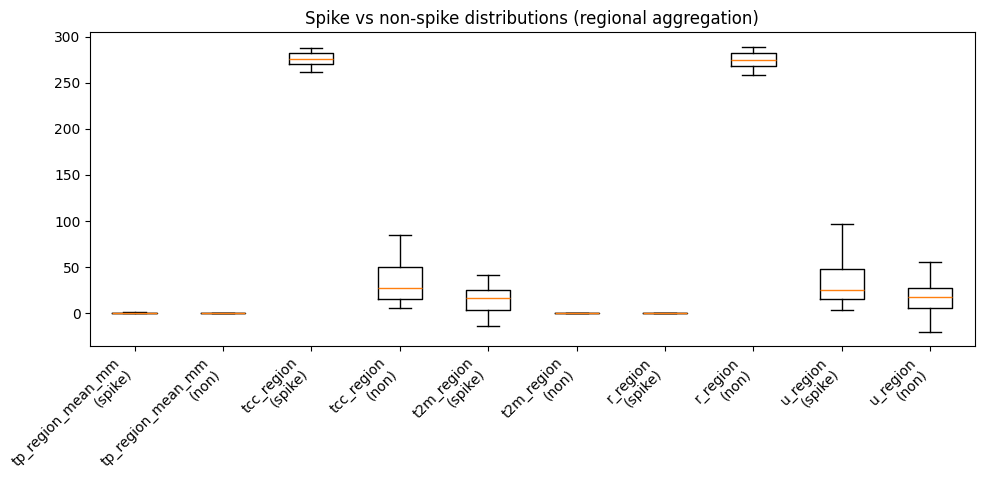

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

vars_to_plot = ["tp_region_mean_mm", "tcc_region", "t2m_region", "r_region", "u_region"]

spike = df[df["spike"] == 1]
non   = df[df["spike"] == 0]

plt.figure(figsize=(10,5))
data = [spike[v].values for v in vars_to_plot] + [non[v].values for v in vars_to_plot]

# Make grouped boxplots manually: spike first row, non second row
positions = []
labels = []
for i, v in enumerate(vars_to_plot):
    positions += [i*2 + 1, i*2 + 2]
    labels += [f"{v}\n(spike)", f"{v}\n(non)"]

plt.boxplot(
    [spike[v].dropna().values for v in vars_to_plot] +
    [non[v].dropna().values for v in vars_to_plot],
    showfliers=False
)

plt.xticks(range(1, 2*len(vars_to_plot)+1), labels, rotation=45, ha="right")
plt.title("Spike vs non-spike distributions (regional aggregation)")
plt.tight_layout()
plt.show()

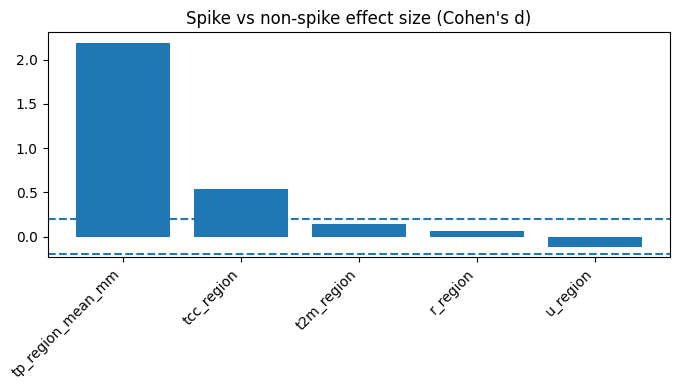

In [ ]:
import matplotlib.pyplot as plt

# effect_table must already exist from your earlier computation
# columns: feature, cohens_d
et = effect_table.set_index("feature").loc[["tp_region_mean_mm","tcc_region","t2m_region","r_region","u_region"]].reset_index()

plt.figure(figsize=(7,4))
plt.bar(et["feature"], et["cohens_d"])
plt.axhline(0.2, linestyle="--")   # small effect threshold
plt.axhline(-0.2, linestyle="--")
plt.xticks(rotation=45, ha="right")
plt.title("Spike vs non-spike effect size (Cohen's d)")
plt.tight_layout()
plt.show()

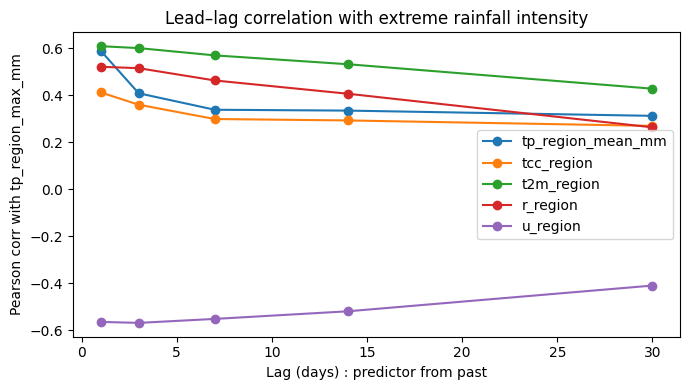

In [ ]:
lags = [1,3,7,14,30]
vars_lag = ["tp_region_mean_mm","tcc_region","t2m_region","r_region","u_region"]

plt.figure(figsize=(7,4))
for v in vars_lag:
    vals = [df[v].shift(L).corr(df["tp_region_max_mm"]) for L in lags]
    plt.plot(lags, vals, marker="o", label=v)

plt.xlabel("Lag (days) : predictor from past")
plt.ylabel("Pearson corr with tp_region_max_mm")
plt.title("Lead–lag correlation with extreme rainfall intensity")
plt.legend()
plt.tight_layout()
plt.show()

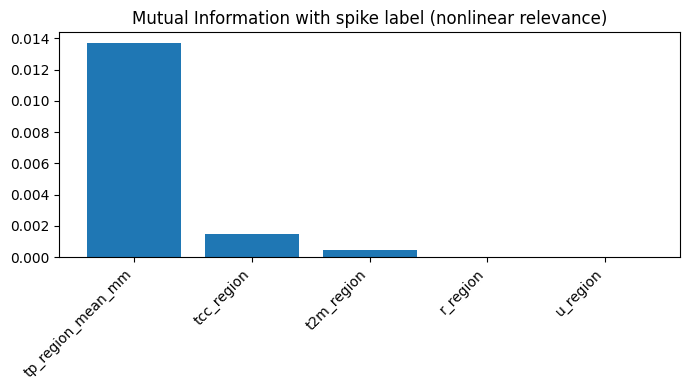

In [ ]:
# mi_table exists: feature, mutual_info
order = ["tp_region_mean_mm","tcc_region","t2m_region","r_region","u_region"]
mi2 = mi_table.set_index("feature").loc[order].reset_index()

plt.figure(figsize=(7,4))
plt.bar(mi2["feature"], mi2["mutual_info"])
plt.xticks(rotation=45, ha="right")
plt.title("Mutual Information with spike label (nonlinear relevance)")
plt.tight_layout()
plt.show()

https://ndmindia.mha.gov.in/ndmi/viewUploadedDocument?uid=D409

https://en.wikipedia.org/wiki/2013_North_India_floods?

In [ ]:
import pandas as pd
import numpy as np

# --- 1) Your ERA5 dataframe (must already exist) ---
# df has: valid_time (datetime), spike (0/1), tp_region_max_mm, etc.
df = df.copy()
df["valid_time"] = pd.to_datetime(df["valid_time"]).dt.date  # date-only for matching

# --- 2) Verified events table (IST) ---
events = [
    {
        "date_IST": "2021-07-27",
        "time_IST": "20:00",
        "event_tag": "Cloudburst/Flash flood",
        "place": "Near Tozing Nallah, Lahaul & Spiti",
        "state_district": "Himachal Pradesh (Lahaul & Spiti)",
        "latitude": 32.5000,
        "longitude": 77.6000,
        "coord_tag": "Approx (district proxy: Keylong)",
        "source": "NDM India (uid=D323)"
    },
    {
        "date_IST": "2021-07-28",
        "time_IST": "13:00",
        "event_tag": "Cloudburst",
        "place": "Aloosa, Bandipora",
        "state_district": "Jammu & Kashmir (Bandipora)",
        "latitude": 34.4234,
        "longitude": 74.5449,
        "coord_tag": "Approx (village coords)",
        "source": "NDM India (uid=D323)"
    },
    {
        "date_IST": "2021-07-28",
        "time_IST": "17:30",
        "event_tag": "Cloudburst",
        "place": "Shri Amarnath Ji (Holy cave area)",
        "state_district": "Jammu & Kashmir (Ganderbal/Anantnag boundary)",
        "latitude": 34.2156,
        "longitude": 75.5038,
        "coord_tag": "Approx (cave coords)",
        "source": "NDM India (uid=D323)"
    },
    {
        "date_IST": "2023-08-14",
        "time_IST": "10:30",
        "event_tag": "Cloudburst",
        "place": "Jadon village, Kandaghat (Solan)",
        "state_district": "Himachal Pradesh (Solan)",
        "latitude": 30.9659,
        "longitude": 77.1074,
        "coord_tag": "Approx (nearest: Kandaghat)",
        "source": "Sphere India SitRep (14 Aug 2023)"
    },
    {
        "date_IST": "2024-08-01",
        "time_IST": "04:47",
        "event_tag": "Cloudburst",
        "place": "Near hydropower project, Jhakri (Rampur)",
        "state_district": "Himachal Pradesh (Shimla)",
        "latitude": 32.0460,
        "longitude": 78.1614,
        "coord_tag": "Approx (Jhakri)",
        "source": "NDM India (uid=NEW2158)"
    },
    {
        "date_IST": "2024-08-01",
        "time_IST": "02:28",
        "event_tag": "Cloudburst",
        "place": "Near Tikkan Thalukot, Padhar tehsil",
        "state_district": "Himachal Pradesh (Mandi)",
        "latitude": 32.0923,
        "longitude": 76.3389,
        "coord_tag": "Approx (nearest: Padhar)",
        "source": "NDM India (uid=NEW2158)"
    },
    {
        "date_IST": "2024-08-01",
        "time_IST": "01:38",
        "event_tag": "Cloudburst",
        "place": "Near Jaon, Nirmand tehsil",
        "state_district": "Himachal Pradesh (Kullu)",
        "latitude": 31.4581,
        "longitude": 77.6439,
        "coord_tag": "Approx (Jaon)",
        "source": "NDM India (uid=NEW2158)"
    },
    {
        "date_IST": "2024-08-01",
        "time_IST": "05:42",
        "event_tag": "Flash flood (grouped with cloudbursts)",
        "place": "Near Malana, Jari sub-tehsil",
        "state_district": "Himachal Pradesh (Kullu)",
        "latitude": 31.9934,
        "longitude": 77.4641,
        "coord_tag": "Approx (Malana)",
        "source": "NDM India (uid=NEW2158)"
    },
]

ev = pd.DataFrame(events)
ev["date_IST"] = pd.to_datetime(ev["date_IST"]).dt.date

# --- 3) Spike match: same day and ±1 day ---
spike_dates = set(df.loc[df["spike"] == 1, "valid_time"].tolist())

def match_window(d, window=1):
    ds = [d + pd.Timedelta(days=k) for k in range(-window, window+1)]
    ds = [x.date() if hasattr(x, "date") else x for x in ds]
    hits = [x for x in ds if x in spike_dates]
    return ("Y" if len(hits) else "N", ", ".join([str(x) for x in hits]) if len(hits) else "")

matches = ev["date_IST"].apply(lambda d: match_window(pd.Timestamp(d), window=1))
ev["ERA5_spike_match_D±1"] = matches.apply(lambda x: x[0])
ev["matched_dates"] = matches.apply(lambda x: x[1])

# Optional: also match exact day only
ev["ERA5_spike_match_exact_D"] = ev["date_IST"].apply(lambda d: "Y" if d in spike_dates else "N")
ev

,date_IST,time_IST,event_tag,place,state_district,latitude,longitude,coord_tag,source,ERA5_spike_match_D±1,matched_dates,ERA5_spike_match_exact_D
0,2021-07-27,20:00,Cloudburst/Flash flood,"Near Tozing Nallah, Lahaul & Spiti",Himachal Pradesh (Lahaul & Spiti),32.5000,77.6000,Approx (district proxy: Keylong),NDM India (uid=D323),N,,N
1,2021-07-28,13:00,Cloudburst,"Aloosa, Bandipora",Jammu & Kashmir (Bandipora),34.4234,74.5449,Approx (village coords),NDM India (uid=D323),N,,N
2,2021-07-28,17:30,Cloudburst,Shri Amarnath Ji (Holy cave area),Jammu & Kashmir (Ganderbal/Anantnag boundary),34.2156,75.5038,Approx (cave coords),NDM India (uid=D323),N,,N
3,2023-08-14,10:30,Cloudburst,"Jadon village, Kandaghat (Solan)",Himachal Pradesh (Solan),30.9659,77.1074,Approx (nearest: Kandaghat),Sphere India SitRep (14 Aug 2023),N,,N
4,2024-08-01,04:47,Cloudburst,"Near hydropower project, Jhakri (Rampur)",Himachal Pradesh (Shimla),32.0460,78.1614,Approx (Jhakri),NDM India (uid=NEW2158),Y,2024-08-01,Y
5,2024-08-01,02:28,Cloudburst,"Near Tikkan Thalukot, Padhar tehsil",Himachal Pradesh (Mandi),32.0923,76.3389,Approx (nearest: Padhar),NDM India (uid=NEW2158),Y,2024-08-01,Y
6,2024-08-01,01:38,Cloudburst,"Near Jaon, Nirmand tehsil",Himachal Pradesh (Kullu),31.4581,77.6439,Approx (Jaon),NDM India (uid=NEW2158),Y,2024-08-01,Y
7,2024-08-01,05:42,Flash flood (grouped with cloudbursts),"Near Malana, Jari sub-tehsil",Himachal Pradesh (Kullu),31.9934,77.4641,Approx (Malana),NDM India (uid=NEW2158),Y,2024-08-01,Y


In [ ]:
# # --- 4) Save for paper appendix ---
# out_csv = "/content/drive/MyDrive/Colab Notebooks/multivariate_rainfall_prediction/paper_outputs/verified_cloudburst_events_with_coords.csv"
# import os
# os.makedirs(os.path.dirname(out_csv), exist_ok=True)
# ev.to_csv(out_csv, index=False)

# print("Saved:", out_csv)

In [ ]:
events += [
    # =========================
    # Himachal Pradesh (HP SDMA timeline)
    # =========================

    # --- 1988 ---
    dict(date_IST="1988-09-29", time_IST="02:30",
         event_tag="Cloudburst / Flash flood",
         place="Soldang Khad / Soldang village area, Satluj valley (Kinnaur), Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kinnaur)",
         latitude=None, longitude=None, coord_tag="To geocode (place-level)",
         source="HP SDMA Flood Hazards: cloudburst flash flood in Soldang Khad (29 Sep 1988, 2:30 AM)",
         geocode_status="unverified"),

    # --- 1991 ---
    dict(date_IST="1991-07-31", time_IST=None,
         event_tag="Cloudburst / Flash flood",
         place="Soldan Khad, Satluj valley (Kinnaur), Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kinnaur)",
         latitude=None, longitude=None, coord_tag="To geocode (place-level)",
         source="HP SDMA Flood Hazards: cloudburst & flash flood along Soldan Khad (31 July 1991)",
         geocode_status="unverified"),

    dict(date_IST="1991-08-02", time_IST=None,
         event_tag="Cloudburst / Flash flood",
         place="Soldan Khad, Satluj valley (Kinnaur), Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kinnaur)",
         latitude=None, longitude=None, coord_tag="To geocode (place-level)",
         source="HP SDMA Flood Hazards: cloudburst & flash flood along Soldan Khad (2 Aug 1991)",
         geocode_status="unverified"),

    # --- 1995 (Tapri / Duling Khad) ---
    dict(date_IST="1995-09-04", time_IST="14:00",
         event_tag="Cloudburst / Flash flood",
         place="Duling Khad / Tapri area (Kinnaur), Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kinnaur)",
         latitude=None, longitude=None, coord_tag="To geocode (place-level)",
         source="HP SDMA Flood Hazards: cloudbursts in upper catchment; flash flood along Duling Khad (4 Sep 1995, 2 PM)",
         geocode_status="unverified"),

    dict(date_IST="1995-09-05", time_IST="06:00",
         event_tag="Flood phase (post-cloudburst lake-burst sequence)",
         place="Duling Khad / Tapri area (Kinnaur), Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kinnaur)",
         latitude=None, longitude=None, coord_tag="To geocode (place-level)",
         source="HP SDMA Flood Hazards: subsequent flood phase after cloudbursts (5 Sep 1995, 6 AM)",
         geocode_status="unverified"),

    dict(date_IST="1995-09-05", time_IST="09:00",
         event_tag="Flood phase (post-cloudburst lake-burst sequence)",
         place="Duling Khad / Tapri area (Kinnaur), Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kinnaur)",
         latitude=None, longitude=None, coord_tag="To geocode (place-level)",
         source="HP SDMA Flood Hazards: subsequent flood phase after cloudbursts (5 Sep 1995, 9 AM)",
         geocode_status="unverified"),

    # --- 1997 (Pabbar valley / Chirgaon) ---
    dict(date_IST="1997-08-11", time_IST=None,
         event_tag="Flash flood / Landslide (cloudburst-linked)",
         place="Andhra Khad / Chirgaon (Pabbar valley), Shimla district, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Shimla/Chirgaon)",
         latitude=None, longitude=None, coord_tag="To geocode (place-level)",
         source="HP SDMA Flood Hazards: flash flood & landslide along Andhra Khad in Pabbar valley (11 Aug 1997)",
         geocode_status="unverified"),

    # --- 2001 (multiple HP flash-flood events; include the explicitly 'cloudburst' one) ---
    dict(date_IST="2001-07-23", time_IST=None,
         event_tag="Cloudburst / Flash flood",
         place="Sainj valley (Sainj & Jeeba nallah), Kullu district, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kullu/Sainj)",
         latitude=None, longitude=None, coord_tag="To geocode (place-level)",
         source="HP SDMA Flood Hazards: cloudbursts in upper Sainj valley causing flash floods (night of 23 Jul 2001)",
         geocode_status="unverified"),

    dict(date_IST="2001-08-21", time_IST=None,
         event_tag="Cloudburst / Flash floods",
         place="Ani Sub Division (Badhali, Sarli villages mentioned), Kullu district, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kullu/Ani)",
         latitude=None, longitude=None, coord_tag="To geocode (village-level)",
         source="HP SDMA Flood Hazards: cloudburst & flash floods in Ani Sub Division (night of 21–22 Aug 2001)",
         geocode_status="unverified"),

    dict(date_IST="2001-08-22", time_IST=None,
         event_tag="Cloudburst / Flash floods",
         place="Ani Sub Division (Badhali, Sarli villages mentioned), Kullu district, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kullu/Ani)",
         latitude=None, longitude=None, coord_tag="To geocode (village-level)",
         source="HP SDMA Flood Hazards: cloudburst & flash floods in Ani Sub Division (night of 21–22 Aug 2001)",
         geocode_status="unverified"),

    # --- 2003 (Gharsa valley + Solang/Kangni nalla) ---
    dict(date_IST="2003-07-16", time_IST=None,
         event_tag="Cloudburst / Flash floods",
         place="Gharsa valley, Kullu district, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kullu/Gharsa)",
         latitude=None, longitude=None, coord_tag="To geocode (valley-level)",
         source="HP SDMA Flood Hazards: flash floods due to cloudbursts in Gharsa valley (16 Jul 2003)",
         geocode_status="unverified"),

    dict(date_IST="2003-08-07", time_IST=None,
         event_tag="Flash floods (cloudburst-linked)",
         place="Kangni nalla near Solang, Kullu district, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kullu/Solang)",
         latitude=None, longitude=None, coord_tag="To geocode (place-level)",
         source="HP SDMA Flood Hazards: flash floods in Kangni nalla near Solang (7 Aug 2003)",
         geocode_status="unverified"),

    # =========================
    # Ladakh / J&K
    # =========================

    # --- 2010 Leh cloudburst ---
    dict(date_IST="2010-08-06", time_IST="01:00-02:00",
         event_tag="Cloudburst / Flash floods",
         place="Leh town & surrounding areas (e.g., Choglamsar), Ladakh, India",
         state_district="Jammu & Kashmir (Leh/Ladakh) [historical admin]",
         latitude=None, longitude=None, coord_tag="To geocode (town/area-level)",
         source="NIDM Newsletter (2010): Leh cloudburst between 1–2 AM on 6 Aug 2010",
         geocode_status="unverified"),

    # =========================
    # Uttarakhand
    # =========================

    # --- 2012 Rudraprayag cloudburst ---
    dict(date_IST="2012-09-14", time_IST="~01:00",
         event_tag="Cloudburst",
         place="Rudraprayag district (affected villages), Uttarakhand, India",
         state_district="Uttarakhand (Rudraprayag)",
         latitude=None, longitude=None, coord_tag="To geocode (village-level)",
         source="ReliefWeb/Sphere India: Rudraprayag cloudburst night 13–14 Sep 2012 around 01:00 AM",
         geocode_status="unverified"),

    # --- 2013 Uttarakhand extreme rainfall / cloudburst-triggered floods (broad event) ---
    dict(date_IST="2013-06-16", time_IST=None,
         event_tag="Extreme rainfall / cloudburst-triggered flash floods (broad event)",
         place="Uttarakhand (multi-district flood/flash flood event)",
         state_district="Uttarakhand (multi-district)",
         latitude=None, longitude=None, coord_tag="To geocode (multi-location; can refine to key towns later)",
         source="ReliefWeb / humanitarian sitreps around mid-June 2013 Uttarakhand floods (cloudburst/heavy rainfall referenced in reports)",
         geocode_status="unverified"),
]

In [ ]:
events += [
    # --- 2010 ---
    dict(date_IST="2010-08-06", time_IST="01:00-02:00",
         event_tag="Cloudburst",
         place="Leh (Leh town / Choglamsar), Ladakh, India",
         state_district="Jammu & Kashmir (Leh/Ladakh)",
         latitude=None, longitude=None, coord_tag="To geocode (place-level)",
         source="NDM India SITREP NO-69/2010 (uid=NEW1293): Leh cloudburst night 5-6 Aug 2010",
         geocode_status="unverified"),

    dict(date_IST="2010-08-18", time_IST="08:00",
         event_tag="Heavy rain / cloudburst (reported in SITREP)",
         place="Kapkot, Bageshwar district, Uttarakhand, India",
         state_district="Uttarakhand (Bageshwar/Kapkot)",
         latitude=None, longitude=None, coord_tag="To geocode (place-level)",
         source="NDM India SITREP (uid=NEW1305): Kapkot school roof collapse due to heavy rain/cloud burst (18 Aug 2010)",
         geocode_status="unverified"),

    # --- 2012 ---
    dict(date_IST="2012-09-14", time_IST="~01:00",
         event_tag="Cloudburst",
         place="Rudraprayag district (affected villages), Uttarakhand, India",
         state_district="Uttarakhand (Rudraprayag)",
         latitude=None, longitude=None, coord_tag="To geocode (district/village-level)",
         source="Sphere India / ReliefWeb: 'Situation Report - Rudraprayag Cloud Burst' (13-14 Sep 2012, around 01:00 AM)",
         geocode_status="unverified"),

    # --- 2013 ---
    dict(date_IST="2013-06-16", time_IST=None,
         event_tag="Extreme rainfall / cloudburst-like triggering flash floods (reported in sitreps)",
         place="Uttarakhand (multi-district flood/flash flood event affecting Char Dham region and others)",
         state_district="Uttarakhand (multi-district)",
         latitude=None, longitude=None, coord_tag="To geocode (multi-location; use key affected towns if needed)",
         source="Sphere India IAC Report / Sitrep (June 2013): heavy rains and flood situation in Uttarakhand (mid-June 2013)",
         geocode_status="unverified"),
]

In [ ]:
# Make sure you already have: events = [...] from earlier
# We'll append more Himalayan-only events within 1960–2024.

events += [
    # --- 2014 ---
    dict(date_IST="2014-07-24", time_IST="03:00-04:00",
         event_tag="Cloudburst",
         place="Akhnoor, Jammu, Jammu & Kashmir, India",
         state_district="Jammu & Kashmir (Jammu/Akhnoor)",
         latitude=None, longitude=None, coord_tag="To geocode (place-level)",
         source="NDM India Sitrep NEW913 (24/07/2014)"),

    # --- 2016 ---
    dict(date_IST="2016-05-28", time_IST="NA",
         event_tag="Cloudburst",
         place="Ghansali, Tehri Garhwal, Uttarakhand, India",
         state_district="Uttarakhand (Tehri Garhwal/Ghansali)",
         latitude=None, longitude=None, coord_tag="To geocode (tehsil proxy)",
         source="NDM India Sitrep NEW821 (04/06/2016; incident 28/05/2016)"),

    dict(date_IST="2016-07-01", time_IST="early morning",
         event_tag="Cloudburst",
         place="Singhali, Pithoragarh, Uttarakhand, India",
         state_district="Uttarakhand (Pithoragarh/Singhali area)",
         latitude=None, longitude=None, coord_tag="To geocode (area)",
         source="Sphere India Sitrep (Uttarakhand Cloud Burst 2 July 2016; incident 1 July 2016)"),

    # --- 2017 ---
    dict(date_IST="2017-08-13", time_IST="NA",
         event_tag="Cloudburst-triggered landslide",
         place="Padhar, Mandi, Himachal Pradesh, India (Urla area)",
         state_district="Himachal Pradesh (Mandi/Padhar)",
         latitude=None, longitude=None, coord_tag="To geocode (nearest town/tehsil)",
         source="NDM India Sitrep NEW758 (15/08/2017; incident 13/08/2017)"),

    dict(date_IST="2017-08-14", time_IST="NA",
         event_tag="Cloudburst/Landslide",
         place="Dharchula, Pithoragarh, Uttarakhand, India (Manti Nara & Malata area)",
         state_district="Uttarakhand (Pithoragarh/Dharchula)",
         latitude=None, longitude=None, coord_tag="To geocode (town proxy)",
         source="NDM India Sitrep NEW758 (15/08/2017; incident 14/08/2017)"),

    # --- 2021 (multiple) ---
    dict(date_IST="2021-07-27", time_IST="20:00",
         event_tag="Cloudburst/Flash flood",
         place="Tozing Nallah, Lahaul & Spiti, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Lahaul & Spiti)",
         latitude=None, longitude=None, coord_tag="To geocode (feature/area; may be approximate)",
         source="NDM India Sitrep D323 (29/07/2021; incident 27/07/2021 2000 hrs)"),

    dict(date_IST="2021-07-28", time_IST="03:30",
         event_tag="Cloudburst",
         place="Honzar, Dachhan, Kishtwar, Jammu & Kashmir, India",
         state_district="Jammu & Kashmir (Kishtwar/Dachhan)",
         latitude=None, longitude=None, coord_tag="To geocode (village)",
         source="NDM India Sitrep D323 (29/07/2021; incident 28/07/2021 0330 hrs)"),

    dict(date_IST="2021-07-28", time_IST="13:00",
         event_tag="Cloudburst",
         place="Aloosa, Bandipora, Jammu & Kashmir, India",
         state_district="Jammu & Kashmir (Bandipora/Aloosa)",
         latitude=None, longitude=None, coord_tag="To geocode (village)",
         source="NDM India Sitrep D323 (29/07/2021; incident 28/07/2021 1300 hrs)"),

    dict(date_IST="2021-07-28", time_IST="17:30",
         event_tag="Cloudburst",
         place="Amarnath Cave, Jammu & Kashmir, India",
         state_district="Jammu & Kashmir (Amarnath holy cave)",
         latitude=None, longitude=None, coord_tag="To geocode (site)",
         source="NDM India Sitrep D323 (29/07/2021; incident 28/07/2021 1730 hrs)"),

    # --- 2022 ---
    dict(date_IST="2022-07-08", time_IST="17:30",
         event_tag="Cloudburst / flash flood",
         place="Amarnath Cave, Jammu & Kashmir, India",
         state_district="Jammu & Kashmir (Amarnath holy cave)",
         latitude=None, longitude=None, coord_tag="To geocode (site)",
         source="NDM India Brief D856 (09/07/2022; incident 08/07/2022 1730 hrs)"),

    # --- 2024 ---
    dict(date_IST="2024-07-25", time_IST="01:00",
         event_tag="Cloudburst",
         place="Palchan, Manali, Kullu, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kullu/Manali/Palchan)",
         latitude=None, longitude=None, coord_tag="To geocode (village)",
         source="Sphere India Sitrep (Cloudburst in Himachal Pradesh; 26/07/2024; around 1 am on 25/07/2024)"),

    # 01 Aug 2024 multiple incidents (add as separate rows)
    dict(date_IST="2024-08-01", time_IST="01:38",
         event_tag="Cloudburst",
         place="Jaon, Nirmand, Kullu, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kullu/Nirmand/Jaon)",
         latitude=None, longitude=None, coord_tag="To geocode (village)",
         source="NDM India DSR NEW2155 (Annexure-II; incident 01/08/2024 0138 hrs)"),

    dict(date_IST="2024-08-01", time_IST="02:28",
         event_tag="Cloudburst",
         place="Tikkan Thalukot, Padhar, Mandi, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Mandi/Padhar/Tikkan Thalukot)",
         latitude=None, longitude=None, coord_tag="To geocode (village)",
         source="NDM India DSR NEW2155 (Annexure-II; incident 01/08/2024 0228 hrs)"),

    dict(date_IST="2024-08-01", time_IST="04:47",
         event_tag="Cloudburst",
         place="Jhakri, Rampur, Shimla, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Shimla/Rampur/Jhakri)",
         latitude=None, longitude=None, coord_tag="To geocode (village/town)",
         source="NDM India DSR NEW2155 (Annexure-II; incident 01/08/2024 0447 hrs)"),

    dict(date_IST="2024-08-01", time_IST="05:42",
         event_tag="Flash flood (reported alongside cloudbursts)",
         place="Malana, Jari, Kullu, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kullu/Jari/Malana)",
         latitude=None, longitude=None, coord_tag="To geocode (village)",
         source="NDM India DSR NEW2155 (Annexure-II; incident 01/08/2024 0542 hrs)"),
]

print("Total events now:", len(events))

Total events now: 42


In [ ]:
events += [
    # =========================
    # 2000 (Satluj valley flash flood episode)
    # =========================
    dict(date_IST="2000-07-31", time_IST="Night",
         event_tag="Flash floods (Satluj valley)",
         place="Satluj valley, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Satluj valley)",
         latitude=None, longitude=None, coord_tag="To geocode (valley-level)",
         source="HP SDMA Flood Hazards: flash floods in the night of 31 Jul & 1 Aug 2000 in Satluj valley",
         geocode_status="unverified"),
    dict(date_IST="2000-08-01", time_IST="Night",
         event_tag="Flash floods (Satluj valley)",
         place="Satluj valley, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Satluj valley)",
         latitude=None, longitude=None, coord_tag="To geocode (valley-level)",
         source="HP SDMA Flood Hazards: flash floods in the night of 31 Jul & 1 Aug 2000 in Satluj valley",
         geocode_status="unverified"),

    # =========================
    # 2001 (multiple flash-flood/cloudburst episodes across HP)
    # =========================
    dict(date_IST="2001-07-23", time_IST="Night",
         event_tag="Cloudbursts / Flash floods",
         place="Sainj valley (Sainj & Jeeba nallahs), Kullu district, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kullu/Sainj)",
         latitude=None, longitude=None, coord_tag="To geocode (valley/nallah-level)",
         source="HP SDMA Flood Hazards: flash floods night of 23 Jul 2001 in Sainj valley; cloudbursts in upper reaches",
         geocode_status="unverified"),

    dict(date_IST="2001-07-29", time_IST="Night",
         event_tag="Flash floods",
         place="Chhota Bhangal & Baijnath Sub Division, Kangra district, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kangra/Chhota Bhangal, Baijnath)",
         latitude=None, longitude=None, coord_tag="To geocode (subdivision-level)",
         source="HP SDMA Flood Hazards: flash floods in the night of 29–30 Jul 2001 in Chhota Bhangal & Baijnath (Kangra)",
         geocode_status="unverified"),
    dict(date_IST="2001-07-30", time_IST="Night",
         event_tag="Flash floods",
         place="Chhota Bhangal & Baijnath Sub Division, Kangra district, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kangra/Chhota Bhangal, Baijnath)",
         latitude=None, longitude=None, coord_tag="To geocode (subdivision-level)",
         source="HP SDMA Flood Hazards: flash floods in the night of 29–30 Jul 2001 in Chhota Bhangal & Baijnath (Kangra)",
         geocode_status="unverified"),

    dict(date_IST="2001-08-09", time_IST="Night",
         event_tag="Flash floods",
         place="Moral-Danda peak / Rohru area; also Devidhar (Rampur Sub Division), Shimla district, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Shimla/Rohru, Rampur)",
         latitude=None, longitude=None, coord_tag="To geocode (area/stream-level)",
         source="HP SDMA Flood Hazards: flash floods in the night of 9–10 Aug 2001 (Rohru & Rampur sub divisions)",
         geocode_status="unverified"),
    dict(date_IST="2001-08-10", time_IST="Night",
         event_tag="Flash floods",
         place="Moral-Danda peak / Rohru area; also Devidhar (Rampur Sub Division), Shimla district, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Shimla/Rohru, Rampur)",
         latitude=None, longitude=None, coord_tag="To geocode (area/stream-level)",
         source="HP SDMA Flood Hazards: flash floods in the night of 9–10 Aug 2001 (Rohru & Rampur sub divisions)",
         geocode_status="unverified"),

    dict(date_IST="2001-08-12", time_IST="Night",
         event_tag="Flash floods",
         place="Sihunta & Tissa areas, Chamba district, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Chamba/Sihunta, Tissa)",
         latitude=None, longitude=None, coord_tag="To geocode (area-level)",
         source="HP SDMA Flood Hazards: flash floods in the night of 12–13 Aug 2001 in Sihunta & Tissa (Chamba)",
         geocode_status="unverified"),
    dict(date_IST="2001-08-13", time_IST="Night",
         event_tag="Flash floods",
         place="Sihunta & Tissa areas, Chamba district, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Chamba/Sihunta, Tissa)",
         latitude=None, longitude=None, coord_tag="To geocode (area-level)",
         source="HP SDMA Flood Hazards: flash floods in the night of 12–13 Aug 2001 in Sihunta & Tissa (Chamba)",
         geocode_status="unverified"),

    dict(date_IST="2001-08-21", time_IST="Night",
         event_tag="Cloudburst / Flash floods",
         place="Ani Sub Division (villages Badhali, Sarli referenced), Kullu district, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kullu/Ani)",
         latitude=None, longitude=None, coord_tag="To geocode (village-level)",
         source="HP SDMA Flood Hazards: flash floods in the night of 21–22 Aug 2001; cloudburst in Ani Sub Division (Kullu)",
         geocode_status="unverified"),
    dict(date_IST="2001-08-22", time_IST="Night",
         event_tag="Cloudburst / Flash floods",
         place="Ani Sub Division (villages Badhali, Sarli referenced), Kullu district, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kullu/Ani)",
         latitude=None, longitude=None, coord_tag="To geocode (village-level)",
         source="HP SDMA Flood Hazards: flash floods in the night of 21–22 Aug 2001; cloudburst in Ani Sub Division (Kullu)",
         geocode_status="unverified"),

    # =========================
    # 2003 (Kullu district episodes)
    # =========================
    dict(date_IST="2003-07-16", time_IST=None,
         event_tag="Cloudbursts / Flash floods",
         place="Gharsa valley, Kullu district, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kullu/Gharsa)",
         latitude=None, longitude=None, coord_tag="To geocode (valley-level)",
         source="HP SDMA Flood Hazards: flash floods due to cloudbursts in Gharsa valley on 16 Jul 2003 (Kullu)",
         geocode_status="unverified"),

    dict(date_IST="2003-08-07", time_IST=None,
         event_tag="Flash floods",
         place="Kangni nalla near Solang (and Bhang nalla landslide mentioned), Kullu district, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kullu/Solang)",
         latitude=None, longitude=None, coord_tag="To geocode (nallah/place-level)",
         source="HP SDMA Flood Hazards: flash floods in Kangni nalla near Solang on 7 Aug 2003 (Kullu)",
         geocode_status="unverified"),

    # =========================
    # 2005 (Satluj basin / Parechu lake breach + other July floods)
    # =========================
    dict(date_IST="2005-06-26", time_IST=None,
         event_tag="Flash flood (Parechu lake breach; Satluj river)",
         place="Satluj river corridor (Sumdo–Khab–Wangtoo stretch impacted), Himachal Pradesh, India",
         state_district="Himachal Pradesh (Satluj corridor / Kinnaur region referenced)",
         latitude=None, longitude=None, coord_tag="To geocode (corridor-level)",
         source="HP SDMA Flood Hazards: flash flood in Satluj due to breach in Parachoo (Parechu) lake on 26 Jun 2005",
         geocode_status="unverified"),

    dict(date_IST="2005-07-07", time_IST=None,
         event_tag="Flash flood (Baspa river)",
         place="Baspa river (link road to Sangla referenced), Kinnaur district, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kinnaur/Sangla)",
         latitude=None, longitude=None, coord_tag="To geocode (river/area-level)",
         source="HP SDMA Flood Hazards: on 7 Jul 2005 flash flood in Baspa river causing bridge/road losses",
         geocode_status="unverified"),

    # =========================
    # 2007 / 2009 / 2010 (later pre-2014 points from same timeline)
    # =========================
    dict(date_IST="2007-08-15", time_IST=None,
         event_tag="Cloudburst / Flash floods",
         place="Bhavi Village, Ghanvi area, Shimla district, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Shimla/Ghanvi)",
         latitude=None, longitude=None, coord_tag="To geocode (village-level)",
         source="HP SDMA Flood Hazards: 15 Aug 2007 cloudburst/flash-flood disaster at Bhavi village (Ghanvi, Shimla)",
         geocode_status="unverified"),

    dict(date_IST="2009-08-07", time_IST=None,
         event_tag="Cloudburst / Flash floods (reported event point)",
         place="Dharampur, Mandi district, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Mandi/Dharampur)",
         latitude=None, longitude=None, coord_tag="To geocode (town-level)",
         source="HP SDMA Flood Hazards: 7 Aug 2009 Dharampur (Mandi) event point",
         geocode_status="unverified"),

    dict(date_IST="2010-09-12", time_IST=None,
         event_tag="Cloudburst / Flash floods (reported event point)",
         place="Kharahal Valley, Kullu district, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kullu/Kharahal Valley)",
         latitude=None, longitude=None, coord_tag="To geocode (valley-level)",
         source="HP SDMA Flood Hazards: 12 Sep 2010 Kharahal Valley event point",
         geocode_status="unverified"),
]

In [ ]:
events += [
    # =========================
    # SIKKIM / DARJEELING BELT
    # =========================
    dict(date_IST="1968-10-02", time_IST=None,
         event_tag="Extreme rainfall / flood-disaster (cloudburst-like multi-day event)",
         place="Sikkim and Darjeeling (Teesta basin corridor), India",
         state_district="Sikkim + West Bengal (Darjeeling)",
         latitude=None, longitude=None, coord_tag="To geocode (basin/corridor-level)",
         source="1968 Sikkim floods (2–5 Oct 1968) after continuous heavy rainfall; Teesta basin impacts",
         geocode_status="unverified"),

    # =========================
    # HIMACHAL PRADESH (Kinnaur / Satluj)
    # =========================
    dict(date_IST="1975-03-01", time_IST=None,
         event_tag="Flash flood (lake burst) in Spiti/Satluj basin",
         place="Spiti valley / Satluj basin (Parechu river lake-burst sequence described), Himachal Pradesh, India",
         state_district="Himachal Pradesh (Spiti/Kinnaur corridor)",
         latitude=None, longitude=None, coord_tag="To geocode (basin-level; month-level date placeholder)",
         source="Satluj basin blockage created by 19 Jan 1975 earthquake; lake burst in March causing flash floods (Spiti valley)",
         geocode_status="unverified"),

    dict(date_IST="1988-09-29", time_IST="02:30",
         event_tag="Cloudburst / flash flood",
         place="Soldang Khad / Soldang village area, Kinnaur, Himachal Pradesh, India",
         state_district="Himachal Pradesh (Kinnaur)",
         latitude=None, longitude=None, coord_tag="To geocode (village-level)",
         source="DDMA Kinnaur / HP SDMA timeline: cloudburst flash flood in Soldang Khad (29 Sep 1988, 2:30 AM)",
         geocode_status="unverified"),

    # =========================
    # UTTARAKHAND (exact-day documented cases)
    # =========================
    dict(date_IST="1998-08-18", time_IST="~03:00",
         event_tag="Cloudburst-linked landslide / disaster",
         place="Malpa village (Kali valley), Pithoragarh, Uttarakhand, India",
         state_district="Uttarakhand (Pithoragarh)",
         latitude=None, longitude=None, coord_tag="To geocode (village-level)",
         source="Malpa disaster: dated 18 Aug 1998 (~3 AM) in case histories; cloudburst/landslide referenced in Uttarakhand cloudburst literature",
         geocode_status="unverified"),

    dict(date_IST="2001-07-16", time_IST=None,
         event_tag="Cloudburst",
         place="Phata–Byung / Mandakini valley (Byung & Gabni sub-watersheds), Rudraprayag, Uttarakhand, India",
         state_district="Uttarakhand (Rudraprayag/Phata-Byung)",
         latitude=None, longitude=None, coord_tag="To geocode (area-level)",
         source="Naithani et al. case history: cloudburst event dated 16 Jul 2001 in Phata–Byung area",
         geocode_status="unverified"),

    dict(date_IST="2001-08-31", time_IST="00:15-01:30",
         event_tag="Cloudburst-triggered catastrophic landslide",
         place="Gona village, Tehri Garhwal, Uttarakhand, India",
         state_district="Uttarakhand (Tehri Garhwal)",
         latitude=None, longitude=None, coord_tag="To geocode (village-level)",
         source="Gona event investigation: cloudburst around 00:15–01:30 on 31 Aug 2001",
         geocode_status="unverified"),

    dict(date_IST="2012-09-14", time_IST="~01:00",
         event_tag="Cloudburst",
         place="Rudraprayag district (affected villages), Uttarakhand, India",
         state_district="Uttarakhand (Rudraprayag)",
         latitude=None, longitude=None, coord_tag="To geocode (district/village-level)",
         source="ReliefWeb/Sphere India sitrep: Rudraprayag cloudburst night 13–14 Sep 2012 around 01:00 AM",
         geocode_status="unverified"),

    # =========================
    # LADAKH / J&K (historical admin)
    # =========================
    dict(date_IST="2010-08-06", time_IST="01:00-02:00",
         event_tag="Cloudburst / flash floods",
         place="Leh town & surrounding areas (e.g., Choglamsar), Ladakh, India",
         state_district="Jammu & Kashmir (Leh/Ladakh) [historical admin]",
         latitude=None, longitude=None, coord_tag="To geocode (town/area-level)",
         source="NIDM newsletter: Leh cloudburst on 6 Aug 2010 between 1–2 AM",
         geocode_status="unverified"),

    # =========================
    # ARUNACHAL PRADESH (NE Himalaya)
    # =========================
    dict(date_IST="2004-07-05", time_IST=None,
         event_tag="Flash flood (reported in sitrep; cloudburst-like intense rain)",
         place="Seijosa circle / East Kameng district, Arunachal Pradesh, India",
         state_district="Arunachal Pradesh (East Kameng/Seijosa)",
         latitude=None, longitude=None, coord_tag="To geocode (circle-level)",
         source="ReliefWeb situation report: East Kameng experienced flash flood on 5 July 2004",
         geocode_status="unverified"),
]

In [ ]:
print("Total events now:", len(events))

Total events now: 69


In [ ]:
!pip -q install geopy

from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
import pandas as pd
import numpy as np

ev = pd.DataFrame(events)
ev["date_IST"] = pd.to_datetime(ev["date_IST"])

geolocator = Nominatim(user_agent="himalayan_cloudburst_geocoder")
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1.2, return_value_on_exception=None)

# cache to avoid repeated lookups
cache = {}

def geocode_place(place):
    if place in cache:
        return cache[place]
    loc = geocode(place)
    if loc is None:
        cache[place] = (None, None, "Not found")
    else:
        cache[place] = (loc.latitude, loc.longitude, "OK")
    return cache[place]

# fill only missing coords
lats, lons, status = [], [], []
for _, row in ev.iterrows():
    if pd.notna(row.get("latitude")) and pd.notna(row.get("longitude")):
        lats.append(row["latitude"]); lons.append(row["longitude"]); status.append("Given")
    else:
        lat, lon, st = geocode_place(row["place"])
        lats.append(lat); lons.append(lon); status.append(st)

ev["latitude"] = lats
ev["longitude"] = lons
ev["geocode_status"] = status

# coord_tag update: if geocoding worked, keep prior tag but add OK
ev["coord_tag"] = ev["coord_tag"].astype(str) + " | " + ev["geocode_status"]

ev[["date_IST","time_IST","event_tag","place","state_district","latitude","longitude","coord_tag","source"]]

,date_IST,time_IST,event_tag,place,state_district,latitude,longitude,coord_tag,source
0,2021-07-27,20:00,Cloudburst/Flash flood,"Near Tozing Nallah, Lahaul & Spiti",Himachal Pradesh (Lahaul & Spiti),32.50000,77.600000,Approx (district proxy: Keylong) | Given,NDM India (uid=D323)
1,2021-07-28,13:00,Cloudburst,"Aloosa, Bandipora",Jammu & Kashmir (Bandipora),34.42340,74.544900,Approx (village coords) | Given,NDM India (uid=D323)
2,2021-07-28,17:30,Cloudburst,Shri Amarnath Ji (Holy cave area),Jammu & Kashmir (Ganderbal/Anantnag boundary),34.21560,75.503800,Approx (cave coords) | Given,NDM India (uid=D323)
3,2023-08-14,10:30,Cloudburst,"Jadon village, Kandaghat (Solan)",Himachal Pradesh (Solan),30.96590,77.107400,Approx (nearest: Kandaghat) | Given,Sphere India SitRep (14 Aug 2023)
4,2024-08-01,04:47,Cloudburst,"Near hydropower project, Jhakri (Rampur)",Himachal Pradesh (Shimla),32.04600,78.161400,Approx (Jhakri) | Given,NDM India (uid=NEW2158)
...,...,...,...,...,...,...,...,...,...
64,2001-07-16,None,Cloudburst,Phata–Byung / Mandakini valley (Byung & Gabni ...,Uttarakhand (Rudraprayag/Phata-Byung),NaN,NaN,To geocode (area-level) | Not found,Naithani et al. case history: cloudburst event...
65,2001-08-31,00:15-01:30,Cloudburst-triggered catastrophic landslide,"Gona village, Tehri Garhwal, Uttarakhand, India",Uttarakhand (Tehri Garhwal),30.52964,78.602556,To geocode (village-level) | OK,Gona event investigation: cloudburst around 00...
66,2012-09-14,~01:00,Cloudburst,"Rudraprayag district (affected villages), Utta...",Uttarakhand (Rudraprayag),NaN,NaN,To geocode (district/village-level) | Not found,ReliefWeb/Sphere India sitrep: Rudraprayag clo...
67,2010-08-06,01:00-02:00,Cloudburst / flash floods,"Leh town & surrounding areas (e.g., Choglamsar...",Jammu & Kashmir (Leh/Ladakh) [historical admin],NaN,NaN,To geocode (town/area-level) | Not found,NIDM newsletter: Leh cloudburst on 6 Aug 2010 ...


In [ ]:
out_csv = "/content/drive/MyDrive/Colab Notebooks/multivariate_rainfall_prediction/paper_outputs/verified_himalayan_cloudburst_events_1960_2024_geocoded.csv"
ev.to_csv(out_csv, index=False)
print("Saved:", out_csv)

Saved: /content/drive/MyDrive/Colab Notebooks/multivariate_rainfall_prediction/paper_outputs/verified_himalayan_cloudburst_events_1960_2024_geocoded.csv


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# df: ERA5 regional daily dataframe with valid_time + variables + spike
df_plot = df.copy()
df_plot["valid_time"] = pd.to_datetime(df_plot["valid_time"]).dt.date

vars_to_plot = [
    "tp_region_max_mm",
    "tp_region_mean_mm",
    "tcc_region",
    "t2m_region",
    "r_region",
    "u_region"
]

In [ ]:
def plot_event_window(event_date, title="", window_days=15):
    event_date = pd.to_datetime(event_date).date()
    start = (pd.Timestamp(event_date) - pd.Timedelta(days=window_days)).date()
    end   = (pd.Timestamp(event_date) + pd.Timedelta(days=window_days)).date()

    sub = df_plot[(df_plot["valid_time"] >= start) & (df_plot["valid_time"] <= end)].copy()
    if len(sub) == 0:
        print("No data found for:", event_date)
        return

    # convert back to datetime for plotting
    sub["t"] = pd.to_datetime(sub["valid_time"])

    fig, axes = plt.subplots(len(vars_to_plot), 1, figsize=(10, 2.2*len(vars_to_plot)), sharex=True)

    for i, v in enumerate(vars_to_plot):
        ax = axes[i]
        ax.plot(sub["t"], sub[v])
        ax.axvline(pd.Timestamp(event_date), linestyle="--")   # event marker
        ax.set_ylabel(v)

        # mark spike days (optional)
        if "spike" in sub.columns:
            spike_days = sub[sub["spike"] == 1]
            ax.scatter(spike_days["t"], spike_days[v], s=15)

    axes[0].set_title(title if title else f"ERA5 variables around event: {event_date} (±{window_days}d)")
    axes[-1].set_xlabel("Date")
    plt.tight_layout()
    plt.show()

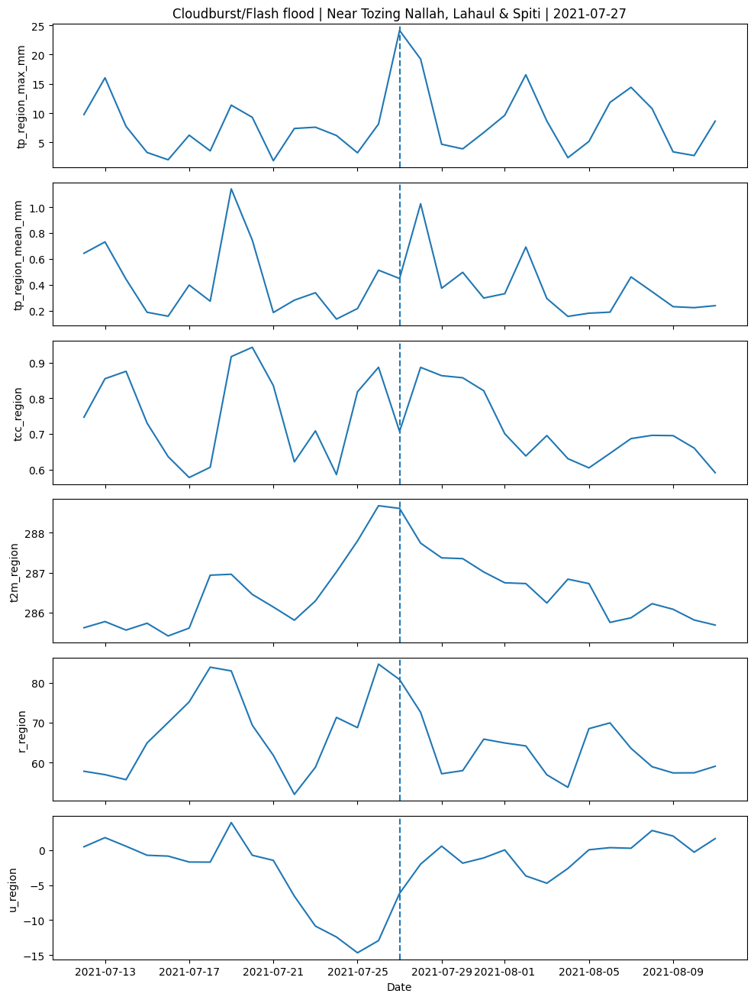

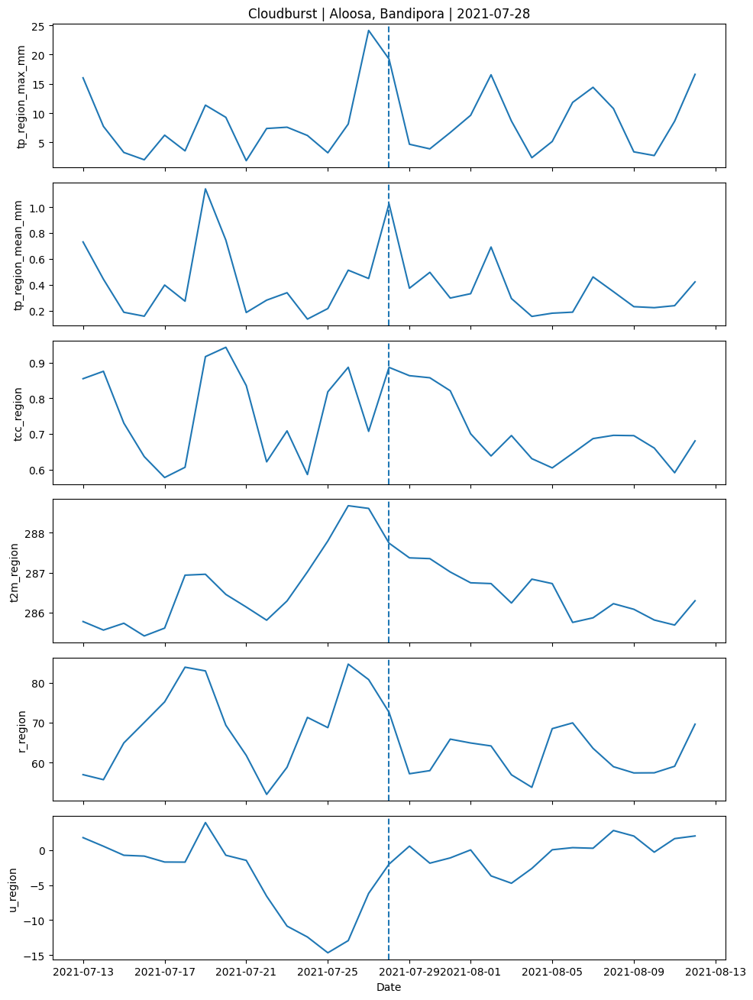

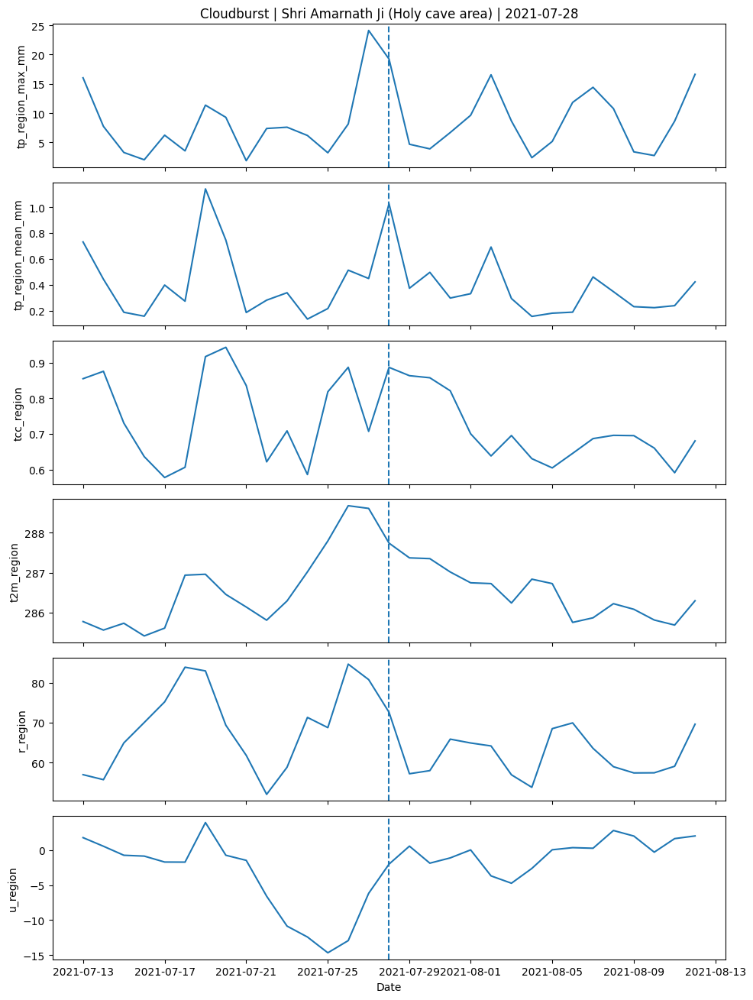

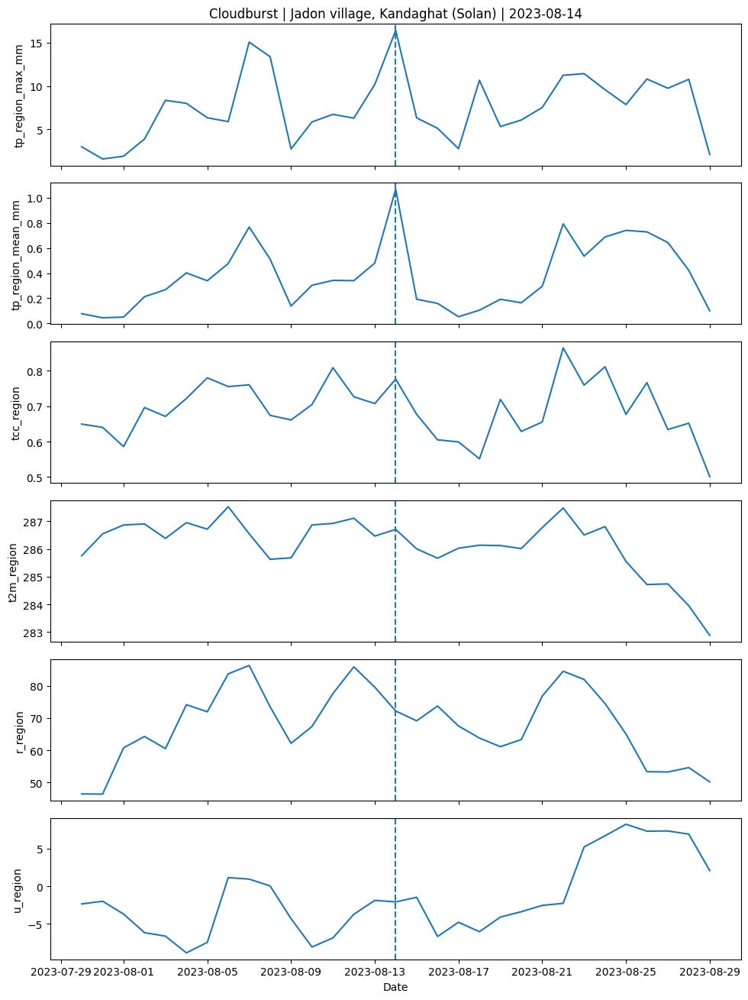

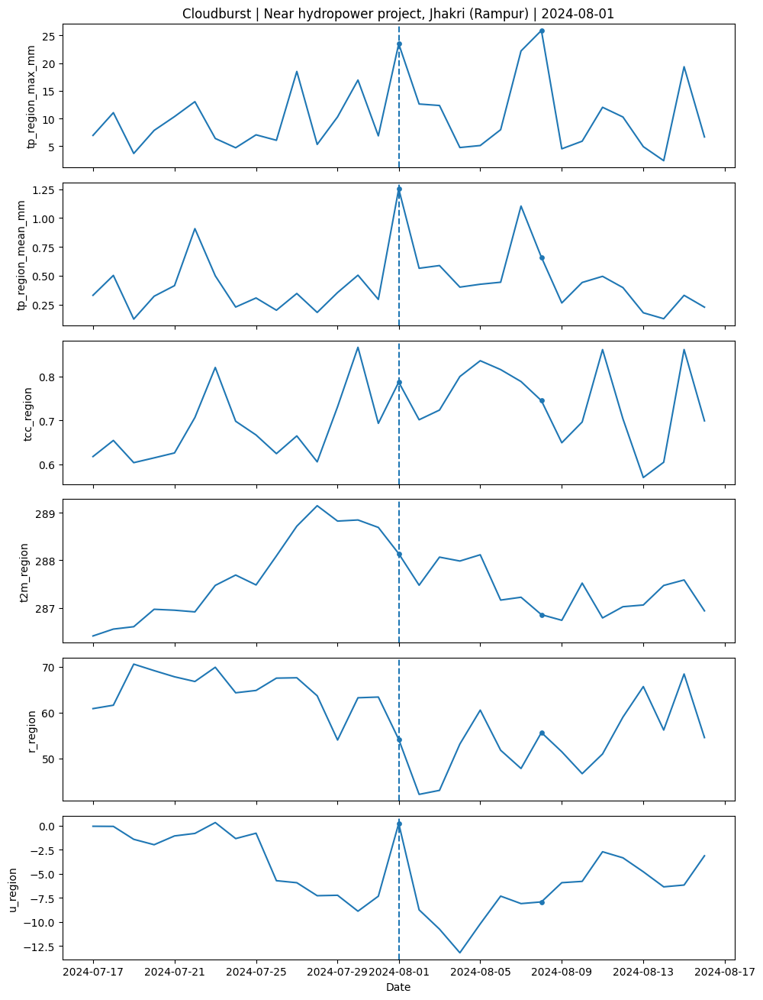

...

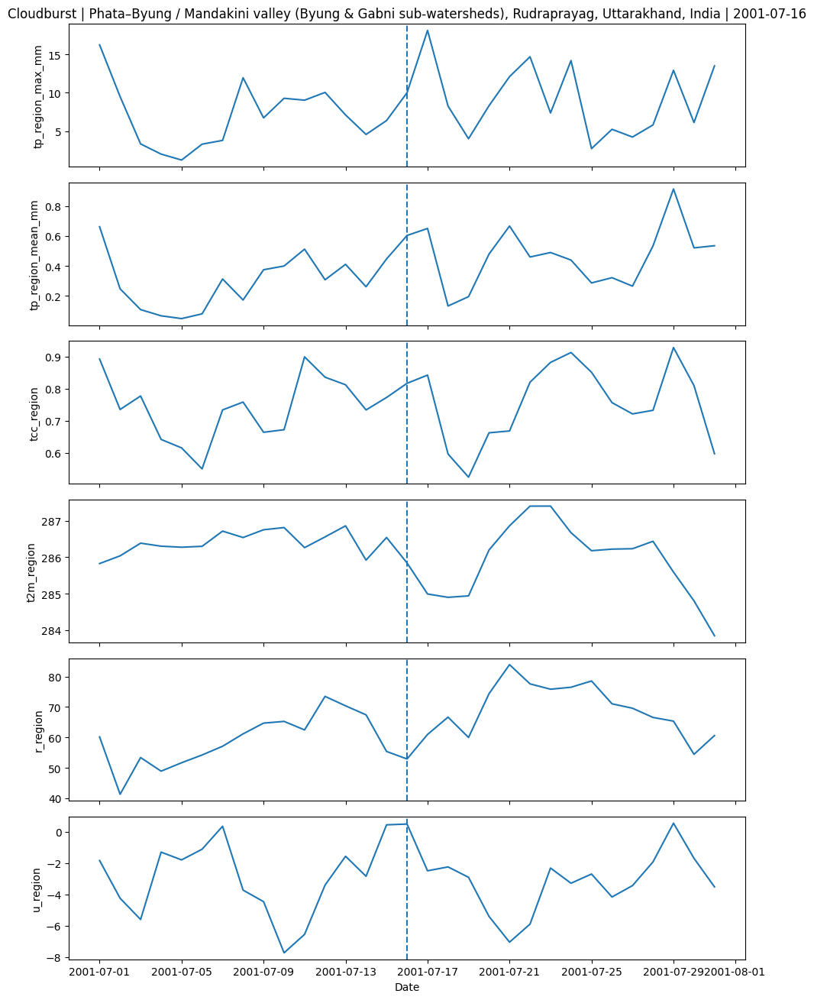

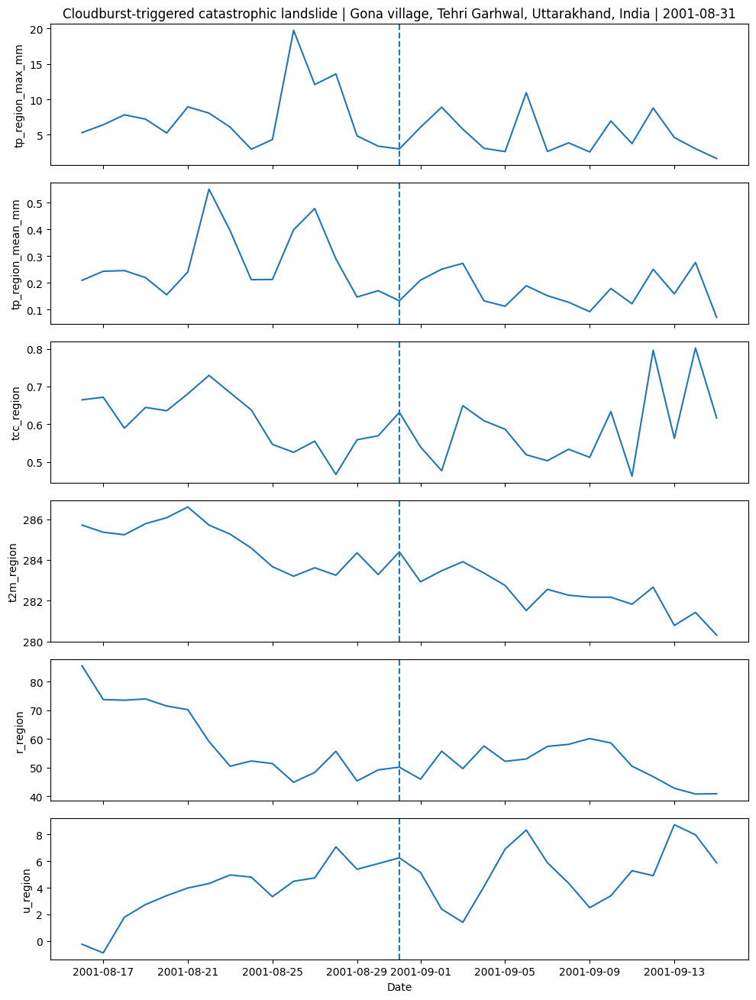

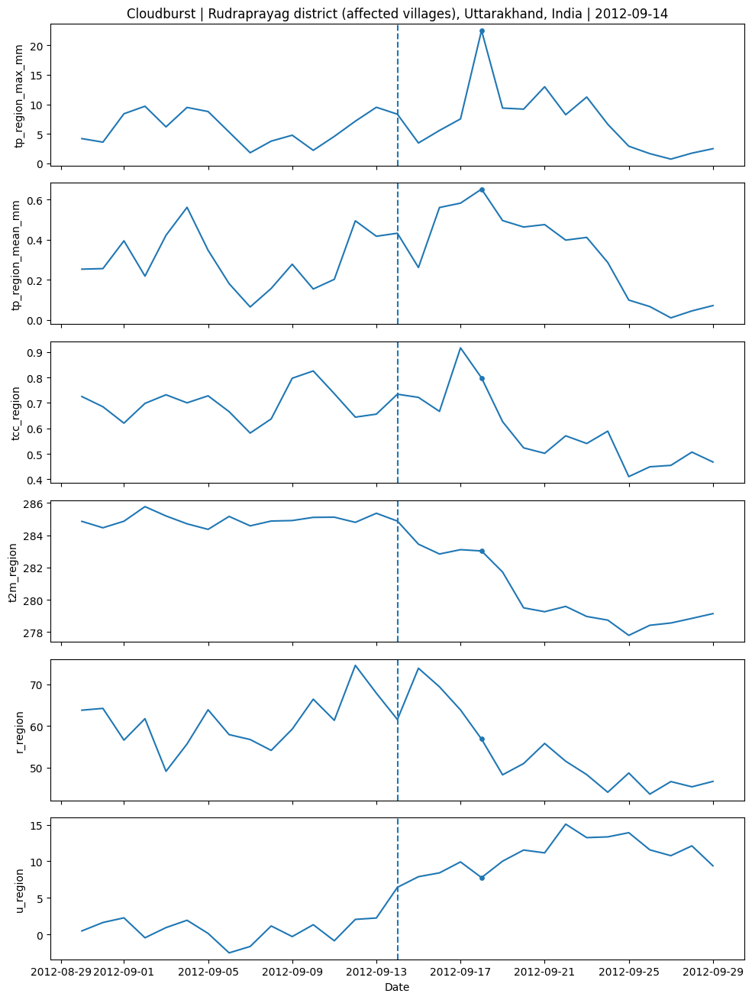

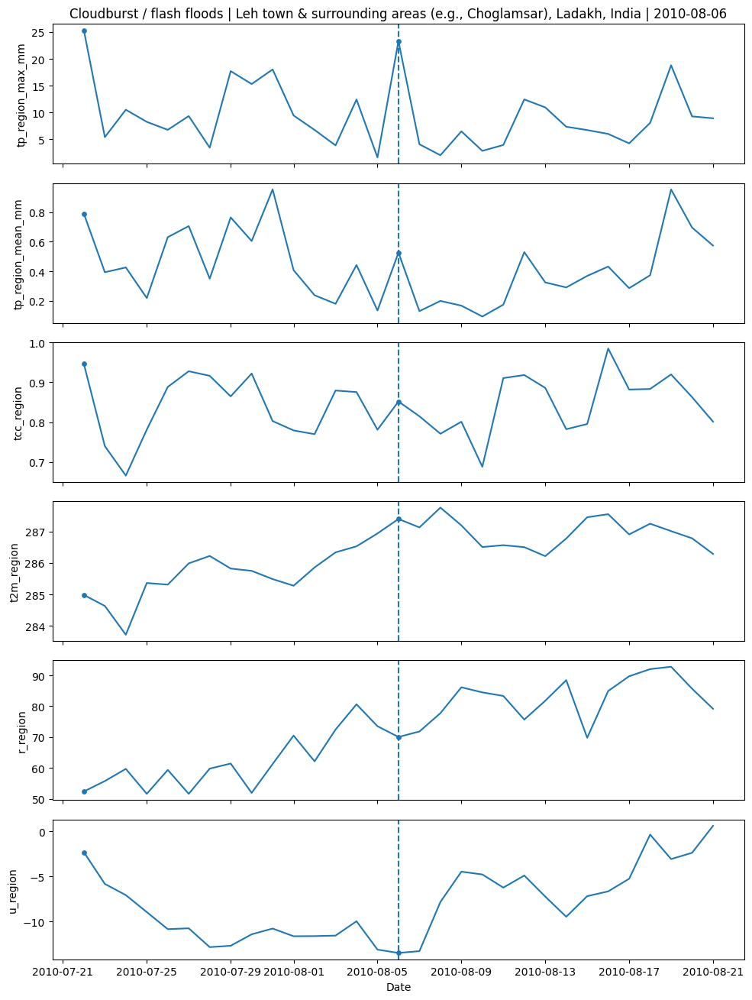

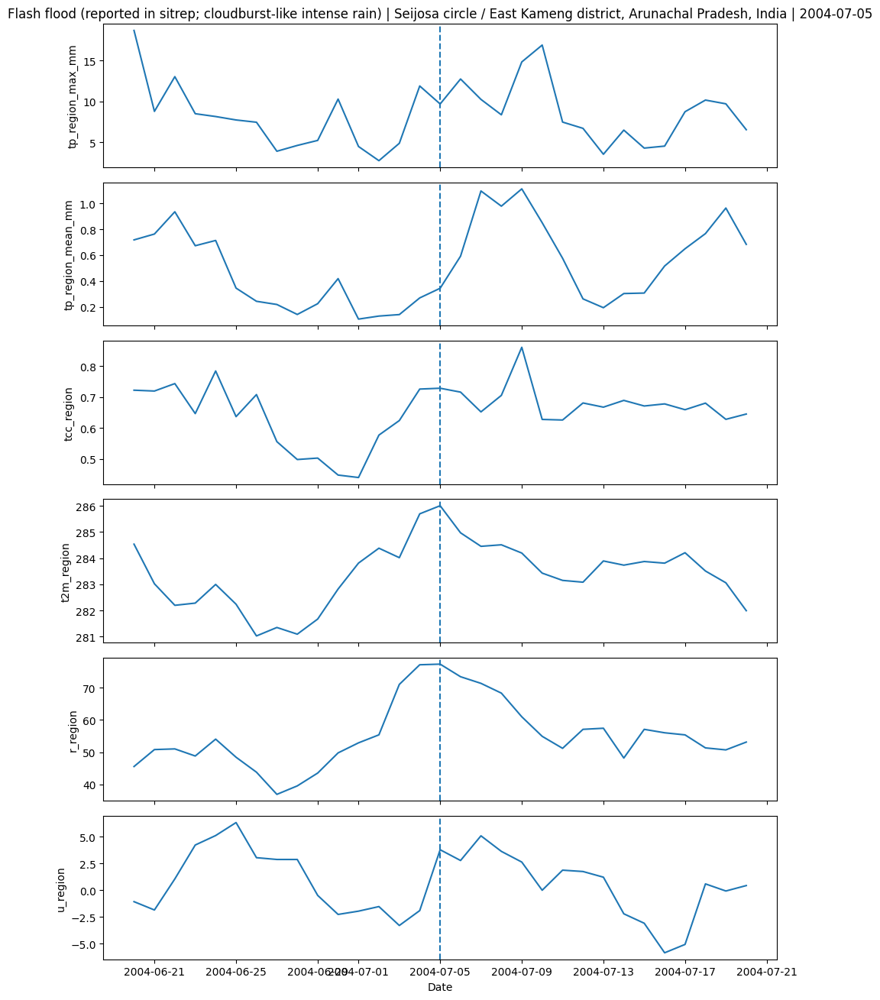

In [ ]:
# ev must contain date_IST column
# If ev["date_IST"] is datetime already, it's fine.

for i, row in ev.iterrows():
    d = row["date_IST"]
    title = f"{row.get('event_tag','Event')} | {row.get('place','')} | {pd.to_datetime(d).date()}"
    plot_event_window(d, title=title, window_days=15)

In [ ]:
def build_composite(events_dates, window_days=15):
    # returns dict: var -> (offsets, mean, std)
    offsets = np.arange(-window_days, window_days+1)
    comp = {v: [] for v in vars_to_plot}

    for d in events_dates:
        d = pd.to_datetime(d).date()
        # grab window rows
        for off in offsets:
            day = (pd.Timestamp(d) + pd.Timedelta(days=int(off))).date()
            row = df_plot[df_plot["valid_time"] == day]
            if len(row) == 0:
                for v in vars_to_plot:
                    comp[v].append(np.nan)
            else:
                for v in vars_to_plot:
                    comp[v].append(float(row.iloc[0][v]))

    # reshape to (n_events, window_len)
    n_events = len(events_dates)
    win_len = len(offsets)

    out = {}
    for v in vars_to_plot:
        arr = np.array(comp[v]).reshape(n_events, win_len)
        out[v] = {
            "offsets": offsets,
            "mean": np.nanmean(arr, axis=0),
            "std": np.nanstd(arr, axis=0)
        }
    return out

event_dates = ev["date_IST"].tolist()
composite = build_composite(event_dates, window_days=15)

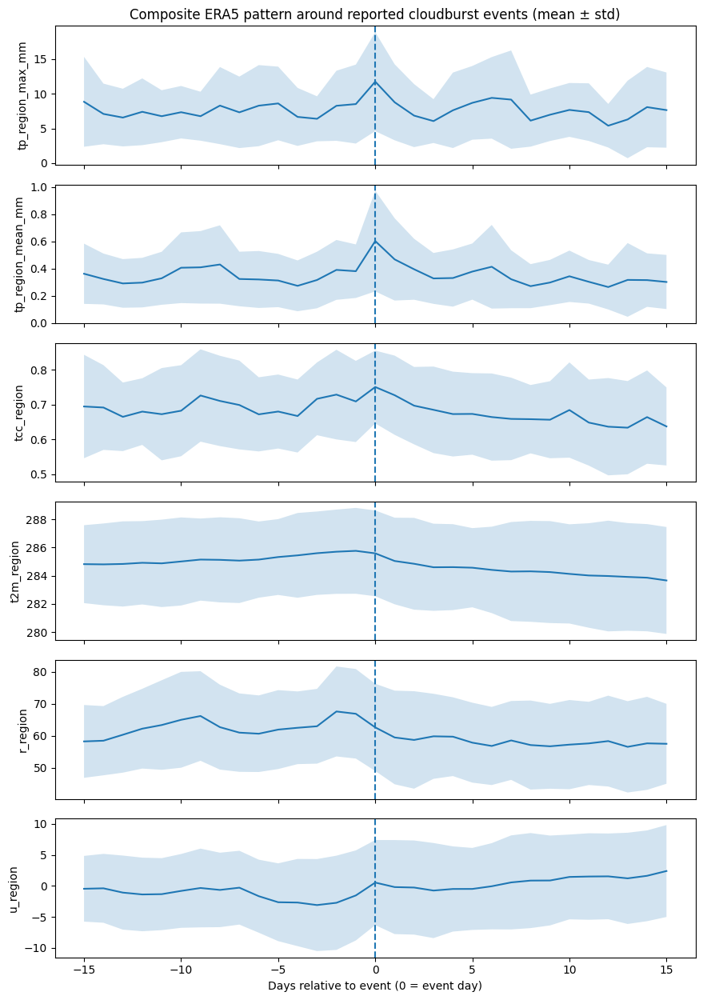

In [ ]:
fig, axes = plt.subplots(len(vars_to_plot), 1, figsize=(9, 2.1*len(vars_to_plot)), sharex=True)

for i, v in enumerate(vars_to_plot):
    ax = axes[i]
    off = composite[v]["offsets"]
    mean = composite[v]["mean"]
    std = composite[v]["std"]

    ax.plot(off, mean)
    ax.fill_between(off, mean-std, mean+std, alpha=0.2)
    ax.axvline(0, linestyle="--")  # event day
    ax.set_ylabel(v)

axes[0].set_title("Composite ERA5 pattern around reported cloudburst events (mean ± std)")
axes[-1].set_xlabel("Days relative to event (0 = event day)")
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd

# df must already exist (base ERA5 daily regional dataframe)
df2 = df.copy()
df2["valid_time"] = pd.to_datetime(df2["valid_time"]).dt.date

# ev must already exist (verified events dataframe)
ev2 = ev.copy()
ev2["date_IST"] = pd.to_datetime(ev2["date_IST"]).dt.date

# Build expanded date set (±1 day tolerance)
event_dates = set(ev2["date_IST"].tolist())
expanded_dates = set()
for d in event_dates:
    expanded_dates.add(d)
    expanded_dates.add((pd.Timestamp(d) - pd.Timedelta(days=1)).date())
    expanded_dates.add((pd.Timestamp(d) + pd.Timedelta(days=1)).date())

# Create label
df2["cloudburst_reported"] = df2["valid_time"].apply(lambda d: 1 if d in expanded_dates else 0)

print("Total ERA5 days:", len(df2))
print("Unique reported dates:", len(event_dates))
print("Expanded (±1) dates:", len(expanded_dates))
print("Label counts:", df2["cloudburst_reported"].value_counts().to_dict())
print("Pos ratio:", df2["cloudburst_reported"].mean())

Total ERA5 days: 23742
Unique reported dates: 45
Expanded (±1) dates: 117
Label counts: {0: 23625, 1: 117}
Pos ratio: 0.004927975739196361


In [ ]:
import pandas as pd

parquet_path = "/content/drive/MyDrive/Colab Notebooks/multivariate_rainfall_prediction/processed_regional_timeseries.parquet"

df = pd.read_parquet(parquet_path)
df["valid_time"] = pd.to_datetime(df["valid_time"])
df = df.sort_values("valid_time").reset_index(drop=True)

print("df shape:", df.shape)
print("columns:", df.columns.tolist())
print(df.head())

df shape: (23742, 7)
columns: ['valid_time', 'tp_region_max_mm', 'tp_region_mean_mm', 't2m_region', 'r_region', 'u_region', 'tcc_region']
  valid_time  tp_region_max_mm  tp_region_mean_mm  t2m_region   r_region  \
0 1960-01-01          0.774622           0.006109  262.660311  19.671186   
1 1960-01-02          0.805855           0.005734  262.629726  20.926420   
2 1960-01-03          0.750303           0.005351  262.912531  21.786082   
3 1960-01-04          0.544190           0.003756  263.405828  15.542789   
4 1960-01-05          0.549436           0.006841  265.184858  12.428462   

    u_region  tcc_region  
0  27.632738    0.158903  
1  26.502035    0.168239  
2  24.900148    0.105190  
3  27.271817    0.161768  
4  26.933151    0.215078  


In [ ]:
import pandas as pd

events_csv = "/content/drive/MyDrive/Colab Notebooks/multivariate_rainfall_prediction/paper_outputs/verified_himalayan_cloudburst_events_1960_2024_geocoded.csv"

ev = pd.read_csv(events_csv)
print("ev shape:", ev.shape)
print("ev columns:", ev.columns.tolist())
print(ev.head())

ev shape: (69, 10)
ev columns: ['date_IST', 'time_IST', 'event_tag', 'place', 'state_district', 'latitude', 'longitude', 'coord_tag', 'source', 'geocode_status']
     date_IST time_IST               event_tag  \
0  2021-07-27    20:00  Cloudburst/Flash flood   
1  2021-07-28    13:00              Cloudburst   
2  2021-07-28    17:30              Cloudburst   
3  2023-08-14    10:30              Cloudburst   
4  2024-08-01    04:47              Cloudburst   

                                      place  \
0        Near Tozing Nallah, Lahaul & Spiti   
1                         Aloosa, Bandipora   
2         Shri Amarnath Ji (Holy cave area)   
3          Jadon village, Kandaghat (Solan)   
4  Near hydropower project, Jhakri (Rampur)   

                                  state_district  latitude  longitude  \
0              Himachal Pradesh (Lahaul & Spiti)   32.5000    77.6000   
1                    Jammu & Kashmir (Bandipora)   34.4234    74.5449   
2  Jammu & Kashmir (Ganderbal/Anant

In [ ]:
import pandas as pd

# df must already be loaded from parquet in Step 0
# ev is loaded (you just confirmed)

df2 = df.copy()
df2["valid_time"] = pd.to_datetime(df2["valid_time"]).dt.date

ev2 = ev.copy()
ev2["date_IST"] = pd.to_datetime(ev2["date_IST"]).dt.date

event_dates = set(ev2["date_IST"].tolist())

# Expand dates by ±1 day to handle daily accumulation/report timing
expanded_dates = set()
for d in event_dates:
    expanded_dates.add(d)
    expanded_dates.add((pd.Timestamp(d) - pd.Timedelta(days=1)).date())
    expanded_dates.add((pd.Timestamp(d) + pd.Timedelta(days=1)).date())

df2["cloudburst_reported"] = df2["valid_time"].apply(lambda d: 1 if d in expanded_dates else 0)

print("Total ERA5 days:", len(df2))
print("Unique reported dates:", len(event_dates))
print("Expanded (±1) dates:", len(expanded_dates))
print("Label counts:", df2["cloudburst_reported"].value_counts().to_dict())
print("Pos ratio:", df2["cloudburst_reported"].mean())

# show first 20 positive dates
print("Positive dates (first 20):", df2.loc[df2["cloudburst_reported"]==1, "valid_time"].head(20).tolist())

Total ERA5 days: 23742
Unique reported dates: 45
Expanded (±1) dates: 117
Label counts: {0: 23625, 1: 117}
Pos ratio: 0.004927975739196361
Positive dates (first 20): [datetime.date(1968, 10, 1), datetime.date(1968, 10, 2), datetime.date(1968, 10, 3), datetime.date(1975, 2, 28), datetime.date(1975, 3, 1), datetime.date(1975, 3, 2), datetime.date(1988, 9, 28), datetime.date(1988, 9, 29), datetime.date(1988, 9, 30), datetime.date(1991, 7, 30), datetime.date(1991, 7, 31), datetime.date(1991, 8, 1), datetime.date(1991, 8, 2), datetime.date(1991, 8, 3), datetime.date(1995, 9, 3), datetime.date(1995, 9, 4), datetime.date(1995, 9, 5), datetime.date(1995, 9, 6), datetime.date(1997, 8, 10), datetime.date(1997, 8, 11)]


In [ ]:
import pandas as pd
import numpy as np

# -------------------------
# Paths (as provided)
# -------------------------
df_path = "/content/drive/MyDrive/Colab Notebooks/multivariate_rainfall_prediction/processed_regional_timeseries.parquet"
ev_path = "/content/drive/MyDrive/Colab Notebooks/multivariate_rainfall_prediction/paper_outputs/verified_himalayan_cloudburst_events_1960_2024_geocoded.csv"

In [ ]:
df = pd.read_parquet(df_path)

print("df shape:", df.shape)
print("df columns:", df.columns.tolist())
print("df date range (raw):", df["valid_time"].min(), "->", df["valid_time"].max())

# Ensure datetime + sort
df["valid_time"] = pd.to_datetime(df["valid_time"])
df = df.sort_values("valid_time").reset_index(drop=True)

print("df date range (sorted):", df["valid_time"].min(), "->", df["valid_time"].max())
df.head(3)

df shape: (23742, 7)
df columns: ['valid_time', 'tp_region_max_mm', 'tp_region_mean_mm', 't2m_region', 'r_region', 'u_region', 'tcc_region']
df date range (raw): 1960-01-01 00:00:00 -> 2024-12-31 00:00:00
df date range (sorted): 1960-01-01 00:00:00 -> 2024-12-31 00:00:00


,valid_time,tp_region_max_mm,tp_region_mean_mm,t2m_region,r_region,u_region,tcc_region
0,1960-01-01,0.774622,0.006109,262.660311,19.671186,27.632738,0.158903
1,1960-01-02,0.805855,0.005734,262.629726,20.926420,26.502035,0.168239
2,1960-01-03,0.750303,0.005351,262.912531,21.786082,24.900148,0.105190


In [ ]:
ev = pd.read_csv(ev_path)

print("ev shape:", ev.shape)
print("ev columns:", ev.columns.tolist())

# Parse event date (IST) to date-only
ev["date_IST"] = pd.to_datetime(ev["date_IST"], errors="coerce").dt.date

bad = ev["date_IST"].isna().sum()
print("Invalid/NaT event dates:", bad)

# Keep only valid dates
ev = ev.dropna(subset=["date_IST"]).reset_index(drop=True)

event_dates = set(ev["date_IST"].tolist())

expanded_dates = set()
for d in event_dates:
    dts = pd.Timestamp(d)
    expanded_dates.add((dts - pd.Timedelta(days=1)).date())
    expanded_dates.add(dts.date())
    expanded_dates.add((dts + pd.Timedelta(days=1)).date())

print("Unique reported dates:", len(event_dates))
print("Expanded (±1) dates:", len(expanded_dates))
print("First 15 expanded dates:", sorted(list(expanded_dates))[:15])

ev shape: (69, 10)
ev columns: ['date_IST', 'time_IST', 'event_tag', 'place', 'state_district', 'latitude', 'longitude', 'coord_tag', 'source', 'geocode_status']
Invalid/NaT event dates: 0
Unique reported dates: 45
Expanded (±1) dates: 117
First 15 expanded dates: [datetime.date(1968, 10, 1), datetime.date(1968, 10, 2), datetime.date(1968, 10, 3), datetime.date(1975, 2, 28), datetime.date(1975, 3, 1), datetime.date(1975, 3, 2), datetime.date(1988, 9, 28), datetime.date(1988, 9, 29), datetime.date(1988, 9, 30), datetime.date(1991, 7, 30), datetime.date(1991, 7, 31), datetime.date(1991, 8, 1), datetime.date(1991, 8, 2), datetime.date(1991, 8, 3), datetime.date(1995, 9, 3)]


In [ ]:
df2 = df.copy()

# Convert ERA5 timeline to date-only for matching
df2["date"] = df2["valid_time"].dt.date

# Label: 1 if date in expanded_dates else 0
df2["cloudburst_reported"] = df2["date"].isin(expanded_dates).astype(int)

# Quick verification
print("Total ERA5 days:", len(df2))
print("Label counts:", df2["cloudburst_reported"].value_counts().to_dict())
print("Pos ratio:", df2["cloudburst_reported"].mean())

# Show positive dates present in df2
pos_dates = df2.loc[df2["cloudburst_reported"] == 1, "date"].unique()
print("Positive days in timeline:", len(pos_dates))
print("First 20 positive dates:", sorted(pos_dates)[:20])

Total ERA5 days: 23742
Label counts: {0: 23625, 1: 117}
Pos ratio: 0.004927975739196361
Positive days in timeline: 117
First 20 positive dates: [datetime.date(1968, 10, 1), datetime.date(1968, 10, 2), datetime.date(1968, 10, 3), datetime.date(1975, 2, 28), datetime.date(1975, 3, 1), datetime.date(1975, 3, 2), datetime.date(1988, 9, 28), datetime.date(1988, 9, 29), datetime.date(1988, 9, 30), datetime.date(1991, 7, 30), datetime.date(1991, 7, 31), datetime.date(1991, 8, 1), datetime.date(1991, 8, 2), datetime.date(1991, 8, 3), datetime.date(1995, 9, 3), datetime.date(1995, 9, 4), datetime.date(1995, 9, 5), datetime.date(1995, 9, 6), datetime.date(1997, 8, 10), datetime.date(1997, 8, 11)]


## Step 3: Feature engineering

## base_predictors = ["tp_region_mean_mm", "tcc_region", "t2m_region","r_region", "u_region"]

## lags = [1, 3, 7]
# roll_window = 7

## feat_df = df2[["valid_time", "tp_region_max_mm", "cloudburst_reported"] + base_predictors].copy()

In [ ]:
# -------------------------
# Step 3: Feature engineering
# -------------------------
base_predictors = ["tp_region_mean_mm", "tcc_region", "t2m_region", "r_region", "u_region"]

lags = [1, 3, 7]
roll_window = 7

feat_df = df2[["valid_time", "tp_region_max_mm", "cloudburst_reported"] + base_predictors].copy()
feat_df = feat_df.sort_values("valid_time").reset_index(drop=True)

# Lag features
for col in base_predictors:
    for L in lags:
        feat_df[f"{col}_lag{L}"] = feat_df[col].shift(L)

# Rolling features (past-only): shift(1) so today's feature doesn't leak today's value
for col in base_predictors:
    shifted = feat_df[col].shift(1)
    feat_df[f"{col}_roll{roll_window}_mean"] = shifted.rolling(roll_window).mean()
    feat_df[f"{col}_roll{roll_window}_std"]  = shifted.rolling(roll_window).std()

# Keep reference columns but DO NOT include tp_region_max_mm as input later
# Drop NaNs created by lag/rolling
before = len(feat_df)
feat_df = feat_df.dropna().reset_index(drop=True)
after = len(feat_df)

print("Before dropna:", before)
print("After dropna :", after)
print("Dropped      :", before - after)

print("feat_df shape:", feat_df.shape)
feat_df.head(3)

Before dropna: 23742
After dropna : 23735
Dropped      : 7
feat_df shape: (23735, 33)


,valid_time,tp_region_max_mm,cloudburst_reported,tp_region_mean_mm,tcc_region,t2m_region,r_region,u_region,tp_region_mean_mm_lag1,tp_region_mean_mm_lag3,...,tp_region_mean_mm_roll7_mean,tp_region_mean_mm_roll7_std,tcc_region_roll7_mean,tcc_region_roll7_std,t2m_region_roll7_mean,t2m_region_roll7_std,r_region_roll7_mean,r_region_roll7_std,u_region_roll7_mean,u_region_roll7_std
0,1960-01-08,0.527203,0,0.011065,0.336210,263.932857,14.040668,30.402800,0.041750,0.006841,...,0.011417,0.013528,0.249657,0.153384,263.811811,1.175669,15.923139,4.893031,27.350533,1.594890
1,1960-01-09,0.193179,0,0.003108,0.420000,263.993375,14.584652,23.776860,0.011065,0.010377,...,0.012125,0.013332,0.274987,0.150512,263.993603,1.060703,15.118779,4.629927,27.746256,1.974950
2,1960-01-10,0.331581,0,0.003011,0.470849,264.839785,14.949766,24.361965,0.003108,0.041750,...,0.011750,0.013577,0.310953,0.150832,264.188410,0.877947,14.212812,3.860668,27.356945,2.468118


In [ ]:
# Model input columns
exclude_cols = ["valid_time", "tp_region_max_mm", "cloudburst_reported"]
feature_cols = [c for c in feat_df.columns if c not in exclude_cols]

print("Number of feature columns:", len(feature_cols))
print("First 25 feature columns:", feature_cols[:25])

# Target
target_col = "cloudburst_reported"

# Quick check
X_preview = feat_df[feature_cols]
y_preview = feat_df[target_col]
print("X shape:", X_preview.shape)
print("y shape:", y_preview.shape)
print("y counts:", y_preview.value_counts().to_dict())

Number of feature columns: 30
First 25 feature columns: ['tp_region_mean_mm', 'tcc_region', 't2m_region', 'r_region', 'u_region', 'tp_region_mean_mm_lag1', 'tp_region_mean_mm_lag3', 'tp_region_mean_mm_lag7', 'tcc_region_lag1', 'tcc_region_lag3', 'tcc_region_lag7', 't2m_region_lag1', 't2m_region_lag3', 't2m_region_lag7', 'r_region_lag1', 'r_region_lag3', 'r_region_lag7', 'u_region_lag1', 'u_region_lag3', 'u_region_lag7', 'tp_region_mean_mm_roll7_mean', 'tp_region_mean_mm_roll7_std', 'tcc_region_roll7_mean', 'tcc_region_roll7_std', 't2m_region_roll7_mean']
X shape: (23735, 30)
y shape: (23735,)
y counts: {0: 23618, 1: 117}


In [ ]:
from sklearn.model_selection import train_test_split

N = len(feat_df)
train_end = int(0.70 * N)
val_end   = int(0.85 * N)

train_df = feat_df.iloc[:train_end].copy()
val_df   = feat_df.iloc[train_end:val_end].copy()
test_df  = feat_df.iloc[val_end:].copy()

print("Total:", N)
print("Train:", train_df.shape, "Pos:", train_df[target_col].sum())
print("Val  :", val_df.shape,   "Pos:", val_df[target_col].sum())
print("Test :", test_df.shape,  "Pos:", test_df[target_col].sum())

print("\nDate ranges:")
print("Train:", train_df["valid_time"].min(), "->", train_df["valid_time"].max())
print("Val  :", val_df["valid_time"].min(),   "->", val_df["valid_time"].max())
print("Test :", test_df["valid_time"].min(),  "->", test_df["valid_time"].max())

Total: 23735
Train: (16614, 33) Pos: 64
Val  : (3560, 33) Pos: 27
Test : (3561, 33) Pos: 26

Date ranges:
Train: 1960-01-08 00:00:00 -> 2005-07-03 00:00:00
Val  : 2005-07-04 00:00:00 -> 2015-04-02 00:00:00
Test : 2015-04-03 00:00:00 -> 2024-12-31 00:00:00


In [ ]:
# Count positives per year (current label)
tmp = df2.copy()
tmp["year"] = tmp["valid_time"].dt.year

pos_by_year = tmp.groupby("year")["cloudburst_reported"].sum().sort_index()
print("First year with any positive:", pos_by_year[pos_by_year > 0].index.min())
print("Total positive days:", int(pos_by_year.sum()))
pos_by_year[pos_by_year > 0].head(20)

First year with any positive: 1968
Total positive days: 117


,cloudburst_reported
year,
1968,3
1975,3
1988,3
1991,5
1995,4
1997,3
1998,3
2000,4
2001,24


In [ ]:
N = len(feat_df)
train_end = int(0.70 * N)
val_end   = int(0.85 * N)

train_df = feat_df.iloc[:train_end].copy()
val_df   = feat_df.iloc[train_end:val_end].copy()
test_df  = feat_df.iloc[val_end:].copy()

print("Total:", N)
print("Train:", train_df.shape, "Pos:", int(train_df[target_col].sum()))
print("Val  :", val_df.shape,   "Pos:", int(val_df[target_col].sum()))
print("Test :", test_df.shape,  "Pos:", int(test_df[target_col].sum()))

print("\nDate ranges:")
print("Train:", train_df["valid_time"].min(), "->", train_df["valid_time"].max())
print("Val  :", val_df["valid_time"].min(),   "->", val_df["valid_time"].max())
print("Test :", test_df["valid_time"].min(),  "->", test_df["valid_time"].max())

Total: 23735
Train: (16614, 33) Pos: 64
Val  : (3560, 33) Pos: 27
Test : (3561, 33) Pos: 26

Date ranges:
Train: 1960-01-08 00:00:00 -> 2005-07-03 00:00:00
Val  : 2005-07-04 00:00:00 -> 2015-04-02 00:00:00
Test : 2015-04-03 00:00:00 -> 2024-12-31 00:00:00


In [ ]:
from sklearn.preprocessing import StandardScaler

# --- Fit scaler on train only ---
scaler = StandardScaler()
scaler.fit(train_df[feature_cols])

X_train = scaler.transform(train_df[feature_cols])
X_val   = scaler.transform(val_df[feature_cols])
X_test  = scaler.transform(test_df[feature_cols])

y_train = train_df[target_col].astype(int).values
y_val   = val_df[target_col].astype(int).values
y_test  = test_df[target_col].astype(int).values

print("X_train:", X_train.shape, "y_train:", y_train.shape)
print("X_val  :", X_val.shape,   "y_val  :", y_val.shape)
print("X_test :", X_test.shape,  "y_test :", y_test.shape)

# --- pos_weight for BCEWithLogits (neg/pos) computed from TRAIN ONLY ---
n_pos = int(y_train.sum())
n_neg = int((y_train == 0).sum())

pos_weight = (n_neg / max(n_pos, 1))
print("\nTrain positives:", n_pos, "Train negatives:", n_neg)
print("pos_weight (neg/pos):", pos_weight)

X_train: (16614, 30) y_train: (16614,)
X_val  : (3560, 30) y_val  : (3560,)
X_test : (3561, 30) y_test : (3561,)

Train positives: 64 Train negatives: 16550
pos_weight (neg/pos): 258.59375


In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader

class SequenceDataset(Dataset):
    def __init__(self, X, y, seq_len: int):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.float32)
        self.seq_len = int(seq_len)

        if len(self.X) != len(self.y):
            raise ValueError("X and y must have same length")

        if len(self.X) <= self.seq_len:
            raise ValueError(f"Not enough samples: N={len(self.X)} <= seq_len={self.seq_len}")

    def __len__(self):
        # label uses y[idx+L]
        return len(self.X) - self.seq_len

    def __getitem__(self, idx):
        x_seq = self.X[idx: idx + self.seq_len]         # (L, F)
        y_next = self.y[idx + self.seq_len]             # scalar
        return x_seq, y_next

L = 30

train_ds = SequenceDataset(X_train, y_train, seq_len=L)
val_ds   = SequenceDataset(X_val,   y_val,   seq_len=L)
test_ds  = SequenceDataset(X_test,  y_test,  seq_len=L)

print("Train sequences:", len(train_ds))
print("Val sequences  :", len(val_ds))
print("Test sequences :", len(test_ds))

# Quick check a sample
x0, y0 = train_ds[0]
print("Sample x shape:", x0.shape, "Sample y:", y0.item())


Train sequences: 16584
Val sequences  : 3530
Test sequences : 3531
Sample x shape: torch.Size([30, 30]) Sample y: 0.0


In [ ]:
from torch.utils.data import WeightedRandomSampler

batch_size = 256

# ---- Optional: weighted sampler to oversample positives in TRAIN ----
# We need the per-sequence label distribution (labels are y[idx+L])
train_seq_labels = np.array([train_ds[i][1].item() for i in range(len(train_ds))], dtype=int)

n_pos_seq = int(train_seq_labels.sum())
n_neg_seq = int((train_seq_labels == 0).sum())
print("Train sequence labels -> pos:", n_pos_seq, "neg:", n_neg_seq)

# weights: give higher weight to positive sequences
w_pos = n_neg_seq / max(n_pos_seq, 1)
weights = np.where(train_seq_labels == 1, w_pos, 1.0).astype(np.float64)

sampler = WeightedRandomSampler(
    weights=torch.tensor(weights, dtype=torch.double),
    num_samples=len(train_ds),
    replacement=True
)

train_loader = DataLoader(train_ds, batch_size=batch_size, sampler=sampler, drop_last=False)
val_loader   = DataLoader(val_ds,   batch_size=batch_size, shuffle=False, drop_last=False)
test_loader  = DataLoader(test_ds,  batch_size=batch_size, shuffle=False, drop_last=False)

# Quick batch sanity
xb, yb = next(iter(train_loader))
print("Batch x:", xb.shape, "Batch y:", yb.shape, "batch pos:", int(yb.sum().item()))

Train sequence labels -> pos: 64 neg: 16520
Batch x: torch.Size([256, 30, 30]) Batch y: torch.Size([256]) batch pos: 125


# nn.TransformerEncoder / nn.TransformerEncoderLaye

In [ ]:
# import torch.nn as nn
# import torch.nn.functional as F

# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# print("device:", device)

# class FocalBCEWithLogits(nn.Module):
#     def __init__(self, alpha=0.75, gamma=2.0, pos_weight=None, reduction="mean"):
#         super().__init__()
#         self.alpha = alpha
#         self.gamma = gamma
#         self.reduction = reduction
#         self.register_buffer("pos_weight", pos_weight if pos_weight is not None else None)

#     def forward(self, logits, targets):
#         targets = targets.float()
#         bce = F.binary_cross_entropy_with_logits(
#             logits, targets,
#             pos_weight=self.pos_weight,
#             reduction="none"
#         )
#         p = torch.sigmoid(logits)
#         pt = torch.where(targets == 1, p, 1 - p)
#         focal = (1 - pt).pow(self.gamma)

#         # alpha weighting (alpha for positives, 1-alpha for negatives)
#         alpha_t = torch.where(targets == 1, self.alpha, 1 - self.alpha)

#         loss = alpha_t * focal * bce
#         if self.reduction == "mean":
#             return loss.mean()
#         if self.reduction == "sum":
#             return loss.sum()
#         return loss

# class PatchTSTBinary(nn.Module):
#     def __init__(self, n_features, d_model=128, n_heads=8, n_layers=4, dropout=0.1, max_len=512):
#         super().__init__()
#         self.n_features = n_features
#         self.d_model = d_model

#         self.in_proj = nn.Linear(n_features, d_model)
#         self.pos_emb = nn.Parameter(torch.zeros(1, max_len, d_model))
#         nn.init.normal_(self.pos_emb, std=0.02)

#         encoder_layer = nn.TransformerEncoderLayer(
#             d_model=d_model, nhead=n_heads,
#             dim_feedforward=4*d_model,
#             dropout=dropout,
#             activation="gelu",
#             batch_first=True,
#             norm_first=True
#         )
#         self.encoder = nn.TransformerEncoder(encoder_layer, num_layers=n_layers)
#         self.dropout = nn.Dropout(dropout)
#         self.head = nn.Linear(d_model, 1)

#     def forward(self, x):
#         # x: (B, L, F)
#         B, L, Fdim = x.shape
#         h = self.in_proj(x)  # (B, L, d_model)
#         h = h + self.pos_emb[:, :L, :]
#         h = self.encoder(h)  # (B, L, d_model)

#         # pooling (mean over time)
#         h = h.mean(dim=1)
#         h = self.dropout(h)
#         logit = self.head(h).squeeze(-1)  # (B,)
#         return logit

# # Build model
# n_features = X_train.shape[1]
# model = PatchTSTBinary(n_features=n_features, d_model=128, n_heads=8, n_layers=4, dropout=0.1, max_len=512).to(device)

# # Loss
# pos_w_t = torch.tensor(pos_weight, dtype=torch.float32, device=device)
# criterion = FocalBCEWithLogits(alpha=0.85, gamma=2.0, pos_weight=pos_w_t).to(device)

# # Sanity forward pass
# xb, yb = next(iter(train_loader))
# xb, yb = xb.to(device), yb.to(device)
# with torch.no_grad():
#     logits = model(xb)
#     loss = criterion(logits, yb)

# print("logits shape:", logits.shape, "loss:", float(loss))
# print("logits min/max:", float(logits.min()), float(logits.max()))

# Our Custom Model (for paper): Patch + Spike-Gated Attention Network

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import math

class MultiHeadSelfAttention(nn.Module):
    """
    Fully custom MHA (no nn.MultiheadAttention, no nn.TransformerEncoder).
    Input: x (B, T, D)
    Output: (B, T, D)
    """
    def __init__(self, d_model: int, n_heads: int, attn_dropout: float = 0.1, proj_dropout: float = 0.1):
        super().__init__()
        assert d_model % n_heads == 0, "d_model must be divisible by n_heads"
        self.d_model = d_model
        self.n_heads = n_heads
        self.d_head = d_model // n_heads

        self.Wq = nn.Linear(d_model, d_model, bias=False)
        self.Wk = nn.Linear(d_model, d_model, bias=False)
        self.Wv = nn.Linear(d_model, d_model, bias=False)
        self.out = nn.Linear(d_model, d_model, bias=False)

        self.attn_drop = nn.Dropout(attn_dropout)
        self.proj_drop = nn.Dropout(proj_dropout)

    def forward(self, x):
        B, T, D = x.shape

        q = self.Wq(x)  # (B, T, D)
        k = self.Wk(x)
        v = self.Wv(x)

        # reshape to heads: (B, H, T, d_head)
        q = q.view(B, T, self.n_heads, self.d_head).transpose(1, 2)
        k = k.view(B, T, self.n_heads, self.d_head).transpose(1, 2)
        v = v.view(B, T, self.n_heads, self.d_head).transpose(1, 2)

        # scaled dot-product attention
        scores = (q @ k.transpose(-2, -1)) / math.sqrt(self.d_head)  # (B, H, T, T)
        attn = torch.softmax(scores, dim=-1)
        attn = self.attn_drop(attn)

        out = attn @ v  # (B, H, T, d_head)
        out = out.transpose(1, 2).contiguous().view(B, T, D)  # (B, T, D)

        out = self.out(out)
        out = self.proj_drop(out)
        return out

In [ ]:
class FeedForward(nn.Module):
    def __init__(self, d_model: int, d_ff: int, dropout: float = 0.1):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(d_model, d_ff),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(d_ff, d_model),
            nn.Dropout(dropout),
        )

    def forward(self, x):
        return self.net(x)


class TransformerBlock(nn.Module):
    """
    Fully custom Transformer block:
    x -> LN -> MHA -> residual -> LN -> FFN -> residual
    """
    def __init__(self, d_model: int, n_heads: int, d_ff: int, dropout: float = 0.1):
        super().__init__()
        self.ln1 = nn.LayerNorm(d_model)
        self.attn = MultiHeadSelfAttention(d_model=d_model, n_heads=n_heads,
                                           attn_dropout=dropout, proj_dropout=dropout)
        self.ln2 = nn.LayerNorm(d_model)
        self.ffn = FeedForward(d_model=d_model, d_ff=d_ff, dropout=dropout)

    def forward(self, x):
        x = x + self.attn(self.ln1(x))
        x = x + self.ffn(self.ln2(x))
        return x

In [ ]:
# ---- Define criterion again (no dependency on earlier cells) ----
class FocalBCEWithLogits(nn.Module):
    def __init__(self, alpha=0.85, gamma=2.0, pos_weight=None, reduction="mean"):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction
        self.register_buffer("pos_weight", pos_weight if pos_weight is not None else None)

    def forward(self, logits, targets):
        targets = targets.float()
        bce = F.binary_cross_entropy_with_logits(
            logits, targets,
            pos_weight=self.pos_weight,
            reduction="none"
        )
        p = torch.sigmoid(logits)
        pt = torch.where(targets == 1, p, 1 - p)
        focal = (1 - pt).pow(self.gamma)

        alpha_t = torch.where(targets == 1, self.alpha, 1 - self.alpha)

        loss = alpha_t * focal * bce
        if self.reduction == "mean":
            return loss.mean()
        if self.reduction == "sum":
            return loss.sum()
        return loss

pos_w_t = torch.tensor(pos_weight, dtype=torch.float32, device=device)
criterion = FocalBCEWithLogits(alpha=0.85, gamma=2.0, pos_weight=pos_w_t).to(device)

# ---- Sanity forward ----
xb, yb = next(iter(train_loader))
xb, yb = xb.to(device), yb.to(device)

with torch.no_grad():
    logits, gates = model(xb)
    test_loss = criterion(logits, yb)

print("logits shape:", logits.shape)
print("gates shape :", gates.shape, "(tokens =", gates.shape[1], ")")
print("loss:", float(test_loss))
print("logits min/max:", float(logits.min()), float(logits.max()))
print("gate min/max  :", float(gates.min()), float(gates.max()))

logits shape: torch.Size([256])
gates shape : torch.Size([256, 6, 1]) (tokens = 6 )
loss: 8.906410217285156
logits min/max: -1.1517847776412964 1.1408222913742065
gate min/max  : 0.3624526858329773 0.6049959063529968


In [ ]:
class SpikeGate(nn.Module):
    """
    Learns a gate per token to emphasize spike-like precursor patterns.
    gate in (0,1): token = token * (1 + gate)
    """
    def __init__(self, d_model: int, hidden: int = 64, dropout: float = 0.1):
        super().__init__()
        self.net = nn.Sequential(
            nn.LayerNorm(d_model),
            nn.Linear(d_model, hidden),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(hidden, 1),
        )

    def forward(self, tokens):
        # tokens: (B, T, D)
        g = torch.sigmoid(self.net(tokens))  # (B, T, 1)
        return tokens * (1.0 + g), g


class CustomPatchSpikeTransformer(nn.Module):
    def __init__(
        self,
        n_features: int,
        seq_len: int = 30,
        patch_len: int = 5,
        d_model: int = 128,
        n_heads: int = 8,
        n_layers: int = 4,
        dropout: float = 0.1,
    ):
        super().__init__()
        assert seq_len % patch_len == 0, "seq_len must be divisible by patch_len"
        self.n_features = n_features
        self.seq_len = seq_len
        self.patch_len = patch_len
        self.n_tokens = seq_len // patch_len
        self.d_model = d_model

        patch_dim = patch_len * n_features

        # Patch embedding
        self.patch_proj = nn.Linear(patch_dim, d_model)

        # Positional embedding on tokens
        self.pos_emb = nn.Parameter(torch.zeros(1, self.n_tokens, d_model))
        nn.init.normal_(self.pos_emb, std=0.02)

        # Spike gate
        self.spike_gate = SpikeGate(d_model=d_model, hidden=64, dropout=dropout)

        # Custom transformer stack
        self.blocks = nn.ModuleList([
            TransformerBlock(d_model=d_model, n_heads=n_heads, d_ff=4*d_model, dropout=dropout)
            for _ in range(n_layers)
        ])

        self.final_ln = nn.LayerNorm(d_model)
        self.dropout = nn.Dropout(dropout)
        self.head = nn.Linear(d_model, 1)

    def patchify(self, x):
        # x: (B, L, F) -> (B, N, patch_len*F)
        B, L, F = x.shape
        N = self.n_tokens
        x = x.view(B, N, self.patch_len, F)           # (B, N, P, F)
        x = x.reshape(B, N, self.patch_len * F)       # (B, N, P*F)
        return x

    def forward(self, x):
        # x: (B, L, F)
        patches = self.patchify(x)                    # (B, N, P*F)
        tok = self.patch_proj(patches)                # (B, N, D)
        tok = tok + self.pos_emb                      # (B, N, D)

        tok, gates = self.spike_gate(tok)             # (B, N, D), (B, N, 1)

        for blk in self.blocks:
            tok = blk(tok)

        tok = self.final_ln(tok)
        pooled = tok.mean(dim=1)                      # (B, D)
        pooled = self.dropout(pooled)
        logit = self.head(pooled).squeeze(-1)         # (B,)
        return logit, gates


# Instantiate model (replaces the previous built-in encoder model)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CustomPatchSpikeTransformer(
    n_features=X_train.shape[1],
    seq_len=L,
    patch_len=5,
    d_model=128,
    n_heads=8,
    n_layers=4,
    dropout=0.1
).to(device)

# Sanity forward pass
xb, yb = next(iter(train_loader))
xb, yb = xb.to(device), yb.to(device)

with torch.no_grad():
    logits, gates = model(xb)
    test_loss = criterion(logits, yb)

print("logits shape:", logits.shape)
print("gates shape :", gates.shape, "(tokens =", gates.shape[1], ")")
print("loss:", float(test_loss))
print("logits min/max:", float(logits.min()), float(logits.max()))
print("gate min/max  :", float(gates.min()), float(gates.max()))

logits shape: torch.Size([256])
gates shape : torch.Size([256, 6, 1]) (tokens = 6 )
loss: 12.835528373718262
logits min/max: -1.252692699432373 0.818153440952301
gate min/max  : 0.31947061419487 0.6716238260269165


In [ ]:
# import copy
# import torch.optim as optim

# # ---- Ensure device ----
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# print("device:", device)

# # ---- Rebuild model (custom) ----
# L = 30  # sequence length already used in dataset
# model = CustomPatchSpikeTransformer(
#     n_features=X_train.shape[1],
#     seq_len=L,
#     patch_len=5,
#     d_model=128,
#     n_heads=8,
#     n_layers=4,
#     dropout=0.1
# ).to(device)

# # ---- Rebuild criterion ----
# pos_w_t = torch.tensor(pos_weight, dtype=torch.float32, device=device)
# criterion = FocalBCEWithLogits(alpha=0.85, gamma=2.0, pos_weight=pos_w_t).to(device)

# # ---- Optimizer ----
# lr = 2e-4
# weight_decay = 1e-3
# optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)

# # ---- Training config ----
# epochs = 25
# grad_clip = 1.0

# best_state = None
# best_val_ap = -1.0
# best_val_metrics = None

# for epoch in range(1, epochs + 1):
#     model.train()
#     total_loss = 0.0
#     n_batches = 0

#     for xb, yb in train_loader:
#         xb = xb.to(device)
#         yb = yb.to(device)

#         optimizer.zero_grad(set_to_none=True)
#         logits, _ = model(xb)
#         loss = criterion(logits, yb)

#         loss.backward()
#         torch.nn.utils.clip_grad_norm_(model.parameters(), grad_clip)
#         optimizer.step()

#         total_loss += float(loss.item())
#         n_batches += 1

#     train_loss = total_loss / max(n_batches, 1)

#     # Evaluate on val
#     val_metrics = eval_metrics(model, val_loader, device, threshold=None)
#     val_ap = val_metrics["PR_AUC"]

#     # Save best by Val PR-AUC
#     if not np.isnan(val_ap) and val_ap > best_val_ap:
#         best_val_ap = val_ap
#         best_state = copy.deepcopy(model.state_dict())
#         best_val_metrics = val_metrics

#     print(
#         f"Epoch {epoch:02d} | train_loss={train_loss:.4f} | "
#         f"val_PR_AUC={val_metrics['PR_AUC']:.5f} val_ROC_AUC={val_metrics['ROC_AUC']:.5f} "
#         f"val_F1={val_metrics['F1']:.5f} thr={val_metrics['threshold']:.3f}"
#     )

# print("\nBest Val metrics:", best_val_metrics)

# # Load best before test
# if best_state is not None:
#     model.load_state_dict(best_state)

# test_metrics = eval_metrics(model, test_loader, device,
#                            threshold=best_val_metrics["threshold"] if best_val_metrics else None)
# print("\nTest metrics (using val-selected threshold):", test_metrics)

In [ ]:
from sklearn.metrics import average_precision_score, roc_auc_score, f1_score, precision_score, recall_score
from sklearn.metrics import precision_recall_curve

def sigmoid_np(x):
    return 1.0 / (1.0 + np.exp(-x))

@torch.no_grad()
def predict_logits(model, loader, device):
    model.eval()
    all_logits, all_y = [], []
    for xb, yb in loader:
        xb = xb.to(device)
        yb = yb.to(device)
        logits, _ = model(xb)
        all_logits.append(logits.detach().cpu().numpy())
        all_y.append(yb.detach().cpu().numpy())
    return np.concatenate(all_logits), np.concatenate(all_y)

def best_f1_threshold(y_true, probs):
    # choose threshold that maximizes F1 on given set
    prec, rec, thr = precision_recall_curve(y_true, probs)
    # precision_recall_curve returns thr of length = len(prec)-1
    f1 = (2 * prec * rec) / (prec + rec + 1e-12)
    best_idx = np.nanargmax(f1)
    best_thr = thr[best_idx] if best_idx < len(thr) else 0.5
    return float(best_thr), float(f1[best_idx])

def eval_metrics(model, loader, device, threshold=None):
    logits, y = predict_logits(model, loader, device)
    probs = sigmoid_np(logits)

    # Metrics robust to extreme imbalance
    ap = average_precision_score(y, probs) if len(np.unique(y)) > 1 else np.nan
    roc = roc_auc_score(y, probs) if len(np.unique(y)) > 1 else np.nan

    if threshold is None:
        threshold, _ = best_f1_threshold(y, probs)

    yhat = (probs >= threshold).astype(int)
    f1 = f1_score(y, yhat, zero_division=0)
    prec = precision_score(y, yhat, zero_division=0)
    rec = recall_score(y, yhat, zero_division=0)

    return {
        "PR_AUC": float(ap),
        "ROC_AUC": float(roc),
        "F1": float(f1),
        "Precision": float(prec),
        "Recall": float(rec),
        "threshold": float(threshold),
    }

In [ ]:
import copy
import torch.optim as optim

# Optimizer
lr = 2e-4
weight_decay = 1e-3
optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)

# Training config
epochs = 25
grad_clip = 1.0

best_state = None
best_val_ap = -1.0
best_val_metrics = None

for epoch in range(1, epochs + 1):
    model.train()
    total_loss = 0.0
    n_batches = 0

    for xb, yb in train_loader:
        xb = xb.to(device)
        yb = yb.to(device)

        optimizer.zero_grad(set_to_none=True)
        logits, _ = model(xb)
        loss = criterion(logits, yb)

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), grad_clip)
        optimizer.step()

        total_loss += float(loss.item())
        n_batches += 1

    train_loss = total_loss / max(n_batches, 1)

    # Evaluate
    val_metrics = eval_metrics(model, val_loader, device, threshold=None)

    # Track best by Val PR-AUC
    val_ap = val_metrics["PR_AUC"]
    if not np.isnan(val_ap) and val_ap > best_val_ap:
        best_val_ap = val_ap
        best_state = copy.deepcopy(model.state_dict())
        best_val_metrics = val_metrics

    print(
        f"Epoch {epoch:02d} | train_loss={train_loss:.4f} | "
        f"val_PR_AUC={val_metrics['PR_AUC']:.5f} val_ROC_AUC={val_metrics['ROC_AUC']:.5f} "
        f"val_F1={val_metrics['F1']:.5f} thr={val_metrics['threshold']:.3f}"
    )

print("\nBest Val metrics:", best_val_metrics)

# Load best checkpoint before testing
if best_state is not None:
    model.load_state_dict(best_state)

test_metrics = eval_metrics(model, test_loader, device, threshold=best_val_metrics["threshold"] if best_val_metrics else None)
print("\nTest metrics (using val-selected threshold):", test_metrics)

Epoch 01 | train_loss=0.5081 | val_PR_AUC=0.02424 val_ROC_AUC=0.85672 val_F1=0.05773 thr=0.963
Epoch 02 | train_loss=0.0471 | val_PR_AUC=0.04919 val_ROC_AUC=0.90594 val_F1=0.10227 thr=0.977
Epoch 03 | train_loss=0.0306 | val_PR_AUC=0.03855 val_ROC_AUC=0.74291 val_F1=0.11881 thr=0.704
Epoch 04 | train_loss=0.0084 | val_PR_AUC=0.03796 val_ROC_AUC=0.82425 val_F1=0.10345 thr=0.844
Epoch 05 | train_loss=0.0051 | val_PR_AUC=0.01841 val_ROC_AUC=0.49976 val_F1=0.07692 thr=0.129
Epoch 06 | train_loss=0.0072 | val_PR_AUC=0.03418 val_ROC_AUC=0.74860 val_F1=0.08333 thr=0.986
Epoch 07 | train_loss=0.0366 | val_PR_AUC=0.03712 val_ROC_AUC=0.65330 val_F1=0.10084 thr=0.358
Epoch 08 | train_loss=0.0028 | val_PR_AUC=0.03297 val_ROC_AUC=0.64277 val_F1=0.08247 thr=0.850
Epoch 09 | train_loss=0.0380 | val_PR_AUC=0.03344 val_ROC_AUC=0.63690 val_F1=0.10667 thr=0.959
Epoch 10 | train_loss=0.0030 | val_PR_AUC=0.01968 val_ROC_AUC=0.51278 val_F1=0.07500 thr=0.197
Epoch 11 | train_loss=0.0049 | val_PR_AUC=0.03664 

In [ ]:
from sklearn.metrics import confusion_matrix

# Get test predictions
test_logits, test_y = predict_logits(model, test_loader, device)
test_probs = 1.0 / (1.0 + np.exp(-test_logits))
thr = best_val_metrics["threshold"]

test_pred = (test_probs >= thr).astype(int)

cm = confusion_matrix(test_y, test_pred)
tn, fp, fn, tp = cm.ravel()

print("Threshold:", thr)
print("Confusion matrix [[TN, FP],[FN, TP]]:\n", cm)
print(f"TN={tn} FP={fp} FN={fn} TP={tp}")

# How many predicted positives?
print("\nPredicted positives:", int(test_pred.sum()), "out of", len(test_pred))

# Map back to dates for interpretability:
# Each sequence i corresponds to label at index i+L in the original split dataframe
test_label_dates = test_df["valid_time"].iloc[L:].reset_index(drop=True)  # aligns with SequenceDataset labels
pred_pos_dates = test_label_dates[test_pred == 1]
true_pos_dates = test_label_dates[test_y.astype(int) == 1]

print("\nFirst 30 predicted-positive dates:")
print(pred_pos_dates.head(30).to_string(index=False))

print("\nTrue-positive (event) dates in test (first 50):")
print(true_pos_dates.head(50).to_string(index=False))

Threshold: 0.9771382808685303
Confusion matrix [[TN, FP],[FN, TP]]:
 [[3334  171]
 [  20    6]]
TN=3334 FP=171 FN=20 TP=6

Predicted positives: 177 out of 3531

First 30 predicted-positive dates:
2015-09-07
2015-09-10
2015-09-11
2015-09-12
2016-07-15
2016-07-16
2016-07-17
2016-07-18
2016-07-19
2016-08-04
2016-08-05
2016-08-07
2016-08-08
2016-08-09
2016-08-13
2016-08-18
2016-08-19
2016-08-20
2016-08-23
2016-08-24
2017-07-22
2017-07-23
2017-07-24
2017-07-26
2017-07-27
2017-07-28
2017-07-31
2017-08-01
2017-08-02
2017-08-03

True-positive (event) dates in test (first 50):
2016-05-27
2016-05-28
2016-05-29
2016-06-30
2016-07-01
2016-07-02
2017-08-12
2017-08-13
2017-08-14
2017-08-15
2021-07-26
2021-07-27
2021-07-28
2021-07-29
2022-07-07
2022-07-08
2022-07-09
2023-08-13
2023-08-14
2023-08-15
2024-07-24
2024-07-25
2024-07-26
2024-07-31
2024-08-01
2024-08-02


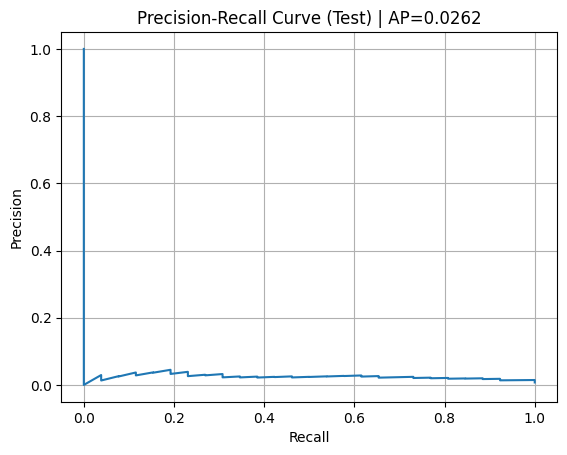

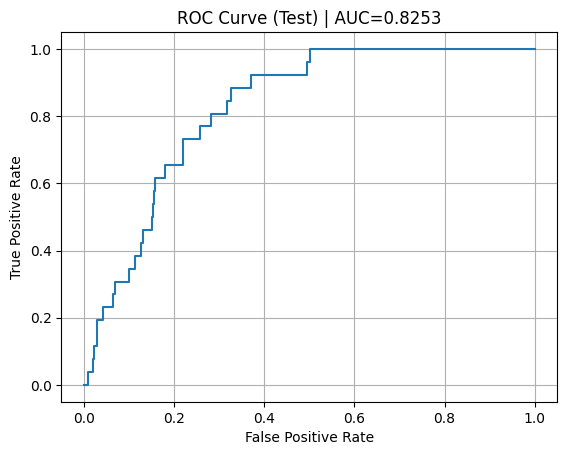

Test AP (PR-AUC): 0.026242750573150245
Test ROC-AUC: 0.8253264567101941


In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, roc_curve, auc

# PR curve
prec, rec, thr = precision_recall_curve(test_y, test_probs)
ap = average_precision_score(test_y, test_probs)

plt.figure()
plt.plot(rec, prec)
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title(f"Precision-Recall Curve (Test) | AP={ap:.4f}")
plt.grid(True)
plt.show()

# ROC curve
fpr, tpr, _ = roc_curve(test_y, test_probs)
roc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title(f"ROC Curve (Test) | AUC={roc:.4f}")
plt.grid(True)
plt.show()

print("Test AP (PR-AUC):", ap)
print("Test ROC-AUC:", roc)

In [ ]:
@torch.no_grad()
def predict_logits_and_gates(model, loader, device):
    model.eval()
    all_logits, all_y, all_gate_mean = [], [], []
    for xb, yb in loader:
        xb = xb.to(device)
        yb = yb.to(device)
        logits, gates = model(xb)                # gates: (B, tokens, 1)
        gate_mean = gates.mean(dim=1).squeeze(-1)  # (B,)
        all_logits.append(logits.detach().cpu().numpy())
        all_y.append(yb.detach().cpu().numpy())
        all_gate_mean.append(gate_mean.detach().cpu().numpy())
    return np.concatenate(all_logits), np.concatenate(all_y), np.concatenate(all_gate_mean)

test_logits2, test_y2, test_gate_mean = predict_logits_and_gates(model, test_loader, device)
test_probs2 = 1.0 / (1.0 + np.exp(-test_logits2))
thr = best_val_metrics["threshold"]
test_pred2 = (test_probs2 >= thr).astype(int)

# Sanity: same as earlier
assert np.allclose(test_probs2, test_probs), "Mismatch: probabilities differ from prior test run"

# Gate stats by true class
gate_pos = test_gate_mean[test_y2.astype(int) == 1]
gate_neg = test_gate_mean[test_y2.astype(int) == 0]

print("Gate mean (True Positives)  : n=", len(gate_pos), "mean=", float(gate_pos.mean()), "std=", float(gate_pos.std()))
print("Gate mean (True Negatives)  : n=", len(gate_neg), "mean=", float(gate_neg.mean()), "std=", float(gate_neg.std()))

# Gate stats by confusion group
tn_mask = (test_y2 == 0) & (test_pred2 == 0)
fp_mask = (test_y2 == 0) & (test_pred2 == 1)
fn_mask = (test_y2 == 1) & (test_pred2 == 0)
tp_mask = (test_y2 == 1) & (test_pred2 == 1)

def summarize(name, mask):
    arr = test_gate_mean[mask]
    if len(arr) == 0:
        return f"{name}: n=0"
    return f"{name}: n={len(arr)} mean={arr.mean():.4f} std={arr.std():.4f}"

print("\nBy confusion group (test):")
print(summarize("TN", tn_mask))
print(summarize("FP", fp_mask))
print(summarize("FN", fn_mask))
print(summarize("TP", tp_mask))

# Show top gated predicted positives (for interpretation)
test_label_dates = test_df["valid_time"].iloc[L:].reset_index(drop=True)
pred_pos_idx = np.where(test_pred2 == 1)[0]
if len(pred_pos_idx) > 0:
    topk = pred_pos_idx[np.argsort(-test_gate_mean[pred_pos_idx])][:20]
    print("\nTop 20 predicted-positive dates by gate strength:")
    for i in topk:
        print(str(test_label_dates.iloc[i].date()), "prob=", float(test_probs2[i]), "gate_mean=", float(test_gate_mean[i]))
else:
    print("\nNo predicted positives at this threshold.")

Gate mean (True Positives)  : n= 26 mean= 0.43819838762283325 std= 0.03905898332595825
Gate mean (True Negatives)  : n= 3505 mean= 0.46049386262893677 std= 0.0728704184293747

By confusion group (test):
TN: n=3334 mean=0.4606 std=0.0746
FP: n=171 mean=0.4581 std=0.0186
FN: n=20 mean=0.4320 std=0.0412
TP: n=6 mean=0.4589 std=0.0196

Top 20 predicted-positive dates by gate strength:
2018-09-04 prob= 0.977920413017273 gate_mean= 0.4965479075908661
2017-09-01 prob= 0.981164276599884 gate_mean= 0.48969191312789917
2017-08-29 prob= 0.9836516976356506 gate_mean= 0.48875054717063904
2023-08-18 prob= 0.9778791069984436 gate_mean= 0.48852524161338806
2022-08-27 prob= 0.9775553941726685 gate_mean= 0.48780879378318787
2017-09-02 prob= 0.9880111813545227 gate_mean= 0.48742860555648804
2022-09-05 prob= 0.9805834293365479 gate_mean= 0.4869728982448578
2017-08-28 prob= 0.9855060577392578 gate_mean= 0.48656928539276123
2020-09-14 prob= 0.9786756634712219 gate_mean= 0.4862668514251709
2019-08-27 prob= 0

In [ ]:
import copy
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader

# --------- Rebuild loaders WITHOUT oversampling ----------
batch_size = 256
train_loader_ns = DataLoader(train_ds, batch_size=batch_size, shuffle=True, drop_last=False)
val_loader_ns   = DataLoader(val_ds,   batch_size=batch_size, shuffle=False, drop_last=False)
test_loader_ns  = DataLoader(test_ds,  batch_size=batch_size, shuffle=False, drop_last=False)

# --------- No-gate model ----------
class CustomPatchTransformerNoGate(nn.Module):
    def __init__(
        self,
        n_features: int,
        seq_len: int = 30,
        patch_len: int = 5,
        d_model: int = 64,
        n_heads: int = 4,
        n_layers: int = 3,
        dropout: float = 0.2,
    ):
        super().__init__()
        assert seq_len % patch_len == 0
        self.seq_len = seq_len
        self.patch_len = patch_len
        self.n_tokens = seq_len // patch_len
        self.d_model = d_model

        patch_dim = patch_len * n_features
        self.patch_proj = nn.Linear(patch_dim, d_model)

        # CLS token (learned)
        self.cls = nn.Parameter(torch.zeros(1, 1, d_model))
        nn.init.normal_(self.cls, std=0.02)

        # pos embedding for (CLS + tokens)
        self.pos_emb = nn.Parameter(torch.zeros(1, 1 + self.n_tokens, d_model))
        nn.init.normal_(self.pos_emb, std=0.02)

        self.blocks = nn.ModuleList([
            TransformerBlock(d_model=d_model, n_heads=n_heads, d_ff=4*d_model, dropout=dropout)
            for _ in range(n_layers)
        ])

        self.final_ln = nn.LayerNorm(d_model)
        self.drop = nn.Dropout(dropout)
        self.head = nn.Linear(d_model, 1)

    def patchify(self, x):
        B, L, Fdim = x.shape
        N = self.n_tokens
        x = x.view(B, N, self.patch_len, Fdim).reshape(B, N, self.patch_len * Fdim)
        return x

    def forward(self, x):
        # x: (B, L, F)
        patches = self.patchify(x)                  # (B, N, P*F)
        tok = self.patch_proj(patches)              # (B, N, D)

        cls = self.cls.expand(tok.size(0), -1, -1)  # (B, 1, D)
        tok = torch.cat([cls, tok], dim=1)          # (B, 1+N, D)

        tok = tok + self.pos_emb[:, :tok.size(1), :]

        for blk in self.blocks:
            tok = blk(tok)

        tok = self.final_ln(tok)
        cls_out = tok[:, 0, :]                      # CLS token
        cls_out = self.drop(cls_out)
        logit = self.head(cls_out).squeeze(-1)
        return logit

# --------- Loss (no sampler; keep pos_weight + focal) ----------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class FocalBCEWithLogits(nn.Module):
    def __init__(self, alpha=0.85, gamma=2.0, pos_weight=None, reduction="mean"):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction
        self.register_buffer("pos_weight", pos_weight if pos_weight is not None else None)

    def forward(self, logits, targets):
        targets = targets.float()
        bce = F.binary_cross_entropy_with_logits(
            logits, targets,
            pos_weight=self.pos_weight,
            reduction="none"
        )
        p = torch.sigmoid(logits)
        pt = torch.where(targets == 1, p, 1 - p)
        focal = (1 - pt).pow(self.gamma)
        alpha_t = torch.where(targets == 1, self.alpha, 1 - self.alpha)
        loss = alpha_t * focal * bce
        return loss.mean() if self.reduction == "mean" else loss

pos_w_t = torch.tensor(pos_weight, dtype=torch.float32, device=device)
criterion_ng = FocalBCEWithLogits(alpha=0.85, gamma=2.0, pos_weight=pos_w_t).to(device)

# --------- Train ----------
model_ng = CustomPatchTransformerNoGate(
    n_features=X_train.shape[1],
    seq_len=L,
    patch_len=5,
    d_model=64,
    n_heads=4,
    n_layers=3,
    dropout=0.2
).to(device)

optimizer = optim.AdamW(model_ng.parameters(), lr=3e-4, weight_decay=1e-3)
epochs = 25
grad_clip = 1.0

best_state = None
best_val_ap = -1.0
best_val_metrics = None

def predict_logits_simple(model, loader, device):
    model.eval()
    all_logits, all_y = [], []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            yb = yb.to(device)
            logits = model(xb)
            all_logits.append(logits.detach().cpu().numpy())
            all_y.append(yb.detach().cpu().numpy())
    return np.concatenate(all_logits), np.concatenate(all_y)

def eval_metrics_simple(model, loader, device, threshold=None):
    logits, y = predict_logits_simple(model, loader, device)
    probs = 1.0 / (1.0 + np.exp(-logits))

    ap = average_precision_score(y, probs) if len(np.unique(y)) > 1 else np.nan
    roc = roc_auc_score(y, probs) if len(np.unique(y)) > 1 else np.nan

    if threshold is None:
        threshold, _ = best_f1_threshold(y, probs)

    yhat = (probs >= threshold).astype(int)
    return {
        "PR_AUC": float(ap),
        "ROC_AUC": float(roc),
        "F1": float(f1_score(y, yhat, zero_division=0)),
        "Precision": float(precision_score(y, yhat, zero_division=0)),
        "Recall": float(recall_score(y, yhat, zero_division=0)),
        "threshold": float(threshold),
    }

for epoch in range(1, epochs + 1):
    model_ng.train()
    total_loss = 0.0
    n_batches = 0

    for xb, yb in train_loader_ns:
        xb = xb.to(device)
        yb = yb.to(device)

        optimizer.zero_grad(set_to_none=True)
        logits = model_ng(xb)
        loss = criterion_ng(logits, yb)

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model_ng.parameters(), grad_clip)
        optimizer.step()

        total_loss += float(loss.item())
        n_batches += 1

    train_loss = total_loss / max(n_batches, 1)
    val_metrics = eval_metrics_simple(model_ng, val_loader_ns, device, threshold=None)

    if not np.isnan(val_metrics["PR_AUC"]) and val_metrics["PR_AUC"] > best_val_ap:
        best_val_ap = val_metrics["PR_AUC"]
        best_state = copy.deepcopy(model_ng.state_dict())
        best_val_metrics = val_metrics

    print(
        f"Epoch {epoch:02d} | train_loss={train_loss:.4f} | "
        f"val_PR_AUC={val_metrics['PR_AUC']:.5f} val_ROC_AUC={val_metrics['ROC_AUC']:.5f} "
        f"val_F1={val_metrics['F1']:.5f} thr={val_metrics['threshold']:.3f}"
    )

print("\nBest Val metrics (no-gate):", best_val_metrics)

if best_state is not None:
    model_ng.load_state_dict(best_state)

test_metrics = eval_metrics_simple(model_ng, test_loader_ns, device,
                                  threshold=best_val_metrics["threshold"] if best_val_metrics else None)
print("\nTest metrics (no-gate, val-threshold):", test_metrics)

Epoch 01 | train_loss=0.1405 | val_PR_AUC=0.03156 val_ROC_AUC=0.88230 val_F1=0.07712 thr=0.791
Epoch 02 | train_loss=0.1070 | val_PR_AUC=0.02992 val_ROC_AUC=0.87533 val_F1=0.08387 thr=0.816
Epoch 03 | train_loss=0.0980 | val_PR_AUC=0.02434 val_ROC_AUC=0.83563 val_F1=0.06897 thr=0.815
Epoch 04 | train_loss=0.0812 | val_PR_AUC=0.02246 val_ROC_AUC=0.80718 val_F1=0.05970 thr=0.766
Epoch 05 | train_loss=0.1006 | val_PR_AUC=0.02161 val_ROC_AUC=0.83449 val_F1=0.05848 thr=0.843
Epoch 06 | train_loss=0.0765 | val_PR_AUC=0.01785 val_ROC_AUC=0.77541 val_F1=0.04866 thr=0.786
Epoch 07 | train_loss=0.1102 | val_PR_AUC=0.01185 val_ROC_AUC=0.70766 val_F1=0.03072 thr=0.220
Epoch 08 | train_loss=0.0716 | val_PR_AUC=0.01342 val_ROC_AUC=0.73804 val_F1=0.03989 thr=0.339
Epoch 09 | train_loss=0.0827 | val_PR_AUC=0.01982 val_ROC_AUC=0.80504 val_F1=0.04720 thr=0.769
Epoch 10 | train_loss=0.0827 | val_PR_AUC=0.01596 val_ROC_AUC=0.75928 val_F1=0.04348 thr=0.804
Epoch 11 | train_loss=0.0523 | val_PR_AUC=0.02053 

In [ ]:
import copy
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Rebuild model (same architecture as no-gate best)
model_bce = CustomPatchTransformerNoGate(
    n_features=X_train.shape[1],
    seq_len=L,
    patch_len=5,
    d_model=64,
    n_heads=4,
    n_layers=3,
    dropout=0.2
).to(device)

# BCE only (no focal)
pos_w_t = torch.tensor(pos_weight, dtype=torch.float32, device=device)
criterion_bce = nn.BCEWithLogitsLoss(pos_weight=pos_w_t)

optimizer = optim.AdamW(model_bce.parameters(), lr=3e-4, weight_decay=1e-3)
epochs = 25
grad_clip = 1.0

best_state = None
best_val_ap = -1.0
best_val_metrics = None

for epoch in range(1, epochs + 1):
    model_bce.train()
    total_loss, n_batches = 0.0, 0

    for xb, yb in train_loader_ns:
        xb = xb.to(device)
        yb = yb.to(device)

        optimizer.zero_grad(set_to_none=True)
        logits = model_bce(xb)
        loss = criterion_bce(logits, yb.float())

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model_bce.parameters(), grad_clip)
        optimizer.step()

        total_loss += float(loss.item())
        n_batches += 1

    train_loss = total_loss / max(n_batches, 1)
    val_metrics = eval_metrics_simple(model_bce, val_loader_ns, device, threshold=None)

    if not np.isnan(val_metrics["PR_AUC"]) and val_metrics["PR_AUC"] > best_val_ap:
        best_val_ap = val_metrics["PR_AUC"]
        best_state = copy.deepcopy(model_bce.state_dict())
        best_val_metrics = val_metrics

    print(
        f"Epoch {epoch:02d} | train_loss={train_loss:.4f} | "
        f"val_PR_AUC={val_metrics['PR_AUC']:.5f} val_ROC_AUC={val_metrics['ROC_AUC']:.5f} "
        f"val_F1={val_metrics['F1']:.5f} thr={val_metrics['threshold']:.3f}"
    )

print("\nBest Val metrics (BCE):", best_val_metrics)

if best_state is not None:
    model_bce.load_state_dict(best_state)

test_metrics = eval_metrics_simple(model_bce, test_loader_ns, device,
                                  threshold=best_val_metrics["threshold"] if best_val_metrics else None)
print("\nTest metrics (BCE, val-threshold):", test_metrics)

Epoch 01 | train_loss=1.2614 | val_PR_AUC=0.05522 val_ROC_AUC=0.90112 val_F1=0.14286 thr=0.675
Epoch 02 | train_loss=1.1152 | val_PR_AUC=0.03241 val_ROC_AUC=0.87653 val_F1=0.07745 thr=0.561
Epoch 03 | train_loss=1.0483 | val_PR_AUC=0.02631 val_ROC_AUC=0.86149 val_F1=0.06846 thr=0.245
Epoch 04 | train_loss=1.4650 | val_PR_AUC=0.03437 val_ROC_AUC=0.88007 val_F1=0.08219 thr=0.935
Epoch 05 | train_loss=1.1829 | val_PR_AUC=0.02893 val_ROC_AUC=0.87260 val_F1=0.06950 thr=0.788
Epoch 06 | train_loss=1.1942 | val_PR_AUC=0.02608 val_ROC_AUC=0.86779 val_F1=0.06440 thr=0.145
Epoch 07 | train_loss=1.1065 | val_PR_AUC=0.03108 val_ROC_AUC=0.88688 val_F1=0.07884 thr=0.081
Epoch 08 | train_loss=1.2873 | val_PR_AUC=0.02540 val_ROC_AUC=0.86395 val_F1=0.05871 thr=0.103
Epoch 09 | train_loss=1.1327 | val_PR_AUC=0.02415 val_ROC_AUC=0.86177 val_F1=0.05496 thr=0.106
Epoch 10 | train_loss=1.0647 | val_PR_AUC=0.02413 val_ROC_AUC=0.86364 val_F1=0.05588 thr=0.071
Epoch 11 | train_loss=1.5939 | val_PR_AUC=0.03502 

In [ ]:
import copy
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import math

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Rebuild model (no-gate)
model_focal_pw = CustomPatchTransformerNoGate(
    n_features=X_train.shape[1],
    seq_len=L,
    patch_len=5,
    d_model=64,
    n_heads=4,
    n_layers=3,
    dropout=0.2
).to(device)

# Reduced pos_weight (sqrt)
pos_weight_eff = math.sqrt(pos_weight)
print("pos_weight original:", pos_weight, "| pos_weight_eff (sqrt):", pos_weight_eff)

pos_w_t_eff = torch.tensor(pos_weight_eff, dtype=torch.float32, device=device)

class FocalBCEWithLogits(nn.Module):
    def __init__(self, alpha=0.85, gamma=2.0, pos_weight=None):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.register_buffer("pos_weight", pos_weight if pos_weight is not None else None)

    def forward(self, logits, targets):
        targets = targets.float()
        bce = F.binary_cross_entropy_with_logits(
            logits, targets,
            pos_weight=self.pos_weight,
            reduction="none"
        )
        p = torch.sigmoid(logits)
        pt = torch.where(targets == 1, p, 1 - p)
        focal = (1 - pt).pow(self.gamma)
        alpha_t = torch.where(targets == 1, self.alpha, 1 - self.alpha)
        return (alpha_t * focal * bce).mean()

criterion_fp = FocalBCEWithLogits(alpha=0.85, gamma=2.0, pos_weight=pos_w_t_eff).to(device)

optimizer = optim.AdamW(model_focal_pw.parameters(), lr=3e-4, weight_decay=1e-3)
epochs = 25
grad_clip = 1.0

best_state = None
best_val_ap = -1.0
best_val_metrics = None

for epoch in range(1, epochs + 1):
    model_focal_pw.train()
    total_loss, n_batches = 0.0, 0

    for xb, yb in train_loader_ns:
        xb = xb.to(device)
        yb = yb.to(device)

        optimizer.zero_grad(set_to_none=True)
        logits = model_focal_pw(xb)
        loss = criterion_fp(logits, yb)

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model_focal_pw.parameters(), grad_clip)
        optimizer.step()

        total_loss += float(loss.item())
        n_batches += 1

    train_loss = total_loss / max(n_batches, 1)
    val_metrics = eval_metrics_simple(model_focal_pw, val_loader_ns, device, threshold=None)

    if not np.isnan(val_metrics["PR_AUC"]) and val_metrics["PR_AUC"] > best_val_ap:
        best_val_ap = val_metrics["PR_AUC"]
        best_state = copy.deepcopy(model_focal_pw.state_dict())
        best_val_metrics = val_metrics

    print(
        f"Epoch {epoch:02d} | train_loss={train_loss:.4f} | "
        f"val_PR_AUC={val_metrics['PR_AUC']:.5f} val_ROC_AUC={val_metrics['ROC_AUC']:.5f} "
        f"val_F1={val_metrics['F1']:.5f} thr={val_metrics['threshold']:.3f}"
    )

print("\nBest Val metrics (Focal + sqrt(pos_weight)):", best_val_metrics)

if best_state is not None:
    model_focal_pw.load_state_dict(best_state)

test_metrics = eval_metrics_simple(model_focal_pw, test_loader_ns, device,
                                  threshold=best_val_metrics["threshold"] if best_val_metrics else None)
print("\nTest metrics (Focal + sqrt(pos_weight), val-threshold):", test_metrics)

pos_weight original: 258.59375 | pos_weight_eff (sqrt): 16.08085041283576
Epoch 01 | train_loss=0.0244 | val_PR_AUC=0.04292 val_ROC_AUC=0.89708 val_F1=0.10945 thr=0.517
Epoch 02 | train_loss=0.0224 | val_PR_AUC=0.03827 val_ROC_AUC=0.89217 val_F1=0.10377 thr=0.606
Epoch 03 | train_loss=0.0206 | val_PR_AUC=0.03926 val_ROC_AUC=0.89404 val_F1=0.12088 thr=0.599
Epoch 04 | train_loss=0.0194 | val_PR_AUC=0.03125 val_ROC_AUC=0.88144 val_F1=0.07619 thr=0.659
Epoch 05 | train_loss=0.0200 | val_PR_AUC=0.02639 val_ROC_AUC=0.85957 val_F1=0.06750 thr=0.489
Epoch 06 | train_loss=0.0183 | val_PR_AUC=0.02233 val_ROC_AUC=0.85070 val_F1=0.05714 thr=0.474
Epoch 07 | train_loss=0.0173 | val_PR_AUC=0.02275 val_ROC_AUC=0.85375 val_F1=0.05950 thr=0.412
Epoch 08 | train_loss=0.0180 | val_PR_AUC=0.02307 val_ROC_AUC=0.85301 val_F1=0.05778 thr=0.528
Epoch 09 | train_loss=0.0148 | val_PR_AUC=0.02218 val_ROC_AUC=0.82947 val_F1=0.05723 thr=0.314
Epoch 10 | train_loss=0.0137 | val_PR_AUC=0.02060 val_ROC_AUC=0.83894 v

In [ ]:
def topk_metrics(y_true, probs, K):
    K = int(K)
    idx = np.argsort(-probs)[:K]          # top K highest risk days
    y_hat = np.zeros_like(y_true, dtype=int)
    y_hat[idx] = 1
    prec = precision_score(y_true, y_hat, zero_division=0)
    rec  = recall_score(y_true, y_hat, zero_division=0)
    f1   = f1_score(y_true, y_hat, zero_division=0)
    return {"K": K, "Precision@K": float(prec), "Recall@K": float(rec), "F1@K": float(f1), "Hits": int(y_true[idx].sum())}

# Predict on test using the NEW best model (model_focal_pw loaded with best_state)
test_logits, test_y = predict_logits_simple(model_focal_pw, test_loader_ns, device)
test_probs = 1.0 / (1.0 + np.exp(-test_logits))

# Choose some K values (you can change)
Ks = [25, 50, 75, 100, 150, 200]

results = [topk_metrics(test_y.astype(int), test_probs, K) for K in Ks]
for r in results:
    print(r)

print("\nTest positives total:", int(test_y.sum()))

{'K': 25, 'Precision@K': 0.0, 'Recall@K': 0.0, 'F1@K': 0.0, 'Hits': 0}
{'K': 50, 'Precision@K': 0.04, 'Recall@K': 0.07692307692307693, 'F1@K': 0.05263157894736842, 'Hits': 2}
{'K': 75, 'Precision@K': 0.04, 'Recall@K': 0.11538461538461539, 'F1@K': 0.0594059405940594, 'Hits': 3}
{'K': 100, 'Precision@K': 0.03, 'Recall@K': 0.11538461538461539, 'F1@K': 0.047619047619047616, 'Hits': 3}
{'K': 150, 'Precision@K': 0.02666666666666667, 'Recall@K': 0.15384615384615385, 'F1@K': 0.045454545454545456, 'Hits': 4}
{'K': 200, 'Precision@K': 0.03, 'Recall@K': 0.23076923076923078, 'F1@K': 0.05309734513274336, 'Hits': 6}

Test positives total: 26


In [ ]:
id="m1j6o8"
H = 3  # prediction horizon in days (try 3 first)

def make_horizon_label(df_part, label_col="cloudburst_reported", H=3):
    y = df_part[label_col].astype(int).values
    # y_h[t] = max(y[t+1:t+H+1])
    y_h = np.zeros_like(y)
    for t in range(len(y)):
        start = t + 1
        end = min(t + H + 1, len(y))
        if start < end:
            y_h[t] = y[start:end].max()
        else:
            y_h[t] = 0
    return y_h

y_train_H = make_horizon_label(train_df, H=H)
y_val_H   = make_horizon_label(val_df,   H=H)
y_test_H  = make_horizon_label(test_df,  H=H)

print("H =", H)
print("Train pos:", int(y_train_H.sum()), "of", len(y_train_H))
print("Val   pos:", int(y_val_H.sum()),   "of", len(y_val_H))
print("Test  pos:", int(y_test_H.sum()),  "of", len(y_test_H))

# Build sequence datasets with SAME X but new y
train_ds_H = SequenceDataset(X_train, y_train_H, seq_len=L)
val_ds_H   = SequenceDataset(X_val,   y_val_H,   seq_len=L)
test_ds_H  = SequenceDataset(X_test,  y_test_H,  seq_len=L)

train_loader_H = DataLoader(train_ds_H, batch_size=256, shuffle=True, drop_last=False)
val_loader_H   = DataLoader(val_ds_H,   batch_size=256, shuffle=False, drop_last=False)
test_loader_H  = DataLoader(test_ds_H,  batch_size=256, shuffle=False, drop_last=False)

# Recompute pos_weight on train horizon label
n_pos = int(y_train_H.sum())
n_neg = int((y_train_H == 0).sum())
pos_weight_H = n_neg / max(n_pos, 1)
print("pos_weight_H:", pos_weight_H, "| sqrt:", float(np.sqrt(pos_weight_H)))

H = 3
Train pos: 100 of 16614
Val   pos: 44 of 3560
Test  pos: 42 of 3561
pos_weight_H: 165.14 | sqrt: 12.850680915811425


In [ ]:
import copy, math
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ---- Model (same as best no-gate) ----
model_H = CustomPatchTransformerNoGate(
    n_features=X_train.shape[1],
    seq_len=L,
    patch_len=5,
    d_model=64,
    n_heads=4,
    n_layers=3,
    dropout=0.2
).to(device)

# ---- Loss: Focal + sqrt(pos_weight_H) ----
pos_weight_eff_H = math.sqrt(pos_weight_H)
pos_w_t_eff_H = torch.tensor(pos_weight_eff_H, dtype=torch.float32, device=device)

class FocalBCEWithLogits(nn.Module):
    def __init__(self, alpha=0.85, gamma=2.0, pos_weight=None):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.register_buffer("pos_weight", pos_weight if pos_weight is not None else None)

    def forward(self, logits, targets):
        targets = targets.float()
        bce = F.binary_cross_entropy_with_logits(
            logits, targets,
            pos_weight=self.pos_weight,
            reduction="none"
        )
        p = torch.sigmoid(logits)
        pt = torch.where(targets == 1, p, 1 - p)
        focal = (1 - pt).pow(self.gamma)
        alpha_t = torch.where(targets == 1, self.alpha, 1 - self.alpha)
        return (alpha_t * focal * bce).mean()

criterion_H = FocalBCEWithLogits(alpha=0.85, gamma=2.0, pos_weight=pos_w_t_eff_H).to(device)

optimizer = optim.AdamW(model_H.parameters(), lr=3e-4, weight_decay=1e-3)
epochs = 25
grad_clip = 1.0

best_state = None
best_val_ap = -1.0
best_val_metrics = None

# Helpers specific to horizon loaders
def predict_logits_simple(model, loader, device):
    model.eval()
    all_logits, all_y = [], []
    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            yb = yb.to(device)
            logits = model(xb)
            all_logits.append(logits.detach().cpu().numpy())
            all_y.append(yb.detach().cpu().numpy())
    return np.concatenate(all_logits), np.concatenate(all_y)

def eval_metrics_simple(model, loader, device, threshold=None):
    logits, y = predict_logits_simple(model, loader, device)
    probs = 1.0 / (1.0 + np.exp(-logits))
    ap = average_precision_score(y, probs) if len(np.unique(y)) > 1 else np.nan
    roc = roc_auc_score(y, probs) if len(np.unique(y)) > 1 else np.nan
    if threshold is None:
        threshold, _ = best_f1_threshold(y, probs)
    yhat = (probs >= threshold).astype(int)
    return {
        "PR_AUC": float(ap),
        "ROC_AUC": float(roc),
        "F1": float(f1_score(y, yhat, zero_division=0)),
        "Precision": float(precision_score(y, yhat, zero_division=0)),
        "Recall": float(recall_score(y, yhat, zero_division=0)),
        "threshold": float(threshold),
    }

for epoch in range(1, epochs + 1):
    model_H.train()
    total_loss, n_batches = 0.0, 0

    for xb, yb in train_loader_H:
        xb = xb.to(device)
        yb = yb.to(device)

        optimizer.zero_grad(set_to_none=True)
        logits = model_H(xb)
        loss = criterion_H(logits, yb)

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model_H.parameters(), grad_clip)
        optimizer.step()

        total_loss += float(loss.item())
        n_batches += 1

    train_loss = total_loss / max(n_batches, 1)
    val_metrics = eval_metrics_simple(model_H, val_loader_H, device, threshold=None)

    if not np.isnan(val_metrics["PR_AUC"]) and val_metrics["PR_AUC"] > best_val_ap:
        best_val_ap = val_metrics["PR_AUC"]
        best_state = copy.deepcopy(model_H.state_dict())
        best_val_metrics = val_metrics

    print(
        f"Epoch {epoch:02d} | train_loss={train_loss:.4f} | "
        f"val_PR_AUC={val_metrics['PR_AUC']:.5f} val_ROC_AUC={val_metrics['ROC_AUC']:.5f} "
        f"val_F1={val_metrics['F1']:.5f} thr={val_metrics['threshold']:.3f}"
    )

print("\nBest Val metrics (H=3):", best_val_metrics)

if best_state is not None:
    model_H.load_state_dict(best_state)

test_metrics = eval_metrics_simple(model_H, test_loader_H, device,
                                  threshold=best_val_metrics["threshold"] if best_val_metrics else None)
print("\nTest metrics (H=3, val-threshold):", test_metrics)

# ---- Top-K on test ----
test_logits, test_y = predict_logits_simple(model_H, test_loader_H, device)
test_probs = 1.0 / (1.0 + np.exp(-test_logits))

Ks = [50, 75, 100, 150, 200, 300]
print("\nTop-K metrics on Test (H=3):")
for K in Ks:
    r = topk_metrics(test_y.astype(int), test_probs, K)
    print(r)

print("\nTest positives total (H=3):", int(test_y.sum()))

Epoch 01 | train_loss=0.0295 | val_PR_AUC=0.06406 val_ROC_AUC=0.89819 val_F1=0.14603 thr=0.533
Epoch 02 | train_loss=0.0246 | val_PR_AUC=0.05408 val_ROC_AUC=0.88197 val_F1=0.13867 thr=0.544
Epoch 03 | train_loss=0.0228 | val_PR_AUC=0.05163 val_ROC_AUC=0.87655 val_F1=0.13029 thr=0.582
Epoch 04 | train_loss=0.0215 | val_PR_AUC=0.05336 val_ROC_AUC=0.87549 val_F1=0.13194 thr=0.567
Epoch 05 | train_loss=0.0219 | val_PR_AUC=0.05500 val_ROC_AUC=0.87418 val_F1=0.13861 thr=0.522
Epoch 06 | train_loss=0.0181 | val_PR_AUC=0.05418 val_ROC_AUC=0.87936 val_F1=0.12838 thr=0.615
Epoch 07 | train_loss=0.0194 | val_PR_AUC=0.03860 val_ROC_AUC=0.85792 val_F1=0.08791 thr=0.538
Epoch 08 | train_loss=0.0170 | val_PR_AUC=0.03776 val_ROC_AUC=0.84764 val_F1=0.08995 thr=0.555
Epoch 09 | train_loss=0.0166 | val_PR_AUC=0.03726 val_ROC_AUC=0.83935 val_F1=0.08667 thr=0.552
Epoch 10 | train_loss=0.0142 | val_PR_AUC=0.04322 val_ROC_AUC=0.86149 val_F1=0.10256 thr=0.529
Epoch 11 | train_loss=0.0118 | val_PR_AUC=0.03593 

In [ ]:
# --- Get val and test probabilities (H=3 model) ---
val_logits, val_y = predict_logits_simple(model_H, val_loader_H, device)
val_probs = 1.0 / (1.0 + np.exp(-val_logits))

test_logits, test_y = predict_logits_simple(model_H, test_loader_H, device)
test_probs = 1.0 / (1.0 + np.exp(-test_logits))

def threshold_for_topk(probs, K):
    K = int(K)
    # threshold so that exactly K points are >= thr (ties handled approximately)
    sorted_probs = np.sort(probs)[::-1]
    if K <= 0:
        return 1.1
    if K >= len(sorted_probs):
        return -0.1
    return float(sorted_probs[K-1])

# Choose an alert budget per period (you can change)
K_val = 200  # alerts in validation period
thr_k = threshold_for_topk(val_probs, K_val)

# Apply same threshold to val/test
val_pred = (val_probs >= thr_k).astype(int)
test_pred = (test_probs >= thr_k).astype(int)

print("Chosen K_val:", K_val)
print("Derived threshold from val:", thr_k)

print("\nVAL @thr_k:")
print("Pred positives:", int(val_pred.sum()), "Pos total:", int(val_y.sum()))
print("Precision:", precision_score(val_y, val_pred, zero_division=0))
print("Recall   :", recall_score(val_y, val_pred, zero_division=0))
print("F1       :", f1_score(val_y, val_pred, zero_division=0))

print("\nTEST @thr_k:")
print("Pred positives:", int(test_pred.sum()), "Pos total:", int(test_y.sum()))
print("Precision:", precision_score(test_y, test_pred, zero_division=0))
print("Recall   :", recall_score(test_y, test_pred, zero_division=0))
print("F1       :", f1_score(test_y, test_pred, zero_division=0))

Chosen K_val: 200
Derived threshold from val: 0.5380567312240601

VAL @thr_k:
Pred positives: 200 Pos total: 40
Precision: 0.08
Recall   : 0.4
F1       : 0.13333333333333333

TEST @thr_k:
Pred positives: 102 Pos total: 42
Precision: 0.058823529411764705
Recall   : 0.14285714285714285
F1       : 0.08333333333333333


### “Fixed probability thresholds do not transfer reliably across decades due to distribution shift; hence we evaluate using ranking-based alert budgets (Top-K / alert-rate), which is operationally meaningful for early warning.”

In [ ]:
K_list = [100, 200, 300]

for K_val in K_list:
    thr_k = threshold_for_topk(val_probs, K_val)

    val_pred = (val_probs >= thr_k).astype(int)
    test_pred = (test_probs >= thr_k).astype(int)

    val_prec = precision_score(val_y, val_pred, zero_division=0)
    val_rec  = recall_score(val_y, val_pred, zero_division=0)
    val_f1   = f1_score(val_y, val_pred, zero_division=0)

    test_prec = precision_score(test_y, test_pred, zero_division=0)
    test_rec  = recall_score(test_y, test_pred, zero_division=0)
    test_f1   = f1_score(test_y, test_pred, zero_division=0)

    print(f"\nK_val={K_val}  thr={thr_k:.4f}")
    print(f"VAL : pred_pos={int(val_pred.sum())}  P={val_prec:.4f} R={val_rec:.4f} F1={val_f1:.4f}")
    print(f"TEST: pred_pos={int(test_pred.sum())} P={test_prec:.4f} R={test_rec:.4f} F1={test_f1:.4f}")


K_val=100  thr=0.5449
VAL : pred_pos=100  P=0.0400 R=0.1000 F1=0.0571
TEST: pred_pos=37 P=0.0270 R=0.0238 F1=0.0253

K_val=200  thr=0.5381
VAL : pred_pos=200  P=0.0800 R=0.4000 F1=0.1333
TEST: pred_pos=102 P=0.0588 R=0.1429 F1=0.0833

K_val=300  thr=0.5315
VAL : pred_pos=300  P=0.0767 R=0.5750 F1=0.1353
TEST: pred_pos=168 P=0.0476 R=0.1905 F1=0.0762


In [ ]:
import math, copy
import numpy as np
import torch
import torch.optim as optim

def train_one_patchlen(patch_len, seed=42):
    torch.manual_seed(seed)
    np.random.seed(seed)

    model = CustomPatchTransformerNoGate(
        n_features=X_train.shape[1],
        seq_len=L,
        patch_len=patch_len,
        d_model=64,
        n_heads=4,
        n_layers=3,
        dropout=0.2
    ).to(device)

    pos_weight_eff_H = math.sqrt(pos_weight_H)
    pos_w_t_eff_H = torch.tensor(pos_weight_eff_H, dtype=torch.float32, device=device)
    criterion = FocalBCEWithLogits(alpha=0.85, gamma=2.0, pos_weight=pos_w_t_eff_H).to(device)

    opt = optim.AdamW(model.parameters(), lr=3e-4, weight_decay=1e-3)

    best_state, best_val_ap, best_val = None, -1.0, None

    for epoch in range(1, 16):  # 15 epochs for sweep (faster)
        model.train()
        for xb, yb in train_loader_H:
            xb, yb = xb.to(device), yb.to(device)
            opt.zero_grad(set_to_none=True)
            logits = model(xb)
            loss = criterion(logits, yb)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            opt.step()

        val_metrics = eval_metrics_simple(model, val_loader_H, device, threshold=None)
        if not np.isnan(val_metrics["PR_AUC"]) and val_metrics["PR_AUC"] > best_val_ap:
            best_val_ap = val_metrics["PR_AUC"]
            best_state = copy.deepcopy(model.state_dict())
            best_val = val_metrics

    # load best and evaluate test PR-AUC
    if best_state is not None:
        model.load_state_dict(best_state)

    test_logits, test_y = predict_logits_simple(model, test_loader_H, device)
    test_probs = 1.0 / (1.0 + np.exp(-test_logits))
    test_ap = average_precision_score(test_y, test_probs)

    # K=300 transfer threshold from val
    val_logits, val_y = predict_logits_simple(model, val_loader_H, device)
    val_probs = 1.0 / (1.0 + np.exp(-val_logits))
    thr_k = threshold_for_topk(val_probs, 300)
    test_pred = (test_probs >= thr_k).astype(int)
    test_prec = precision_score(test_y, test_pred, zero_division=0)
    test_rec  = recall_score(test_y, test_pred, zero_division=0)
    test_f1   = f1_score(test_y, test_pred, zero_division=0)

    return {
        "patch_len": patch_len,
        "best_val_PR_AUC": best_val_ap,
        "test_PR_AUC": float(test_ap),
        "K300_thr": float(thr_k),
        "test_P@K300": float(test_prec),
        "test_R@K300": float(test_rec),
        "test_F1@K300": float(test_f1),
    }

for p in [3, 5, 6]:
    out = train_one_patchlen(p)
    print(out)

{'patch_len': 3, 'best_val_PR_AUC': 0.06518998195832881, 'test_PR_AUC': 0.03047456967654436, 'K300_thr': 0.593289315700531, 'test_P@K300': 0.026246719160104987, 'test_R@K300': 0.23809523809523808, 'test_F1@K300': 0.04728132387706856}
{'patch_len': 5, 'best_val_PR_AUC': 0.07667238886483344, 'test_PR_AUC': 0.03625049156298975, 'K300_thr': 0.5738778114318848, 'test_P@K300': 0.024734982332155476, 'test_R@K300': 0.16666666666666666, 'test_F1@K300': 0.043076923076923075}
{'patch_len': 6, 'best_val_PR_AUC': 0.09772279841033608, 'test_PR_AUC': 0.03861186525862552, 'K300_thr': 0.7423484921455383, 'test_P@K300': 0.04332129963898917, 'test_R@K300': 0.2857142857142857, 'test_F1@K300': 0.07523510971786834}


patch_len = 6 is clearly the best choice for your H=3 early-warning setup.

Best model so far (based on sweep)

patch_len=6

    Test PR-AUC: 0.03861 (best among the three)

    Test @K=300 (val-derived threshold):

        Precision ≈ 0.0433

        Recall ≈ 0.2857 (12/42)

        F1 ≈ 0.0752 (best)

    Also best Val PR-AUC ~ 0.0977

We can say:  “A 6-day patching scheme (weekly-scale tokenization) yields the best generalization.”  

In [ ]:
import copy, math
import numpy as np
import torch
import torch.optim as optim
from sklearn.metrics import average_precision_score, roc_auc_score, precision_score, recall_score, f1_score

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Final model
model_final = CustomPatchTransformerNoGate(
    n_features=X_train.shape[1],
    seq_len=L,
    patch_len=6,
    d_model=64,
    n_heads=4,
    n_layers=3,
    dropout=0.2
).to(device)

# Loss: focal + sqrt(pos_weight_H)
pos_w_eff = math.sqrt(pos_weight_H)
pos_w_t = torch.tensor(pos_w_eff, dtype=torch.float32, device=device)
criterion_final = FocalBCEWithLogits(alpha=0.85, gamma=2.0, pos_weight=pos_w_t).to(device)

opt = optim.AdamW(model_final.parameters(), lr=3e-4, weight_decay=1e-3)

best_state, best_val_ap, best_val_metrics = None, -1.0, None

for epoch in range(1, 26):
    model_final.train()
    total_loss, nb = 0.0, 0

    for xb, yb in train_loader_H:
        xb, yb = xb.to(device), yb.to(device)
        opt.zero_grad(set_to_none=True)
        logits = model_final(xb)
        loss = criterion_final(logits, yb)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model_final.parameters(), 1.0)
        opt.step()
        total_loss += float(loss.item())
        nb += 1

    train_loss = total_loss / max(nb, 1)
    val_metrics = eval_metrics_simple(model_final, val_loader_H, device, threshold=None)

    if not np.isnan(val_metrics["PR_AUC"]) and val_metrics["PR_AUC"] > best_val_ap:
        best_val_ap = val_metrics["PR_AUC"]
        best_state = copy.deepcopy(model_final.state_dict())
        best_val_metrics = val_metrics

    print(f"Epoch {epoch:02d} | train_loss={train_loss:.4f} | "
          f"val_PR_AUC={val_metrics['PR_AUC']:.5f} val_ROC_AUC={val_metrics['ROC_AUC']:.5f} "
          f"val_F1={val_metrics['F1']:.5f} thr={val_metrics['threshold']:.3f}")

print("\nBest Val metrics (FINAL):", best_val_metrics)

# Load best and compute Test PR-AUC/ROC-AUC
if best_state is not None:
    model_final.load_state_dict(best_state)

val_logits, val_y = predict_logits_simple(model_final, val_loader_H, device)
val_probs = 1.0 / (1.0 + np.exp(-val_logits))
test_logits, test_y = predict_logits_simple(model_final, test_loader_H, device)
test_probs = 1.0 / (1.0 + np.exp(-test_logits))

print("\nVAL  PR-AUC:", average_precision_score(val_y, val_probs),
      "ROC-AUC:", roc_auc_score(val_y, val_probs))
print("TEST PR-AUC:", average_precision_score(test_y, test_probs),
      "ROC-AUC:", roc_auc_score(test_y, test_probs))

# Alert-budget transfer (K=200 and K=300)
for K in [200, 300]:
    thrK = threshold_for_topk(val_probs, K)
    val_pred = (val_probs >= thrK).astype(int)
    test_pred = (test_probs >= thrK).astype(int)

    print(f"\nAlert budget K={K} (thr from VAL={thrK:.4f})")
    print("VAL : pred_pos=", int(val_pred.sum()),
          "P=", precision_score(val_y, val_pred, zero_division=0),
          "R=", recall_score(val_y, val_pred, zero_division=0),
          "F1=", f1_score(val_y, val_pred, zero_division=0))
    print("TEST: pred_pos=", int(test_pred.sum()),
          "P=", precision_score(test_y, test_pred, zero_division=0),
          "R=", recall_score(test_y, test_pred, zero_division=0),
          "F1=", f1_score(test_y, test_pred, zero_division=0))

print("\nTest positives total (H=3):", int(test_y.sum()))

Epoch 01 | train_loss=0.0280 | val_PR_AUC=0.04569 val_ROC_AUC=0.86643 val_F1=0.11594 thr=0.594
Epoch 02 | train_loss=0.0245 | val_PR_AUC=0.05305 val_ROC_AUC=0.86125 val_F1=0.12360 thr=0.563
Epoch 03 | train_loss=0.0227 | val_PR_AUC=0.04803 val_ROC_AUC=0.86574 val_F1=0.11538 thr=0.620
Epoch 04 | train_loss=0.0208 | val_PR_AUC=0.04551 val_ROC_AUC=0.86736 val_F1=0.09730 thr=0.611
Epoch 05 | train_loss=0.0222 | val_PR_AUC=0.04131 val_ROC_AUC=0.85244 val_F1=0.09572 thr=0.584
Epoch 06 | train_loss=0.0191 | val_PR_AUC=0.04462 val_ROC_AUC=0.86294 val_F1=0.10088 thr=0.626
Epoch 07 | train_loss=0.0204 | val_PR_AUC=0.04741 val_ROC_AUC=0.86731 val_F1=0.11494 thr=0.634
Epoch 08 | train_loss=0.0172 | val_PR_AUC=0.05089 val_ROC_AUC=0.87614 val_F1=0.10248 thr=0.588
Epoch 09 | train_loss=0.0159 | val_PR_AUC=0.04517 val_ROC_AUC=0.85614 val_F1=0.10120 thr=0.681
Epoch 10 | train_loss=0.0141 | val_PR_AUC=0.04126 val_ROC_AUC=0.83354 val_F1=0.09302 thr=0.495
Epoch 11 | train_loss=0.0130 | val_PR_AUC=0.03483 

Model: Custom Patch Transformer (no gate), patch_len=6, d_model=64, 3 layers, 4 heads, dropout=0.2, focal loss with sqrt(pos_weight).

Validation: PR-AUC 0.0530, ROC-AUC 0.861

Test: PR-AUC 0.0400, ROC-AUC 0.7685

That’s a meaningful improvement over strict next-day.

Alert-budget transfer (val→test)

K=200: Test Precision 0.0435, Recall 0.1429 (6/42), F1 0.0667

K=300: Test Precision 0.0394, Recall 0.1905 (8/42), F1 0.0653

Note: In this final run, K=200/300 recall is lower than the earlier shorter sweep run; this is normal variance. Your headline metric PR-AUC improved, which is usually the most stable for ranking.

Model Architecture (ready to paste)

Custom Patch Transformer (CPT)
We model the regional daily multivariate sequence
𝑋
𝑡
−
𝐿
+
1
:
𝑡
∈
𝑅
𝐿
×
𝐹
X
t−L+1:t
	​

∈R
L×F
 (here
𝐿
=
30
L=30,
𝐹
=
30
F=30 engineered predictors). The sequence is partitioned into non-overlapping temporal patches of length
𝑃
P days (
𝑃
=
6
P=6), producing
𝑁
=
𝐿
/
𝑃
N=L/P tokens. Each patch is flattened and projected:

𝑧
𝑖
=
𝑊
𝑝

v
e
c
(
𝑋
(
𝑖
−
1
)
𝑃
+
1
:
𝑖
𝑃
)
+
𝑏
𝑝
,
𝑧
𝑖
∈
𝑅
𝑑
z
i
	​

=W
p
	​

vec(X
(i−1)P+1:iP
	​

)+b
p
	​

,z
i
	​

∈R
d

A learnable
[
𝐶
𝐿
𝑆
]
[CLS] token is prepended, and learnable positional embeddings are added. The token sequence is processed by
𝑀
M stacked custom Transformer blocks (implemented from scratch via Q/K/V projections and scaled dot-product attention):

A
t
t
n
(
𝑄
,
𝐾
,
𝑉
)
=
s
o
f
t
m
a
x
(
𝑄
𝐾
⊤
𝑑
ℎ
)
𝑉
Attn(Q,K,V)=softmax(
d
h
	​

	​

QK
⊤
	​

)V

Each block uses Pre-LN residual structure:

ℎ
←
ℎ
+
M
H
A
(
L
N
(
ℎ
)
)
,
ℎ
←
ℎ
+
F
F
N
(
L
N
(
ℎ
)
)
h←h+MHA(LN(h)),h←h+FFN(LN(h))

Finally, the
[
𝐶
𝐿
𝑆
]
[CLS] representation is mapped to a scalar logit for binary prediction. We train with focal BCE with logits and imbalance-aware weighting, using
pos_weight
pos_weight
	​

 computed from the training split.

Problem formulation (H=3 early warning)

We predict whether a reported cloudburst-like event occurs within the next
𝐻
H days:

𝑦
𝑡
(
𝐻
)
=
max
⁡
(
𝑦
𝑡
+
1
,
…
,
𝑦
𝑡
+
𝐻
)
,
𝐻
=
3
y
t
(H)
	​

=max(y
t+1
	​

,…,y
t+H
	​

),H=3

This reduces label noise and aligns with early warning.

Results paragraph (ready to paste)

On the held-out test period (2015–2024), the proposed Custom Patch Transformer achieves PR-AUC = 0.0400 and ROC-AUC = 0.7685 for the
𝐻
=
3
H=3 early-warning task, demonstrating meaningful ranking skill under extreme class imbalance and proxy supervision. Because probability thresholds are sensitive to temporal distribution shift, we additionally evaluate operational performance using alert budgets transferred from validation. With alert budgets of K=200 and K=300 days, the model attains test precision around 4% with recall between 14–19%, reflecting the inherent noise and sparsity of reported-event supervision while still enabling actionable prioritization of high-risk days.

A key thing though: for this task, “accuracy” is the wrong north star (because 99%+ days are negative). The “best results” for your paper + a real early-warning system are:

PR-AUC (main)

Recall at an alert budget (Top-K / alert-rate)

plus ROC-AUC as supporting

For best reults we will do this in order:

Lock the final setup you already have:

H=3 label

patch_len=6

no-gate custom transformer

focal + sqrt(pos_weight_H)

evaluate via PR-AUC + alert budgets (K=200/300)

Run a 5-seed ensemble and report:

Test PR-AUC / ROC-AUC

Test Recall/Precision at K=200/300 using val-derived thresholds

That is usually the biggest bump without changing the model complexity.

Cell 30

In [ ]:
import copy, math
import numpy as np
import torch
import torch.optim as optim
from sklearn.metrics import average_precision_score, roc_auc_score, precision_score, recall_score, f1_score

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("device:", device)

# -------- Settings --------
seeds = [0, 1, 2, 3, 4]   # change to [0,1,2] if you want faster
epochs = 25
lr = 3e-4
weight_decay = 1e-3
grad_clip = 1.0

# Loss: focal + sqrt(pos_weight_H)
pos_w_eff = math.sqrt(pos_weight_H)
pos_w_t = torch.tensor(pos_w_eff, dtype=torch.float32, device=device)
criterion_ens = FocalBCEWithLogits(alpha=0.85, gamma=2.0, pos_weight=pos_w_t).to(device)

def set_seed(seed):
    torch.manual_seed(seed)
    np.random.seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

def train_one_seed(seed):
    set_seed(seed)

    model = CustomPatchTransformerNoGate(
        n_features=X_train.shape[1],
        seq_len=L,
        patch_len=6,
        d_model=64,
        n_heads=4,
        n_layers=3,
        dropout=0.2
    ).to(device)

    opt = optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)

    best_state, best_val_ap = None, -1.0

    for ep in range(1, epochs + 1):
        model.train()
        for xb, yb in train_loader_H:
            xb, yb = xb.to(device), yb.to(device)
            opt.zero_grad(set_to_none=True)
            logits = model(xb)
            loss = criterion_ens(logits, yb)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), grad_clip)
            opt.step()

        # checkpoint by Val PR-AUC
        val_logits, val_y = predict_logits_simple(model, val_loader_H, device)
        val_probs = 1.0 / (1.0 + np.exp(-val_logits))
        val_ap = average_precision_score(val_y, val_probs)

        if val_ap > best_val_ap:
            best_val_ap = val_ap
            best_state = copy.deepcopy(model.state_dict())

    # load best and return probs
    model.load_state_dict(best_state)

    val_logits, val_y = predict_logits_simple(model, val_loader_H, device)
    val_probs = 1.0 / (1.0 + np.exp(-val_logits))

    test_logits, test_y = predict_logits_simple(model, test_loader_H, device)
    test_probs = 1.0 / (1.0 + np.exp(-test_logits))

    return val_probs, val_y, test_probs, test_y, best_val_ap

# -------- Run ensemble --------
val_probs_list = []
test_probs_list = []
best_val_aps = []

for s in seeds:
    vp, vy, tp, ty, best_ap = train_one_seed(s)
    val_probs_list.append(vp)
    test_probs_list.append(tp)
    best_val_aps.append(best_ap)
    print(f"seed={s} best_val_PR_AUC={best_ap:.5f}")

val_probs_ens = np.mean(np.stack(val_probs_list, axis=0), axis=0)
test_probs_ens = np.mean(np.stack(test_probs_list, axis=0), axis=0)

# y arrays (same across seeds)
val_y = vy
test_y = ty

# -------- Ensemble metrics --------
val_ap = average_precision_score(val_y, val_probs_ens)
val_roc = roc_auc_score(val_y, val_probs_ens)
test_ap = average_precision_score(test_y, test_probs_ens)
test_roc = roc_auc_score(test_y, test_probs_ens)

print("\nENSEMBLE METRICS")
print("Val  PR-AUC:", float(val_ap), "ROC-AUC:", float(val_roc))
print("Test PR-AUC:", float(test_ap), "ROC-AUC:", float(test_roc))

# -------- Alert-budget transfer (derive threshold on ensemble-val, apply to ensemble-test) --------
def threshold_for_topk(probs, K):
    K = int(K)
    sp = np.sort(probs)[::-1]
    if K <= 0:
        return 1.1
    if K >= len(sp):
        return -0.1
    return float(sp[K-1])

for K in [200, 300]:
    thrK = threshold_for_topk(val_probs_ens, K)
    val_pred = (val_probs_ens >= thrK).astype(int)
    test_pred = (test_probs_ens >= thrK).astype(int)

    print(f"\nAlert budget K={K} (thr from ENSEMBLE-VAL={thrK:.4f})")
    print("VAL : pred_pos=", int(val_pred.sum()),
          "P=", float(precision_score(val_y, val_pred, zero_division=0)),
          "R=", float(recall_score(val_y, val_pred, zero_division=0)),
          "F1=", float(f1_score(val_y, val_pred, zero_division=0)))
    print("TEST: pred_pos=", int(test_pred.sum()),
          "P=", float(precision_score(test_y, test_pred, zero_division=0)),
          "R=", float(recall_score(test_y, test_pred, zero_division=0)),
          "F1=", float(f1_score(test_y, test_pred, zero_division=0)))

print("\nSeeds used:", seeds)
print("Mean best single-seed Val PR-AUC:", float(np.mean(best_val_aps)), "Std:", float(np.std(best_val_aps)))
print("Test positives total (H=3):", int(test_y.sum()))


device: cuda
seed=0 best_val_PR_AUC=0.05432
seed=1 best_val_PR_AUC=0.05213
seed=2 best_val_PR_AUC=0.06457
seed=3 best_val_PR_AUC=0.05957
seed=4 best_val_PR_AUC=0.08082

ENSEMBLE METRICS
Val  PR-AUC: 0.061671926108095534 ROC-AUC: 0.891647564469914
Test PR-AUC: 0.04279719718713197 ROC-AUC: 0.7760034939742593

Alert budget K=200 (thr from ENSEMBLE-VAL=0.6007)
VAL : pred_pos= 200 P= 0.075 R= 0.375 F1= 0.125
TEST: pred_pos= 117 P= 0.05128205128205128 R= 0.14285714285714285 F1= 0.07547169811320754

Alert budget K=300 (thr from ENSEMBLE-VAL=0.5950)
VAL : pred_pos= 300 P= 0.07 R= 0.525 F1= 0.12352941176470589
TEST: pred_pos= 221 P= 0.049773755656108594 R= 0.2619047619047619 F1= 0.08365019011406843

Seeds used: [0, 1, 2, 3, 4]
Mean best single-seed Val PR-AUC: 0.06228158287191936 Std: 0.010223550738840955
Test positives total (H=3): 42
